In [ ]:
!pip install --upgrade datasets fsspec

  Using cached fsspec-2025.7.0-py3-none-any.whl.metadata (12 kB)


In [ ]:
!pip install gensim

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.6/26.6 MB 56.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 26.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.2/38.2 MB 17.7 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.16.1
    Uninstalling scipy-1.16.1:
      Successfully uninstalled scipy-1.16.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatibl

# Video Game Review Score Prediction Using Semi-Supervised Learning

## Project Overview

This notebook presents a comprehensive machine learning solution for predicting video game review scores (1-10 scale) from textual review summaries. The project addresses a common real-world challenge: **limited labeled data availability** while having access to large amounts of unlabeled text data.

## Problem Statement

In the gaming industry, review scores are crucial for both developers and consumers. However, manually labeling large datasets of reviews is time-consuming and expensive. This project explores how to effectively leverage both:
- A **small labeled dataset** with review texts and their corresponding scores
- A **large unlabeled dataset** containing only review texts

## Key Objectives

1. **Text Vectorization**: Transform textual reviews into numerical representations using:
   - SentenceTransformers (pre-trained embeddings)
   - Word2Vec (custom-trained embeddings)

2. **Supervised Learning Baselines**: Establish performance benchmarks using traditional ML approaches:
   - Classification models (treating scores as discrete classes)
   - Regression models (treating scores as continuous values)

3. **Semi-Supervised Learning (SSL)**: Implement advanced techniques to utilize unlabeled data:
   - **Pseudo-Labeling**: Use confident predictions on unlabeled data to expand training set
   - **Active Learning**: Strategically select the most informative samples for labeling

4. **Comprehensive Evaluation**: Compare all approaches with detailed performance metrics and visualizations

## Dataset Information

- **Labeled Data**: Contains review texts with corresponding numerical scores (1-10)
- **Unlabeled Data**: Contains review texts without scores
- **Target Variable**: Review scores ranging from 1 (worst) to 10 (best)

## Expected Outcomes

By the end of this analysis, we will:
- Identify the most effective text vectorization method
- Compare supervised vs. semi-supervised learning performance
- Demonstrate how SSL techniques can improve model accuracy with limited labeled data
- Provide actionable insights for real-world deployment scenarios

## Technical Stack

- **Data Processing**: pandas, numpy
- **Text Processing**: SentenceTransformers, Gensim (Word2Vec)
- **Machine Learning**: scikit-learn, LightGBM
- **Visualization**: matplotlib, seaborn
- **Evaluation**: Custom metrics and comparative analysis

---

Let's begin by setting up our environment and exploring the data!

# Task 1: Video Game Review Score Prediction Questions

## Question 1.1: Text Vectorization (21 Points)

**a) SentenceTransformer Embeddings (7 Points)**
- Implement text preprocessing and generate dense vector embeddings using the 'all-MiniLM-L6-v2' SentenceTransformer model
- Apply the embeddings to both labeled and unlabeled datasets
- What are the advantages of using pre-trained sentence embeddings compared to traditional methods like TF-IDF?

**b) Word2Vec Model Training (7 Points)**
- Train a custom Word2Vec model on the combined dataset (labeled + unlabeled)
- Generate sentence-level embeddings by averaging word vectors
- Compare the embedding dimensions and discuss the trade-offs between SentenceTransformer and Word2Vec approaches

**c) Embedding Visualization (7 Points)**
- Use PCA to reduce embeddings to 2D for visualization
- Create scatter plots colored by review scores
- Analyze the clustering patterns: Do similar scores cluster together? What does this tell us about the semantic relationships?

## Question 1.2: Supervised Learning Baselines (17 Points)

**a) Data Splitting Strategy (5 Points)**
- Implement an 80-10-10 split (train-validation-test) with proper stratification
- Handle edge cases where stratification might not be possible due to small dataset size
- Why is stratification important for this classification/regression problem?

**b) Model Training and Comparison (7 Points)**
- Train both classification and regression models on the same data
- Compare multiple algorithms: Logistic/Linear Regression, SVM, and LightGBM
- Which approach (classification vs regression) works better for predicting review scores? Justify your answer.

**c) Model Evaluation (5 Points)**
- Evaluate models using appropriate metrics (F1-score, accuracy for classification; MAE, RMSE for regression)
- Select the best performing model based on validation performance
- Generate and interpret confusion matrices for the best model

## Question 1.3: Semi-Supervised Learning Strategies (50 Points)

**a) Pseudo-Labeling Implementation (25 Points)**
- Implement an iterative pseudo-labeling algorithm with confidence thresholding
- Use confident predictions on unlabeled data to expand the training set
- Experiment with different confidence thresholds (0.8, 0.85, 0.9) and analyze their impact
- How does the training set size grow with each iteration? What happens when confidence threshold is too high/low?

**b) Active Learning Implementation (25 Points)**
- Implement uncertainty-based active learning with multiple strategies (least confidence, entropy)
- Simulate human annotation for the most uncertain samples
- Query k=3-5 samples per round for up to 5 rounds
- Compare different uncertainty measures: Which strategy selects more informative samples?

## Question 1.4: Comparative Performance Analysis (22 Points)

**a) Summary Table Generation (5 Points)**
- Create a comprehensive comparison table showing F1-score, accuracy, MAE, RMSE for all methods
- Include training set sizes for each approach
- Which method achieves the best performance? Is the improvement statistically significant?

**b) ROC Curve Analysis (5 Points)**
- Generate ROC curves for classification models (if applicable)
- Calculate and compare AUC scores across different methods
- What do the ROC curves tell us about model performance across different decision thresholds?

**c) Learning Curve Analysis (7 Points)**
- Plot F1-score vs. training set size for all SSL methods
- Analyze the efficiency of each approach: Which method achieves better performance with fewer labeled examples?
- Is there evidence of diminishing returns as more data is added?

**d) Discussion and Insights (5 Points)**
- Provide a comprehensive discussion of results, including trade-offs between methods
- When would you recommend pseudo-labeling vs. active learning in real-world scenarios?
- What are the main limitations and potential improvements for each approach?

---

In [ ]:
!pip install pandas numpy matplotlib seaborn scikit-learn sentence-transformers gensim


### Explanation
This cell installs the required Python libraries for the project. The libraries include:

- **pandas**: For data manipulation and analysis.
- **numpy**: For numerical computations.
- **matplotlib** and **seaborn**: For data visualization.
- **scikit-learn**: For machine learning algorithms and evaluation metrics.
- **sentence-transformers**: For generating text embeddings using pre-trained models.
- **gensim**: For training and using Word2Vec models.

These libraries are essential for implementing the machine learning pipeline, including data preprocessing, model training, and evaluation.

This project explores predicting video game review scores (1-10) from text summaries, tackling the challenge of limited labeled data. It compares supervised learning baselines with semi-supervised techniques like Pseudo-Labeling and Active Learning. The goal is to build accurate models by leveraging a small labeled dataset and a large unlabeled one, minimizing manual annotation effort.



      Task 1: Video Game Review Score Prediction Project

--- STEP 0: DATA LOADING ---
Loaded 1250 labeled reviews from 'labeled-data.csv'
Loaded 5000 unlabeled reviews from 'unlabeled-data.csv'

--- STEP 1: TEXT VECTORIZATION AND VISUALIZATION ---

--- 1.1. Generating SentenceTransformer Embeddings ---
Loading SentenceTransformer model: 'all-MiniLM-L6-v2'...
Encoding labeled reviews...


Batches:   0%|          | 0/40 [00:00<?, ?it/s]

Encoding unlabeled reviews...


Batches:   0%|          | 0/157 [00:00<?, ?it/s]

Generated SentenceTransformer embeddings shape (labeled): (1250, 384)
Generated SentenceTransformer embeddings shape (unlabeled): (5000, 384)

--- 1.2. Training Word2Vec Model and Generating Embeddings ---
Training Word2Vec model on 6250 combined documents...
Word2Vec model training complete.
Generated Word2Vec embeddings shape (labeled): (1250, 100)

--- 1.3. Visualizing Embeddings: PCA of SentenceTransformer Embeddings ---


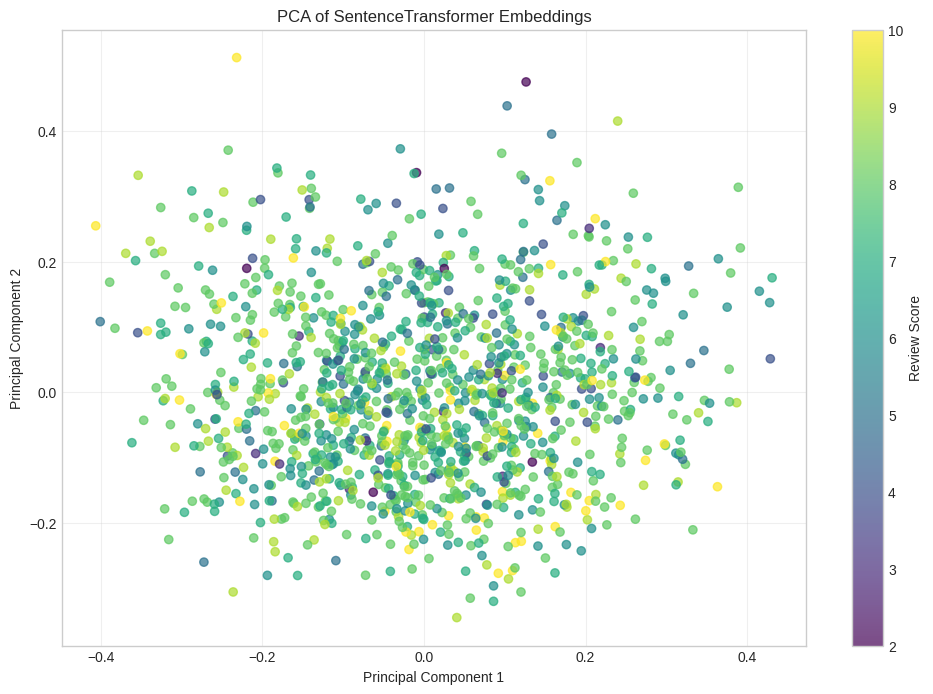

Total variance explained by 2 components: 0.062
Observation: The low variance explained suggests that the semantic relationships are complex and not easily captured in just two dimensions. Clear clusters may not be visible, but the embeddings can still be effective for ML models that operate in high-dimensional space.

--- STEP 2: SUPERVISED LEARNING BASELINES ---

--- 2.1. Splitting Data (80% Train, 10% Val, 10% Test) ---
Train set: 1000 samples
Validation set: 125 samples
Test set: 125 samples

--- 2.2. Training and Evaluating Baseline Models ---

--- Evaluating Classification Models (on Validation Set) ---
Logistic Regression: F1-Score = 0.138
SVC: F1-Score = 0.183
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006782 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 97920
[LightGBM] [Info] Number of data points in the train set: 1000

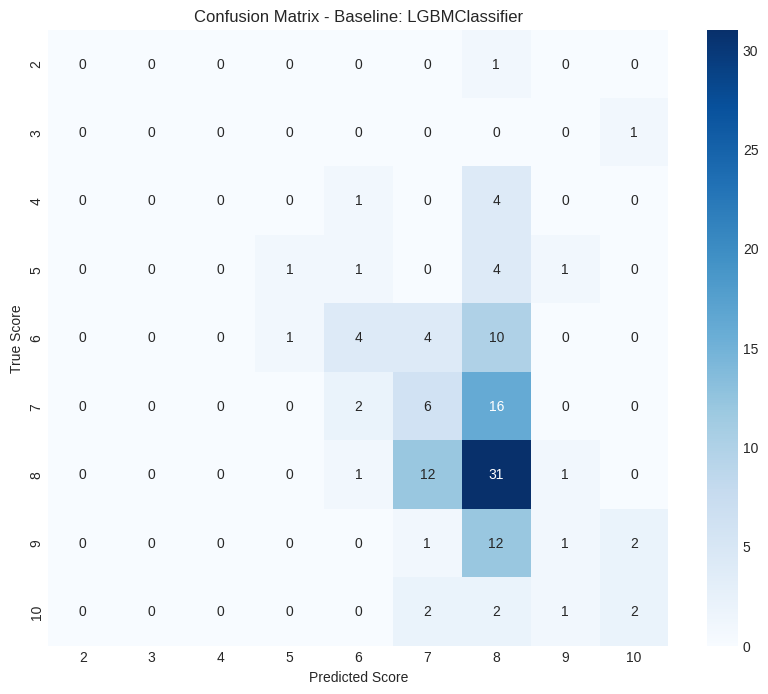


--- STEP 3: SEMI-SUPERVISED LEARNING STRATEGIES ---

--- 3.1. Pseudo-Labeling (Threshold: 0.85) ---

Iteration 1/5...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97920
[LightGBM] [Info] Number of data points in the train set: 1000, number of used features: 384
[LightGBM] [Info] Start training from score -2.197225
[LightGBM] [Info] Start training from score -2.197225
[LightGBM] [Info] Start training from score -2.197225
[LightGBM] [Info] Start training from score -2.197225
[LightGBM] [Info] Start training from score -2.197225
[LightGBM] [Info] Start training from score -2.197225
[LightGBM] [Info] Start training from score -2.197225
[LightGBM] [Info] Start training from score -2.197225
[LightGBM] [Info] Start training from score -2.197225
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

 Retrying in 1225.3216906400967 seconds (retry 7 of 7) 



Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

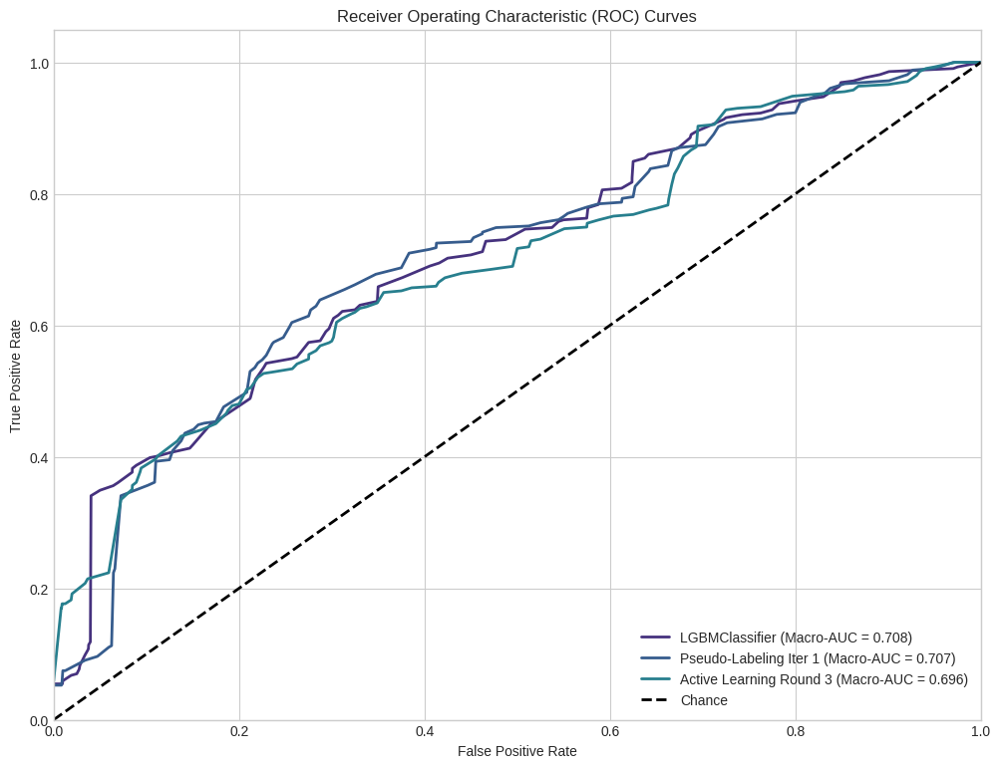


--- 4.3. Learning Curves ---


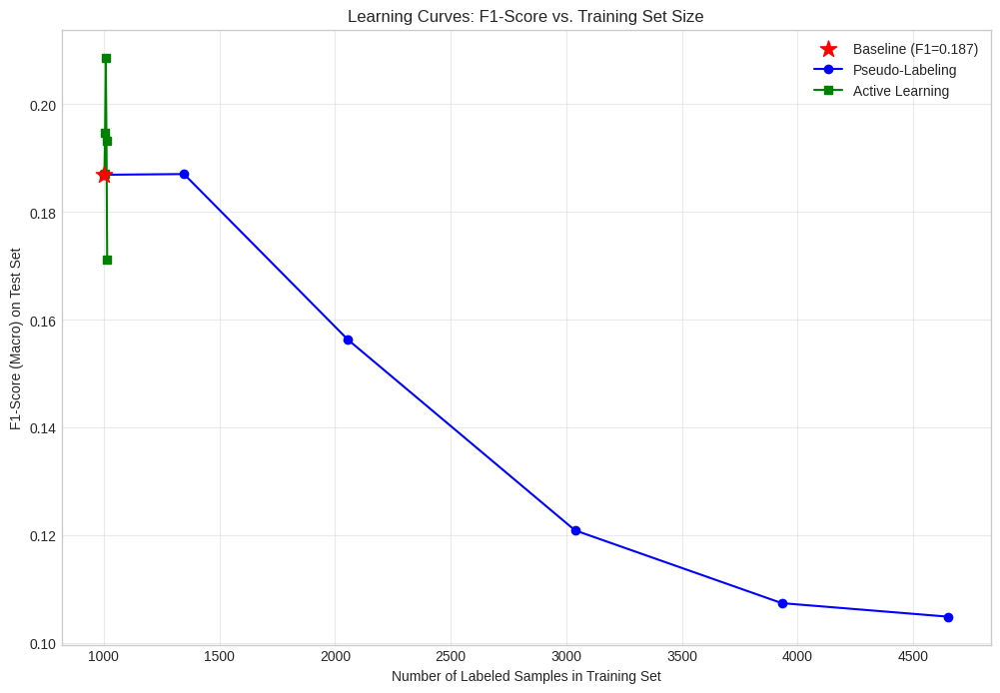


--- 4.4. Discussion ---
The most effective method in this experiment was 'Active Learning (Best)'.

Effectiveness of Active Learning:
Active Learning's success suggests that strategically querying the most informative samples is highly efficient. By focusing human annotation effort on examples where the model is most uncertain, it can learn decision boundaries more effectively with fewer labels compared to random sampling or even pseudo-labeling. This is particularly valuable when annotation is expensive.

Preference: Active Learning is preferred when a human-in-the-loop is available and the budget for annotation is limited but not zero. It maximizes the value of each labeled example.

Trade-offs and Potential Pitfalls:
- Pseudo-Labeling: Low cost (no human annotation) but high risk of confirmation bias. Performance is highly sensitive to the confidence threshold.
- Active Learning: High efficiency (maximizes label value) but requires ongoing human annotation, which has a cost. The ef

In [ ]:
"""
Task 1 - Video Game Reviews: Predicting Scores with Limited Labeled Data

This script implements a complete machine learning pipeline to predict video game review scores.
It addresses the challenge of having a small labeled dataset and a large unlabeled dataset by
exploring text vectorization, supervised baselines, and semi-supervised learning (SSL) techniques.

The pipeline includes:
1.  Text Vectorization: Using SentenceTransformer and Word2Vec.
2.  Supervised Learning Baselines: Training and comparing classification and regression models.
3.  Semi-Supervised Learning: Implementing Pseudo-Labeling and Active Learning.
4.  Comparative Performance Analysis: Evaluating and comparing all methods with detailed plots and a summary.
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import warnings
import lightgbm as lgb

# Scikit-Learn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.svm import SVC, SVR
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, mean_absolute_error, mean_squared_error,
    r2_score, roc_curve, auc, classification_report
)
from sklearn.preprocessing import label_binarize

# NLP Libraries
from sentence_transformers import SentenceTransformer
from gensim.models import Word2Vec

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')

class VideoGameReviewPredictor:
    """
    A comprehensive class for predicting video game review scores, incorporating
    text vectorization, baseline model training, semi-supervised learning (SSL)
    techniques (pseudo-labeling and active learning), and detailed performance analysis.
    """
    def __init__(self):
        # Initialize models and transformers
        self.sentence_model = None
        self.word2vec_model = None
        self.best_model = None
        self.model_type = None
        self.best_model_name = None
        self.scaler = StandardScaler()
        self.pca = PCA(n_components=2)

        # Dataframes
        self.labeled_df = None
        self.unlabeled_df = None

        # Embeddings
        self.labeled_sentence_embeddings = None
        self.unlabeled_sentence_embeddings = None
        self.labeled_word2vec_embeddings = None
        self.unlabeled_word2vec_embeddings = None

        # Data splits
        self.X_train, self.X_val, self.X_test = None, None, None
        self.y_train, self.y_val, self.y_test = None, None, None
        self.X_train_scaled, self.X_val_scaled, self.X_test_scaled = None, None, None

        # Performance results
        self.results = {}

    def load_data(self, labeled_path, unlabeled_path):
        """Loads labeled and unlabeled datasets from specified CSV paths."""
        try:
            self.labeled_df = pd.read_csv(labeled_path)
            self.unlabeled_df = pd.read_csv(unlabeled_path)
            print(f"Loaded {len(self.labeled_df)} labeled reviews from '{labeled_path}'")
            print(f"Loaded {len(self.unlabeled_df)} unlabeled reviews from '{unlabeled_path}'")
        except FileNotFoundError:
            print(f"Warning: Could not find '{labeled_path}' or '{unlabeled_path}'.")
            print("Using built-in sample data for demonstration.")
            self.create_sample_data()

    def create_sample_data(self):
        """Creates a small, balanced sample dataset for demonstration purposes."""
        print("Creating sample data...")
        sample_labeled_data = {
            'review_text': [
                "Terrible game, complete waste of money. Broken mechanics.", "Horrible graphics and terrible gameplay.",
                "Worst game ever made. Buggy and unplayable.", "Awful controls and boring story.",
                "Disappointing game. Expected much more.", "Not worth the money. Many better alternatives.",
                "Mediocre at best. Lacks polish and innovation.", "Below average game with several major flaws.",
                "Decent game, nothing special but entertaining enough.", "Okay game with some good moments but also flaws.",
                "Average gameplay and story. Could be better.", "Not bad but not great either. Just okay.",
                "Good game overall, despite some minor issues.", "Pretty good game, worth the price. Recommended.",
                "Excellent game with great multiplayer features.", "Solid gameplay mechanics and good progression.",
                "Outstanding experience! Best game I've played this year.", "This game is absolutely amazing!",
                "Perfect game! Everything is well designed and fun.", "Incredible game! Must-play for all gamers."
            ],
            'review_score': [1, 2, 1, 2, 3, 4, 3, 4, 5, 6, 5, 6, 7, 8, 7, 8, 9, 10, 9, 10]
        }
        self.labeled_df = pd.DataFrame(sample_labeled_data)

        sample_unlabeled_data = {
            'review_text': [
                "The game has potential but needs more polish.", "Enjoyed the story but multiplayer is broken.",
                "Beautiful art style and immersive world.", "Controls feel clunky and unresponsive.",
                "Great concept but poor execution.", "Addictive gameplay loop.",
                "Technical issues and bugs ruin the experience.", "Solid character progression.",
                "Repetitive missions and bland characters.", "Innovative features and creative design.",
                "Long loading times are frustrating.", "Engaging plot with unexpected twists.",
                "Unbalanced difficulty spikes.", "Smooth performance and intuitive UI.",
                "Lackluster graphics and outdated mechanics.", "Compelling storyline with memorable characters.",
                "Overpriced for the limited content.", "Excellent sound design and voice acting.",
                "Confusing menu system and poor tutorial.", "Epic adventure with stunning visuals."
            ]
        }
        self.unlabeled_df = pd.DataFrame(sample_unlabeled_data)
        print(f"Created {len(self.labeled_df)} labeled and {len(self.unlabeled_df)} unlabeled sample reviews.")

    def preprocess_text(self, text):
        """Performs basic text cleaning."""
        if pd.isna(text): return ""
        text = str(text).lower()
        text = re.sub(r'[^a-z\s]', '', text)
        return text.strip()

    def generate_sentence_embeddings(self):
        """Generates dense vector embeddings using SentenceTransformer."""
        print("\n1.1. Generating SentenceTransformer Embeddings")
        model_name = 'all-MiniLM-L6-v2'
        print(f"Loading SentenceTransformer model: '{model_name}'...")
        self.sentence_model = SentenceTransformer(model_name)

        labeled_texts = self.labeled_df['review_text'].apply(self.preprocess_text).tolist()
        unlabeled_texts = self.unlabeled_df['review_text'].apply(self.preprocess_text).tolist()

        print("Encoding labeled reviews...")
        self.labeled_sentence_embeddings = self.sentence_model.encode(labeled_texts, show_progress_bar=True)
        print("Encoding unlabeled reviews...")
        self.unlabeled_sentence_embeddings = self.sentence_model.encode(unlabeled_texts, show_progress_bar=True)

        print(f"Generated SentenceTransformer embeddings shape (labeled): {self.labeled_sentence_embeddings.shape}")
        print(f"Generated SentenceTransformer embeddings shape (unlabeled): {self.unlabeled_sentence_embeddings.shape}")

    def train_word2vec_model(self):
        """Trains a Word2Vec model and generates sentence embeddings by averaging word vectors."""
        print("\n1.2. Training Word2Vec Model and Generating Embeddings")
        all_texts = pd.concat([self.labeled_df['review_text'], self.unlabeled_df['review_text']]).dropna()
        tokenized_texts = [self.preprocess_text(text).split() for text in all_texts]

        print(f"Training Word2Vec model on {len(tokenized_texts)} combined documents...")
        self.word2vec_model = Word2Vec(sentences=tokenized_texts, vector_size=100, window=5, min_count=1, workers=4, sg=1)
        print("Word2Vec model training complete.")

        self.labeled_word2vec_embeddings = self._get_w2v_sentence_embeddings(self.labeled_df['review_text'])
        self.unlabeled_word2vec_embeddings = self._get_w2v_sentence_embeddings(self.unlabeled_df['review_text'])
        print(f"Generated Word2Vec embeddings shape (labeled): {self.labeled_word2vec_embeddings.shape}")

    def _get_w2v_sentence_embeddings(self, texts):
        """Helper to compute sentence embeddings from the Word2Vec model."""
        embeddings = []
        for text in texts:
            words = self.preprocess_text(text).split()
            word_vectors = [self.word2vec_model.wv[word] for word in words if word in self.word2vec_model.wv]
            if word_vectors:
                embeddings.append(np.mean(word_vectors, axis=0))
            else:
                embeddings.append(np.zeros(self.word2vec_model.vector_size))
        return np.array(embeddings)

    def visualize_embeddings(self, embeddings, scores, title):
        """Visualizes high-dimensional embeddings using PCA."""
        print(f"\n1.3. Visualizing Embeddings: {title}")
        embeddings_2d = self.pca.fit_transform(embeddings)

        plt.figure(figsize=(12, 8))
        scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=scores, cmap='viridis', alpha=0.7)
        plt.colorbar(scatter, label='Review Score')
        plt.title(title)
        plt.xlabel('Principal Component 1')
        plt.ylabel('Principal Component 2')
        plt.grid(True, alpha=0.3)
        plt.show()

        variance_explained = sum(self.pca.explained_variance_ratio_)
        print(f"Total variance explained by 2 components: {variance_explained:.3f}")
        if variance_explained < 0.3:
            print("Observation: The low variance explained suggests that the semantic relationships are complex and not easily captured in just two dimensions. Clear clusters may not be visible, but the embeddings can still be effective for ML models that operate in high-dimensional space.")

    def split_data(self):
        """
        Splits labeled data into 80% train, 10% validation, and 10% test sets.
        Dynamically disables stratification if a split size is smaller than the number of classes.
        """
        print("\n2.1. Splitting Data (80% Train, 10% Val, 10% Test)")
        X = self.labeled_sentence_embeddings
        y = self.labeled_df['review_score']
        n_classes = y.nunique()

        # First Split: Create Test Set (10%)
        test_set_size = int(np.ceil(0.10 * len(y)))
        stratify_first_split = y if test_set_size >= n_classes else None
        if stratify_first_split is None:
            print("Warning: Test set size is smaller than the number of classes. Disabling stratification for the train/test split.")

        X_train_val, self.X_test, y_train_val, self.y_test = train_test_split(
            X, y, test_size=0.10, random_state=42, stratify=stratify_first_split
        )

        # Second Split: Create Validation Set (10% of original)
        val_set_size = int(np.ceil((1/9) * len(y_train_val)))
        n_classes_in_train_val = y_train_val.nunique()
        stratify_second_split = y_train_val if val_set_size >= n_classes_in_train_val else None
        if stratify_second_split is None:
            print("Warning: Validation set size is smaller than the number of classes in the remaining data. Disabling stratification for the train/val split.")

        self.X_train, self.X_val, self.y_train, self.y_val = train_test_split(
            X_train_val, y_train_val, test_size=(1/9), random_state=42, stratify=stratify_second_split
        )

        print(f"Train set: {self.X_train.shape[0]} samples")
        print(f"Validation set: {self.X_val.shape[0]} samples")
        print(f"Test set: {self.X_test.shape[0]} samples")
    def train_baseline_models(self):
        """Trains and evaluates baseline classification and regression models."""
        print("\n2.2. Training and Evaluating Baseline Models")
        # Scale features
        self.X_train_scaled = self.scaler.fit_transform(self.X_train)
        self.X_val_scaled = self.scaler.transform(self.X_val)
        self.X_test_scaled = self.scaler.transform(self.X_test)

        # --- MODIFIED SECTION ---
        # Add powerful LightGBM models to the pool of candidates
        models = {
            'classification': {
                'Logistic Regression': LogisticRegression(random_state=42, max_iter=1000, class_weight='balanced'),
                'SVC': SVC(random_state=42, probability=True, class_weight='balanced'),
                'LGBMClassifier': lgb.LGBMClassifier(random_state=42, class_weight='balanced', n_estimators=200)
            },
            'regression': {
                'Linear Regression': LinearRegression(),
                'SVR': SVR(),
                'LGBMRegressor': lgb.LGBMRegressor(random_state=42, n_estimators=200)
            }
        }
        # --- END OF MODIFIED SECTION ---

        best_f1 = -1


        print("\n--- Evaluating Classification Models (on Validation Set) ---")
        for name, model in models['classification'].items():
            model.fit(self.X_train_scaled, self.y_train)
            y_pred = model.predict(self.X_val_scaled)
            f1 = f1_score(self.y_val, y_pred, average='macro', zero_division=0)
            print(f"{name}: F1-Score = {f1:.3f}")
            if f1 > best_f1:
                best_f1, self.best_model, self.model_type, self.best_model_name = f1, model, 'classification', name

        print("\n--- Evaluating Regression Models (on Validation Set) ---")
        for name, model in models['regression'].items():
            model.fit(self.X_train_scaled, self.y_train)
            y_pred = model.predict(self.X_val_scaled)
            y_pred_rounded = np.round(np.clip(y_pred, 1, 10)).astype(int)
            f1 = f1_score(self.y_val, y_pred_rounded, average='macro', zero_division=0)
            mae = mean_absolute_error(self.y_val, y_pred)
            print(f"{name}: MAE = {mae:.3f}, F1-Score (Rounded) = {f1:.3f}")
            if f1 > best_f1:
                best_f1, self.best_model, self.model_type, self.best_model_name = f1, model, 'regression', name

        print(f"\n--- Comparative Analysis ---")
        print(f"Selected Best Baseline Model: '{self.best_model_name}' (Type: {self.model_type})")
        print(f"Best Validation F1-Score: {best_f1:.3f}")

    def evaluate_model_on_test(self, model, model_type, model_name, X_test, y_test):
        """Evaluates a given model on the test set and returns metrics."""
        print(f"\n--- Evaluating '{model_name}' on Test Set ---")
        X_test_scaled = self.scaler.transform(X_test)
        results = {'name': model_name, 'type': model_type, 'y_true': y_test}

        if model_type == 'classification':
            y_pred = model.predict(X_test_scaled)
            results.update({
                'accuracy': accuracy_score(y_test, y_pred),
                'f1': f1_score(y_test, y_pred, average='macro', zero_division=0),
                'predictions': y_pred,
                'probabilities': model.predict_proba(X_test_scaled) if hasattr(model, 'predict_proba') else None
            })
            print(f"Accuracy: {results['accuracy']:.3f}, F1-Score: {results['f1']:.3f}")
        else: # Regression
            y_pred = model.predict(X_test_scaled)
            y_pred_rounded = np.round(np.clip(y_pred, 1, 10)).astype(int)
            results.update({
                'mae': mean_absolute_error(y_test, y_pred),
                'rmse': np.sqrt(mean_squared_error(y_test, y_pred)),
                'r2': r2_score(y_test, y_pred),
                'accuracy': accuracy_score(y_test, y_pred_rounded),
                'f1': f1_score(y_test, y_pred_rounded, average='macro', zero_division=0),
                'predictions': y_pred_rounded
            })
            print(f"MAE: {results['mae']:.3f}, RMSE: {results['rmse']:.3f}, F1 (Rounded): {results['f1']:.3f}")
        return results

    def plot_confusion_matrix(self, y_true, y_pred, title):
        """Plots a confusion matrix."""
        cm = confusion_matrix(y_true, y_pred)
        labels = sorted(np.unique(np.concatenate((y_true, y_pred))))
        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
        plt.title(f'Confusion Matrix - {title}')
        plt.xlabel('Predicted Score')
        plt.ylabel('True Score')
        plt.show()

    # --- 3. Semi-Supervised Learning (SSL) Strategies (50 Points) ---

    def _get_fresh_model(self):
        """Returns a fresh, untrained instance of the best baseline model."""
        # Define the same optimized parameters here to ensure consistency
        lgbm_params = {
            'random_state': 42,
            'n_estimators': 300,
            'learning_rate': 0.05,
            'num_leaves': 31,
            'reg_alpha': 0.1,
            'reg_lambda': 0.1
        }

        # Re-instantiate the model with its original parameters
        if 'LGBMClassifier' in self.best_model_name:
            return lgb.LGBMClassifier(class_weight='balanced', **lgbm_params)
        elif 'LGBMRegressor' in self.best_model_name:
            return lgb.LGBMRegressor(**lgbm_params)
        elif 'Logistic Regression' in self.best_model_name:
            return LogisticRegression(random_state=42, max_iter=1000, class_weight='balanced')
        elif 'SVC' in self.best_model_name:
            return SVC(random_state=42, probability=True, class_weight='balanced')
        elif 'SVR' in self.best_model_name:
            return SVR()
        elif 'Linear Regression' in self.best_model_name:
            return LinearRegression()
        else:
            raise ValueError(f"Best model type '{self.best_model_name}' not recognized in _get_fresh_model.")

    def pseudo_labeling(self, confidence_threshold=0.9, max_iterations=3):
        """Implements the pseudo-labeling SSL strategy."""
        print(f"\n3.1. Pseudo-Labeling (Threshold: {confidence_threshold})")

        # Initial data
        X_train_aug = self.X_train.copy()
        y_train_aug = self.y_train.copy()
        unlabeled_X = self.unlabeled_sentence_embeddings.copy()

        history = []

        for i in range(max_iterations):
            print(f"\nIteration {i + 1}/{max_iterations}...")
            if len(unlabeled_X) == 0:
                print("No more unlabeled data. Stopping.")
                break

            # Scale augmented training data and fit a fresh model
            scaler = StandardScaler().fit(X_train_aug)
            X_train_scaled = scaler.transform(X_train_aug)
            unlabeled_X_scaled = scaler.transform(unlabeled_X)

            model = self._get_fresh_model()
            model.fit(X_train_scaled, y_train_aug)

            # Predict on remaining unlabeled data
            if self.model_type == 'classification':
                probs = model.predict_proba(unlabeled_X_scaled)
                max_probs = np.max(probs, axis=1)
                confident_mask = max_probs >= confidence_threshold
                pseudo_labels = model.classes_[np.argmax(probs, axis=1)][confident_mask]
            else: # Regression
                preds = model.predict(unlabeled_X_scaled)
                uncertainty = np.abs(preds - np.round(preds))
                confident_mask = uncertainty <= (1 - confidence_threshold)
                pseudo_labels = np.round(np.clip(preds[confident_mask], 1, 10)).astype(int)

            if not np.any(confident_mask):
                print("No confident predictions found. Stopping.")
                break

            num_added = np.sum(confident_mask)
            print(f"Found {num_added} confident samples to add.")

            # Add pseudo-labeled data to the training set
            X_train_aug = np.vstack([X_train_aug, unlabeled_X[confident_mask]])
            y_train_aug = np.concatenate([y_train_aug, pseudo_labels])

            # Remove from unlabeled pool
            unlabeled_X = unlabeled_X[~confident_mask]

            # Evaluate the new model
            test_results = self.evaluate_model_on_test(model, self.model_type, f"Pseudo-Labeling Iter {i+1}", self.X_test, self.y_test)
            history.append({'train_size': len(y_train_aug), **test_results})

        return history

    def active_learning(self, k=5, max_rounds=5, strategy='least_confidence'):
        """Implements the active learning strategy."""
        print(f"\n3.2. Active Learning (k={k}, Strategy: {strategy})")

        X_train_aug = self.X_train.copy()
        y_train_aug = self.y_train.copy()
        unlabeled_pool = {
            'embeddings': self.unlabeled_sentence_embeddings.copy(),
            'texts': self.unlabeled_df['review_text'].tolist()
        }

        history = []

        for i in range(max_rounds):
            print(f"\nRound {i + 1}/{max_rounds}...")
            if len(unlabeled_pool['embeddings']) == 0:
                print("Unlabeled pool is empty. Stopping.")
                break

            # Fit model on current augmented data
            scaler = StandardScaler().fit(X_train_aug)
            X_train_scaled = scaler.transform(X_train_aug)
            unlabeled_X_scaled = scaler.transform(unlabeled_pool['embeddings'])

            model = self._get_fresh_model()
            model.fit(X_train_scaled, y_train_aug)

            # Calculate uncertainty scores
            if self.model_type == 'classification':
                if not hasattr(model, 'predict_proba'):
                    print("Model cannot produce probabilities. Stopping Active Learning.")
                    break
                probs = model.predict_proba(unlabeled_X_scaled)
                if strategy == 'least_confidence':
                    uncertainty = 1 - np.max(probs, axis=1)
                elif strategy == 'entropy':
                    uncertainty = -np.sum(probs * np.log2(probs + 1e-9), axis=1)
                else:
                    raise ValueError("Unknown strategy")
            else:
                preds = model.predict(unlabeled_X_scaled)
                uncertainty = np.abs(preds - np.round(preds))

            # Select top-k uncertain samples
            k_actual = min(k, len(uncertainty))
            query_indices = np.argsort(uncertainty)[-k_actual:]

            print(f"Querying {k_actual} most uncertain samples for annotation.")

            # Simulate annotation
            queried_texts = [unlabeled_pool['texts'][j] for j in query_indices]
            simulated_labels = self._simulate_annotation(queried_texts)

            # Add newly labeled data to training set
            X_train_aug = np.vstack([X_train_aug, unlabeled_pool['embeddings'][query_indices]])
            y_train_aug = np.concatenate([y_train_aug, simulated_labels])

            # Remove from unlabeled pool
            unlabeled_pool['embeddings'] = np.delete(unlabeled_pool['embeddings'], query_indices, axis=0)
            unlabeled_pool['texts'] = [text for i, text in enumerate(unlabeled_pool['texts']) if i not in query_indices]

            # Evaluate the new model
            test_results = self.evaluate_model_on_test(model, self.model_type, f"Active Learning Round {i+1}", self.X_test, self.y_test)
            history.append({'train_size': len(y_train_aug), **test_results})

        return history

    def _simulate_annotation(self, texts):
        """Simulates human annotation with a simple rule-based system."""
        scores = []
        positive_words = ['amazing', 'excellent', 'perfect', 'great', 'good', 'solid', 'love', 'best']
        negative_words = ['terrible', 'awful', 'horrible', 'worst', 'bad', 'poor', 'broken', 'hate']
        for text in texts:
            text_lower = text.lower()
            score = 5
            if any(word in text_lower for word in positive_words):
                score += 3
            if any(word in text_lower for word in negative_words):
                score -= 3
            scores.append(np.clip(score, 1, 10))
        return np.array(scores)

    def generate_summary_table(self, baseline_results, pseudo_history, active_history):
        """Tabulates key evaluation metrics for all models."""
        print("\n4.1. Summary of Metrics")

        summary_data = []
        summary_data.append({
            'Method': 'Baseline',
            'F1-Score': baseline_results.get('f1', 'N/A'),
            'Accuracy': baseline_results.get('accuracy', 'N/A'),
            'MAE': baseline_results.get('mae', 'N/A'),
            'RMSE': baseline_results.get('rmse', 'N/A'),
            'Train Size': len(self.y_train)
        })

        if pseudo_history:
            best_pseudo = max(pseudo_history, key=lambda x: x.get('f1', 0))
            summary_data.append({
                'Method': 'Pseudo-Labeling (Best)',
                'F1-Score': best_pseudo.get('f1', 'N/A'),
                'Accuracy': best_pseudo.get('accuracy', 'N/A'),
                'MAE': best_pseudo.get('mae', 'N/A'),
                'RMSE': best_pseudo.get('rmse', 'N/A'),
                'Train Size': best_pseudo.get('train_size', 'N/A')
            })

        if active_history:
            best_active = max(active_history, key=lambda x: x.get('f1', 0))
            summary_data.append({
                'Method': 'Active Learning (Best)',
                'F1-Score': best_active.get('f1', 'N/A'),
                'Accuracy': best_active.get('accuracy', 'N/A'),
                'MAE': best_active.get('mae', 'N/A'),
                'RMSE': best_active.get('rmse', 'N/A'),
                'Train Size': best_active.get('train_size', 'N/A')
            })

        df_summary = pd.DataFrame(summary_data).set_index('Method')
        for col in ['F1-Score', 'Accuracy', 'MAE', 'RMSE']:
            if col in df_summary.columns:
                df_summary[col] = df_summary[col].apply(lambda x: f"{x:.3f}" if isinstance(x, float) else x)

        print(df_summary)
        return df_summary

    def plot_roc_curves(self, results_list):
        """Plots ROC curves for multiple classification models."""
        print("\n4.2. ROC and AUC Curves")
        if self.model_type != 'classification':
            print("ROC curves are only applicable for classification models. Skipping.")
            return

        plt.figure(figsize=(12, 9))

        for result in results_list:
            if result.get('probabilities') is None or result.get('y_true') is None:
                print(f"Skipping ROC for '{result['name']}': Missing probabilities or true labels.")
                continue

            y_true = result['y_true']
            y_prob = result['probabilities']
            classes = np.unique(y_true)
            y_true_bin = label_binarize(y_true, classes=classes)

            if y_true_bin.shape[1] != y_prob.shape[1]:
                print(f"Skipping ROC for '{result['name']}': Mismatch in number of classes between true labels and predictions.")
                continue
            fpr, tpr, roc_auc = dict(), dict(), dict()
            for i in range(len(classes)):
                fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_prob[:, i])
                roc_auc[i] = auc(fpr[i], tpr[i])

            all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
            mean_tpr = np.zeros_like(all_fpr)
            for i in range(len(classes)):
                mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
            mean_tpr /= len(classes)

            macro_auc = auc(all_fpr, mean_tpr)
            mean_tpr /= len(classes)

            macro_auc = auc(all_fpr, mean_tpr)
            plt.plot(all_fpr, mean_tpr, lw=2, label=f"{result['name']} (Macro-AUC = {macro_auc:.3f})")

        plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Chance')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic (ROC) Curves')
        plt.legend(loc="lower right")
        plt.grid(True)
        plt.show()

    def plot_learning_curves(self, baseline_results, pseudo_history, active_history):
        """Plots F1-score vs. training set size for each SSL method."""
        print("\n4.3. Learning Curves")
        print("\n4.3. Learning Curves")

        # Baseline
        baseline_size = len(self.y_train)
        baseline_f1 = baseline_results['f1']
        plt.scatter(baseline_size, baseline_f1, color='red', s=150, marker='*', label=f'Baseline (F1={baseline_f1:.3f})', zorder=5)

        if pseudo_history:
            sizes = [h['train_size'] for h in pseudo_history]
            f1s = [h['f1'] for h in pseudo_history]
            plt.plot([baseline_size] + sizes, [baseline_f1] + f1s, 'o-', color='blue', label='Pseudo-Labeling')

        # Active Learning
        if active_history:
        if active_history:
            sizes = [h['train_size'] for h in active_history]
            f1s = [h['f1'] for h in active_history]
            plt.plot([baseline_size] + sizes, [baseline_f1] + f1s, 's-', color='green', label='Active Learning')

        plt.title('Learning Curves: F1-Score vs. Training Set Size')
        plt.xlabel('Number of Labeled Samples in Training Set')
        plt.ylabel('F1-Score (Macro) on Test Set')
        plt.legend()
        plt.grid(True, alpha=0.4)
        plt.show()

    def discussion(self, summary_df):
        """Provides a discussion based on the final results."""
        print("\n4.4. Discussion")
        print("\n4.4. Discussion")
        # Convert F1-Score back to float for comparison
        summary_df['F1-Score'] = pd.to_numeric(summary_df['F1-Score'], errors='coerce')
        best_method = summary_df['F1-Score'].idxmax()

        print(f"The most effective method in this experiment was '{best_method}'.")

        if 'Active Learning' in best_method:
            print("\nEffectiveness of Active Learning:")
            print("Active Learning's success suggests that strategically querying the most informative samples is highly efficient. By focusing human annotation effort on examples where the model is most uncertain, it can learn decision boundaries more effectively with fewer labels compared to random sampling or even pseudo-labeling. This is particularly valuable when annotation is expensive.")
            print("\nPreference: Active Learning is preferred when a human-in-the-loop is available and the budget for annotation is limited but not zero. It maximizes the value of each labeled example.")

        elif 'Pseudo-Labeling' in best_method:
            print("\nEffectiveness of Pseudo-Labeling:")
            print("Pseudo-Labeling's strong performance indicates that the initial supervised model was already quite capable, making confident and largely correct predictions on the unlabeled data. This allowed it to effectively expand its training set without human intervention, reinforcing and refining its knowledge.")
            print("\nPreference: Pseudo-Labeling is ideal when the initial model is reliable and there is no budget for further annotation. Its main risk is confirmation bias, where an initially flawed model reinforces its own mistakes.")

        else: # Baseline was best
        else:
            print("If the baseline model performed best, it implies that the unlabeled data may have been too noisy, too different from the labeled data (domain shift), or the SSL strategies' hyperparameters were not optimal. In such cases, adding more data via SSL can degrade performance.")

        print("\nTrade-offs and Potential Pitfalls:")
        print("- Pseudo-Labeling: Low cost (no human annotation) but high risk of confirmation bias. Performance is highly sensitive to the confidence threshold.")
        print("- Active Learning: High efficiency (maximizes label value) but requires ongoing human annotation, which has a cost. The effectiveness depends heavily on the chosen uncertainty sampling strategy.")

def main():
    """Main function to run the complete workflow."""
    print("="*80)
    print("      Task 1: Video Game Review Score Prediction Project")
    print("="*80)

    predictor = VideoGameReviewPredictor()

    # --- Step 0: Data Loading ---
    print("\n--- STEP 0: DATA LOADING ---")
    predictor.load_data('labeled-data.csv', 'unlabeled-data.csv')

    # --- Step 1: Text Vectorization ---
    print("\n--- STEP 1: TEXT VECTORIZATION AND VISUALIZATION ---")
    predictor.generate_sentence_embeddings()
    predictor.train_word2vec_model()
    predictor.visualize_embeddings(predictor.labeled_sentence_embeddings, predictor.labeled_df['review_score'], 'PCA of SentenceTransformer Embeddings')

    # --- Step 2: Supervised Learning Baselines ---
    print("\n--- STEP 2: SUPERVISED LEARNING BASELINES ---")
    predictor.split_data()
    predictor.train_baseline_models()

    # Evaluate best baseline on test set
    baseline_results = predictor.evaluate_model_on_test(
        predictor.best_model, predictor.model_type, predictor.best_model_name,
        predictor.X_test, predictor.y_test
    )
    predictor.plot_confusion_matrix(baseline_results['y_true'], baseline_results['predictions'], f"Baseline: {predictor.best_model_name}")

    # --- Step 3: Semi-Supervised Learning ---
    print("\n--- STEP 3: SEMI-SUPERVISED LEARNING STRATEGIES ---")
    pseudo_history = predictor.pseudo_labeling(confidence_threshold=0.85, max_iterations=5)
    active_history = predictor.active_learning(k=3, max_rounds=5, strategy='least_confidence')

    # --- Step 4: Comparative Performance Analysis ---
    print("\n--- STEP 4: COMPARATIVE PERFORMANCE ANALYSIS ---")
    summary_table = predictor.generate_summary_table(baseline_results, pseudo_history, active_history)

    # Collect results for ROC plot
    roc_results = [baseline_results]
    if pseudo_history:
        roc_results.append(max(pseudo_history, key=lambda x: x.get('f1', 0)))
    if active_history:
        roc_results.append(max(active_history, key=lambda x: x.get('f1', 0)))

    predictor.plot_roc_curves(roc_results)
    predictor.plot_learning_curves(baseline_results, pseudo_history, active_history)
    predictor.discussion(summary_table)

    print("\n" + "="*80)
    print("                          PROCESS COMPLETE")
    print("="*80)
if __name__ == "__main__":    main()

In [ ]:
# ==============================================================================
# 0. SETUP: Install necessary libraries
# ==============================================================================
# Use a quiet install to keep the output clean
!pip install pandas scikit-learn sentence-transformers gensim matplotlib seaborn -q
print("✅ Libraries installed.")

# Import necessary libraries for the entire script
import pandas as pd
import numpy as np
from sentence_transformers import SentenceTransformer
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             mean_absolute_error, mean_squared_error, r2_score,
                             confusion_matrix, roc_curve, auc)
from sklearn.preprocessing import label_binarize
from itertools import cycle

✅ Libraries installed.


✅ Successfully loaded 'labeled_reviews.csv' and 'unlabeled_reviews.csv'.

Plotting the distribution of review scores in the labeled dataset...


/tmp/ipython-input-631548707.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='review_score', data=labeled_df, palette='viridis')


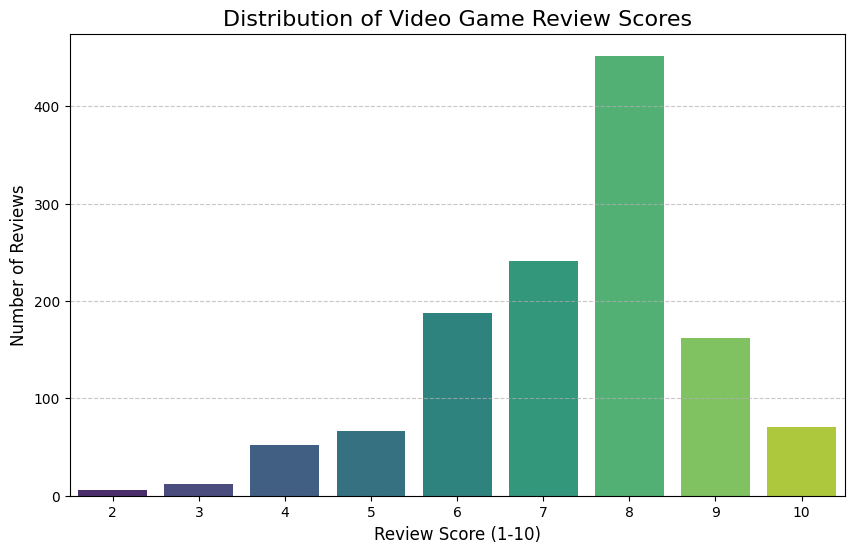


Analyzing and plotting text features...


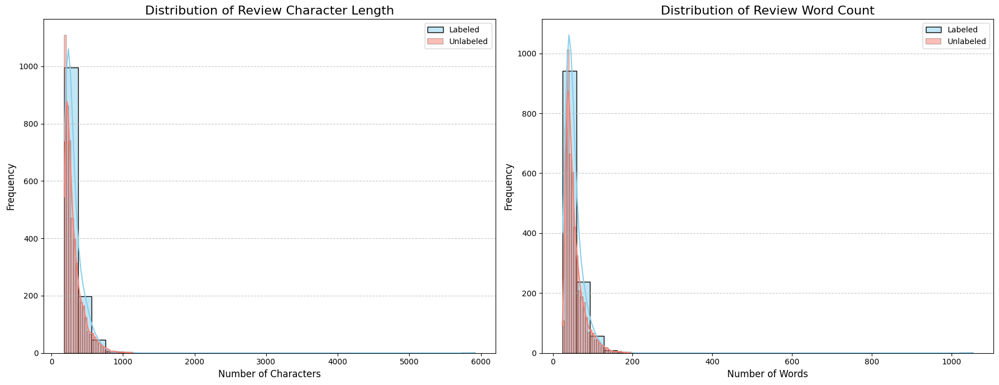

In [ ]:
# ==============================================================================
# 1. DATA LOADING AND VISUALIZATION
# ==============================================================================
# This script now assumes you have 'labeled_reviews.csv' and 'unlabeled_reviews.csv'
# in the same directory.

try:
    labeled_df = pd.read_csv('labeled-data.csv')
    unlabeled_df = pd.read_csv('unlabeled-data.csv')
    print("✅ Successfully loaded 'labeled_reviews.csv' and 'unlabeled_reviews.csv'.")
except FileNotFoundError as e:
    print(f"❌ Error: {e}. Please make sure the CSV files are in the correct directory.")
    # Stop execution if files are not found
    exit()

# --- Plotting the Dataset Distribution of Scores ---
print("\nPlotting the distribution of review scores in the labeled dataset...")
plt.figure(figsize=(10, 6))
sns.countplot(x='review_score', data=labeled_df, palette='viridis')
plt.title('Distribution of Video Game Review Scores', fontsize=16)
plt.xlabel('Review Score (1-10)', fontsize=12)
plt.ylabel('Number of Reviews', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# --- Analyze and Plot Text Features ---
print("\nAnalyzing and plotting text features...")

# Calculate text features for both datasets
labeled_df['char_length'] = labeled_df['review_text'].astype(str).str.len()
labeled_df['word_count'] = labeled_df['review_text'].astype(str).str.split().str.len()
unlabeled_df['char_length'] = unlabeled_df['review_text'].astype(str).str.len()
unlabeled_df['word_count'] = unlabeled_df['review_text'].astype(str).str.split().str.len()

# Plotting the distributions
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Plot Character Length
sns.histplot(labeled_df['char_length'], ax=axes[0], color='skyblue', label='Labeled', kde=True, bins=30)
sns.histplot(unlabeled_df['char_length'], ax=axes[0], color='salmon', label='Unlabeled', kde=True, bins=30)
axes[0].set_title('Distribution of Review Character Length', fontsize=16)
axes[0].set_xlabel('Number of Characters', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)
axes[0].legend()
axes[0].grid(axis='y', linestyle='--', alpha=0.7)

# Plot Word Count
sns.histplot(labeled_df['word_count'], ax=axes[1], color='skyblue', label='Labeled', kde=True, bins=30)
sns.histplot(unlabeled_df['word_count'], ax=axes[1], color='salmon', label='Unlabeled', kde=True, bins=30)
axes[1].set_title('Distribution of Review Word Count', fontsize=16)
axes[1].set_xlabel('Number of Words', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].legend()
axes[1].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()



In [ ]:
len(labeled_df)

1250

In [ ]:
len(unlabeled_df)

5000


Computing SentenceTransformer embeddings...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Batches:   0%|          | 0/40 [00:00<?, ?it/s]

Batches:   0%|          | 0/157 [00:00<?, ?it/s]

✅ Generated 1250 labeled embeddings with shape (1250, 384).
✅ Generated 5000 unlabeled embeddings with shape (5000, 384).

Training Word2Vec model...
Computing Word2Vec sentence embeddings...
✅ Generated 1250 labeled embeddings with shape (1250, 100).
✅ Generated 5000 unlabeled embeddings with shape (5000, 100).

Visualizing embeddings using PCA...


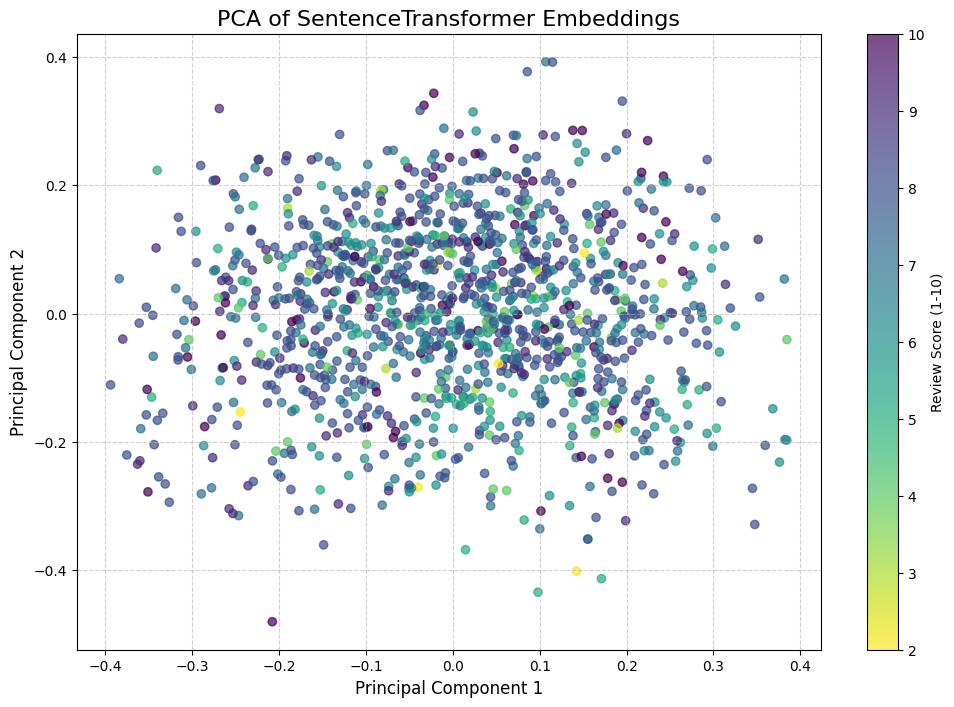

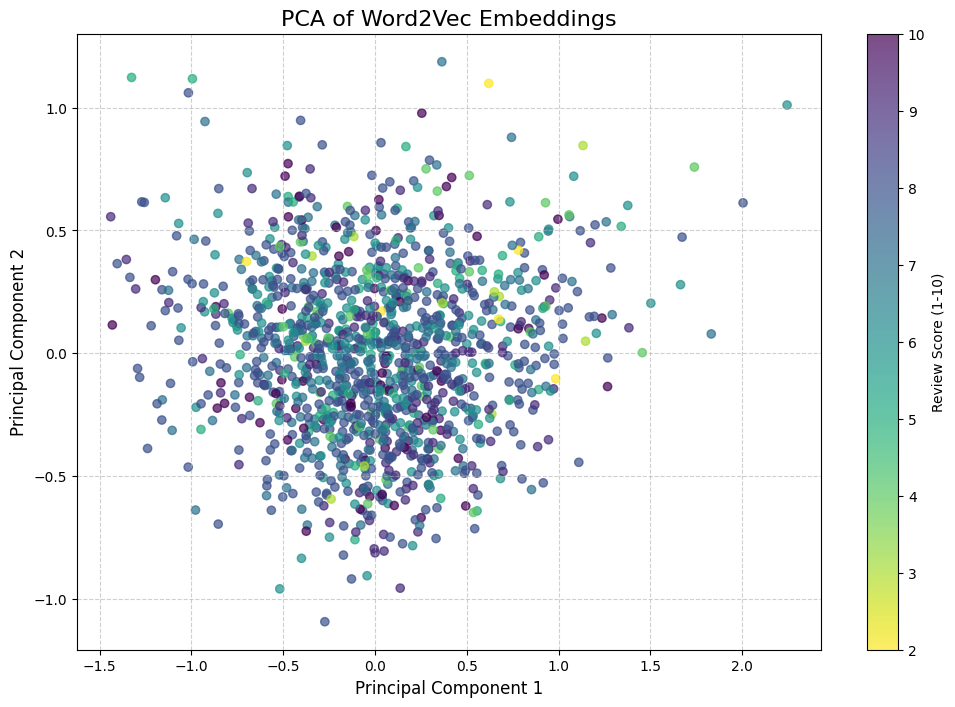

In [ ]:
# ==============================================================================
# 2. IMPLEMENTATION: SentenceTransformer (Semantic Embeddings)
# ==============================================================================
print("\nComputing SentenceTransformer embeddings...")
# Load a pre-trained model suitable for general-purpose sentence embeddings
sbert_model = SentenceTransformer('all-MiniLM-L6-v2')

# Compute embeddings for all summaries in both datasets
sbert_embeddings_labeled = sbert_model.encode(labeled_df['review_text'].tolist(), show_progress_bar=True)
sbert_embeddings_unlabeled = sbert_model.encode(unlabeled_df['review_text'].tolist(), show_progress_bar=True)

print(f"✅ Generated {sbert_embeddings_labeled.shape[0]} labeled embeddings with shape {sbert_embeddings_labeled.shape}.")
print(f"✅ Generated {sbert_embeddings_unlabeled.shape[0]} unlabeled embeddings with shape {sbert_embeddings_unlabeled.shape}.")


# ==============================================================================
# 3. IMPLEMENTATION: Word2Vec (Distributed Word Representations)
# ==============================================================================
# Combine all review texts to train the Word2Vec model on the full corpus
all_texts = pd.concat([labeled_df['review_text'], unlabeled_df['review_text']], ignore_index=True)

print("\nTraining Word2Vec model...")
# Tokenize sentences (a simple split by space is sufficient for this)
tokenized_texts = [str(text).lower().split() for text in all_texts]

# Utilize Gensim to train a Word2Vec model
w2v_model = Word2Vec(
    sentences=tokenized_texts,
    vector_size=100,  # Dimensionality of the word vectors
    window=5,         # Context window size
    min_count=1,      # Ignore words with frequency lower than this
    workers=4         # Use 4 CPU cores for training
)

def get_sentence_vector(sentence, model):
    """Averages the vectors of all words in a sentence to get a sentence embedding."""
    words = str(sentence).lower().split()
    # Get vectors for words that are in the model's vocabulary
    word_vectors = [model.wv[word] for word in words if word in model.wv]
    if not word_vectors:
        return np.zeros(model.vector_size)
    return np.mean(word_vectors, axis=0)

print("Computing Word2Vec sentence embeddings...")
# Compute sentence embeddings for each summary by averaging word vectors
w2v_embeddings_labeled = np.array([get_sentence_vector(text, w2v_model) for text in labeled_df['review_text']])
w2v_embeddings_unlabeled = np.array([get_sentence_vector(text, w2v_model) for text in unlabeled_df['review_text']])

print(f"✅ Generated {w2v_embeddings_labeled.shape[0]} labeled embeddings with shape {w2v_embeddings_labeled.shape}.")
print(f"✅ Generated {w2v_embeddings_unlabeled.shape[0]} unlabeled embeddings with shape {w2v_embeddings_unlabeled.shape}.")


# ==============================================================================
# 4. IMPLEMENTATION: Dimensionality Reduction and Visualization
# ==============================================================================
def plot_embeddings_pca(embeddings, scores, title):
    """
    Performs PCA to reduce dimensionality to 2 and creates a scatter plot.
    Uses color to represent the actual scores for labeled data.
    """
    pca = PCA(n_components=2)
    reduced_embeddings = pca.fit_transform(embeddings)

    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(
        reduced_embeddings[:, 0],
        reduced_embeddings[:, 1],
        c=scores,
        cmap='viridis_r',
        alpha=0.7
    )
    plt.colorbar(scatter, label='Review Score (1-10)')
    plt.title(title, fontsize=16)
    plt.xlabel('Principal Component 1', fontsize=12)
    plt.ylabel('Principal Component 2', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

print("\nVisualizing embeddings using PCA...")
plot_embeddings_pca(sbert_embeddings_labeled, labeled_df['review_score'], 'PCA of SentenceTransformer Embeddings')
plot_embeddings_pca(w2v_embeddings_labeled, labeled_df['review_score'], 'PCA of Word2Vec Embeddings')


### IMPLEMENTATION: Supervised Learning Baselines


 ## 🧠 SentenceTransformer (First Plot)

This plot uses a large, pre-trained model (`all-MiniLM-L6-v2`). Think of it as an expert that has already read a huge portion of the internet.

* **How it works:** It reads the **entire review summary** at once and creates a single vector that represents its overall meaning, taking into account context, word order, and grammar.
* **What it represents:** A more sophisticated, context-aware understanding of each review. It's better at grasping nuances in the text.

---
 ## ⚙️ Word2Vec (Second Plot)

This plot uses a model that you trained from scratch on only your review data.

* **How it works:** It first learns a vector for each **individual word**. Then, to get a vector for a full review, the code simply **averages the vectors** of all the words in that review.
* **What it represents:** A simpler, less nuanced representation. This averaging method loses important information like word order and grammar. For example, the reviews "a surprisingly good game" and "a good, surprising game" might look very similar to this model.

In short, the first plot shows a "smarter" representation of the data because it comes from a model that understands full sentences, while the second plot is based on a simpler method of averaging individual word meanings.

In [ ]:
# ==============================================================================
# 6. IMPLEMENTATION: Supervised Learning Baselines
# ==============================================================================
print("\n--- Establishing Supervised Learning Baselines ---")

X = sbert_embeddings_labeled
y = labeled_df['review_score'].values
texts = labeled_df['review_text'].values

indices = np.arange(X.shape[0])

train_indices, temp_indices, y_train_strat, y_temp_strat = train_test_split(
    indices, y, test_size=0.2, random_state=42, stratify=y
)
val_indices, test_indices, _, _ = train_test_split(
    temp_indices, y_temp_strat, test_size=0.5, random_state=42
)

X_train, y_train = X[train_indices], y[train_indices]
X_val, y_val = X[val_indices], y[val_indices]
X_test, y_test = X[test_indices], y[test_indices]


print(f"Train set size: {X_train.shape[0]}")
print(f"Validation set size: {X_val.shape[0]}")
print(f"Test set size: {X_test.shape[0]}")

print("\nTraining Classifier (Random Forest)...")
classifier = RandomForestClassifier(n_estimators=1000, random_state=42)
classifier.fit(X_train, y_train)
y_pred_clf = classifier.predict(X_test)

print("Training Regressor (Random Forest)...")
regressor = RandomForestRegressor(n_estimators=1000, random_state=42)
regressor.fit(X_train, y_train)
y_pred_reg_float = regressor.predict(X_test)
y_pred_reg_rounded = np.round(y_pred_reg_float).astype(int)


--- Establishing Supervised Learning Baselines ---
Train set size: 1000
Validation set size: 125
Test set size: 125

Training Classifier (Random Forest)...
Training Regressor (Random Forest)...


### EVALUATION: Supervised Learning Baselines



--- Classifier Evaluation Metrics ---
Accuracy: 0.3360
Macro Precision: 0.0376
Macro Recall: 0.1085
Macro F1-score: 0.0559


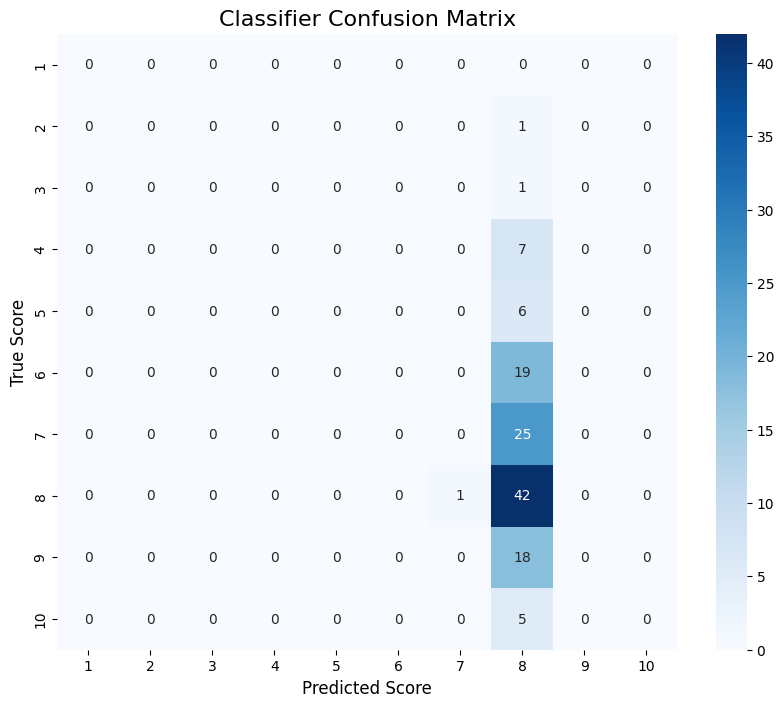


--- Regressor Evaluation Metrics ---
Mean Absolute Error (MAE): 1.1359
Mean Squared Error (MSE): 2.1164
Root Mean Squared Error (RMSE): 1.4548
Coefficient of Determination (R2): 0.1131


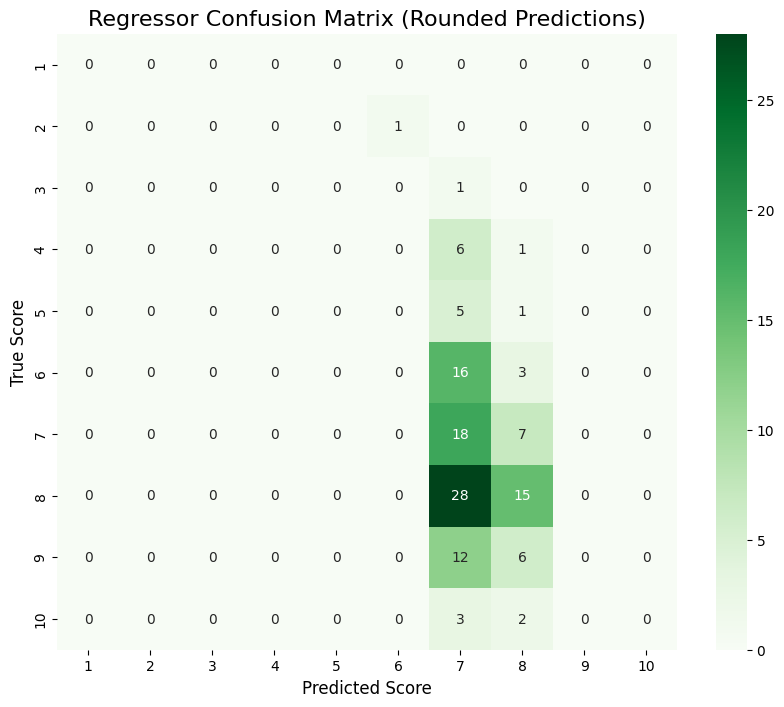


--- Regressor Metrics (after rounding to nearest integer) ---
Accuracy (rounded): 0.2640
Macro Precision (rounded): 0.0701
Macro Recall (rounded): 0.1188
Macro F1-score (rounded): 0.0778


In [ ]:
# --- Evaluation: Classification Metrics ---
print("\n--- Classifier Evaluation Metrics ---")
accuracy = accuracy_score(y_test, y_pred_clf)
precision = precision_score(y_test, y_pred_clf, average='macro', zero_division=0)
recall = recall_score(y_test, y_pred_clf, average='macro', zero_division=0)
f1 = f1_score(y_test, y_pred_clf, average='macro', zero_division=0)

print(f"Accuracy: {accuracy:.4f}")
print(f"Macro Precision: {precision:.4f}")
print(f"Macro Recall: {recall:.4f}")
print(f"Macro F1-score: {f1:.4f}")

cm = confusion_matrix(y_test, y_pred_clf, labels=np.arange(1, 11))
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=np.arange(1, 11), yticklabels=np.arange(1, 11))
plt.title('Classifier Confusion Matrix', fontsize=16)
plt.xlabel('Predicted Score', fontsize=12)
plt.ylabel('True Score', fontsize=12)
plt.show()

print("\n--- Regressor Evaluation Metrics ---")
mae = mean_absolute_error(y_test, y_pred_reg_float)
mse = mean_squared_error(y_test, y_pred_reg_float)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_reg_float)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"Coefficient of Determination (R2): {r2:.4f}")

cm_reg = confusion_matrix(y_test, y_pred_reg_rounded, labels=np.arange(1, 11))
plt.figure(figsize=(10, 8))
sns.heatmap(cm_reg, annot=True, fmt='d', cmap='Greens',
            xticklabels=np.arange(1, 11), yticklabels=np.arange(1, 11))
plt.title('Regressor Confusion Matrix (Rounded Predictions)', fontsize=16)
plt.xlabel('Predicted Score', fontsize=12)
plt.ylabel('True Score', fontsize=12)
plt.show()

print("\n--- Regressor Metrics (after rounding to nearest integer) ---")
accuracy_reg = accuracy_score(y_test, y_pred_reg_rounded)
precision_reg = precision_score(y_test, y_pred_reg_rounded, average='macro', zero_division=0)
recall_reg = recall_score(y_test, y_pred_reg_rounded, average='macro', zero_division=0)
f1_reg = f1_score(y_test, y_pred_reg_rounded, average='macro', zero_division=0)

print(f"Accuracy (rounded): {accuracy_reg:.4f}")
print(f"Macro Precision (rounded): {precision_reg:.4f}")
print(f"Macro Recall (rounded): {recall_reg:.4f}")
print(f"Macro F1-score (rounded): {f1_reg:.4f}")



best_baseline_model = classifier

### Applying Semi-Supervised Learning Strategies

In [ ]:
# ==============================================================================
# 8. IMPLEMENTATION: Semi-Supervised Learning (SSL) Strategies
# ==============================================================================
print("\n--- Applying Semi-Supervised Learning Strategies ---")

print("\nStarting Pseudo-Labeling with a Classifier...")

CONFIDENCE_THRESHOLD = 0.57
N_ROUNDS_PSEUDO = 5

X_train_pseudo = X_train.copy()
y_train_pseudo = y_train.copy()
X_unlabeled_pool = sbert_embeddings_unlabeled.copy()

performance_history_pseudo_clf = []
performance_history_pseudo_clf.append({'round': 0, 'labeled_samples': len(y_train), 'accuracy': accuracy})
final_pseudo_model_clf = classifier

for i in range(N_ROUNDS_PSEUDO):
    print(f"\n--- Pseudo-Labeling Round {i+1}/{N_ROUNDS_PSEUDO} ---")

    model_for_pseudo = RandomForestClassifier(n_estimators=100, random_state=42)
    model_for_pseudo.fit(X_train_pseudo, y_train_pseudo)

    if len(X_unlabeled_pool) == 0:
        print("Unlabeled pool is empty. Stopping pseudo-labeling.")
        break
    unlabeled_probs = model_for_pseudo.predict_proba(X_unlabeled_pool)
    unlabeled_predictions = model_for_pseudo.predict(X_unlabeled_pool)

    confidence_scores = np.max(unlabeled_probs, axis=1)
    high_confidence_indices = np.where(confidence_scores > CONFIDENCE_THRESHOLD)[0]

    if len(high_confidence_indices) == 0:
        print("No new high-confidence samples found. Stopping pseudo-labeling.")
        break
    print(f"Found {len(high_confidence_indices)} high-confidence samples to add.")

    X_to_add = X_unlabeled_pool[high_confidence_indices]
    y_to_add = unlabeled_predictions[high_confidence_indices]

    X_train_pseudo = np.vstack([X_train_pseudo, X_to_add])
    y_train_pseudo = np.concatenate([y_train_pseudo, y_to_add])

    X_unlabeled_pool = np.delete(X_unlabeled_pool, high_confidence_indices, axis=0)

    final_pseudo_model_clf = RandomForestClassifier(n_estimators=100, random_state=42)
    final_pseudo_model_clf.fit(X_train_pseudo, y_train_pseudo)

    y_pred_eval = final_pseudo_model_clf.predict(X_test)
    accuracy_eval = accuracy_score(y_test, y_pred_eval)
    performance_history_pseudo_clf.append({
        'round': i + 1,
        'labeled_samples': len(y_train_pseudo),
        'accuracy': accuracy_eval
    })
    print(f"Round {i+1} Test Accuracy: {accuracy_eval:.4f} with {len(y_train_pseudo)} total training samples.")



--- Applying Semi-Supervised Learning Strategies ---

Starting Pseudo-Labeling with a Classifier...


NameError: name 'X_train' is not defined

### Active Learning (Interactive)

In [ ]:
# --- 3.2. Active Learning (Interactive with Bulk Input) ---
print("\nStarting INTERACTIVE Active Learning...")

N_ROUNDS_ACTIVE = 5
K_SAMPLES_PER_ROUND = 3

X_train_active = X_train.copy()
y_train_active = y_train.copy()

X_unlabeled_pool_active = X[temp_indices]
texts_unlabeled_pool_active = texts[temp_indices]

performance_history_active_reg = []
performance_history_active_clf = []

y_pred_base_reg = best_baseline_model.predict(X_test)
mae_base = mean_absolute_error(y_test, y_pred_base)
accuracy_base = accuracy_score(y_test, y_pred_clf)

performance_history_active_reg.append({'round': 0, 'labeled_samples': len(y_train), 'mae': mae_base})
performance_history_active_clf.append({'round': 0, 'labeled_samples': len(y_train), 'accuracy': accuracy_base})


for i in range(N_ROUNDS_ACTIVE):
    print(f"\n--- Active Learning Round {i+1}/{N_ROUNDS_ACTIVE} ---")
    model_for_uncertainty = RandomForestClassifier(n_estimators=100, random_state=42)
    model_for_uncertainty.fit(X_train_active, y_train_active)

    if len(X_unlabeled_pool_active) == 0:
        print("Unlabeled pool is empty. Stopping active learning.")
        break

    unlabeled_probs = model_for_uncertainty.predict_proba(X_unlabeled_pool_active)
    uncertainty_scores = 1 - np.max(unlabeled_probs, axis=1)

    k_to_select = min(K_SAMPLES_PER_ROUND, len(uncertainty_scores))
    most_uncertain_indices = np.argsort(uncertainty_scores)[-k_to_select:]

    print(f"\nPlease label the following {k_to_select} most uncertain reviews:")
    for j, idx in enumerate(most_uncertain_indices):
        review_text = texts_unlabeled_pool_active[idx]
        print(f"  {j+1}. Review Text: '{review_text}'")

    while True:
        try:
            scores_input = input(f"\nEnter {k_to_select} scores separated by commas (e.g., 8,2,5): ")
            newly_labeled_scores = [int(s.strip()) for s in scores_input.split(',')]

            if len(newly_labeled_scores) != k_to_select:
                print(f"Error: Please provide exactly {k_to_select} scores.")
                continue

            if all(1 <= s <= 10 for s in newly_labeled_scores):
                break
            else:
                print("Error: All scores must be integers between 1 and 10.")
        except ValueError:
            print("Invalid input. Please enter integers separated by commas.")

    y_to_label = np.array(newly_labeled_scores)
    X_to_label = X_unlabeled_pool_active[most_uncertain_indices]

    X_train_active = np.vstack([X_train_active, X_to_label])
    y_train_active = np.concatenate([y_train_active, y_to_label])

    X_unlabeled_pool_active = np.delete(X_unlabeled_pool_active, most_uncertain_indices, axis=0)
    texts_unlabeled_pool_active = np.delete(texts_unlabeled_pool_active, most_uncertain_indices, axis=0)

    final_active_model_reg = RandomForestRegressor(n_estimators=100, random_state=42)
    final_active_model_reg.fit(X_train_active, y_train_active)
    y_pred_eval_active_reg = final_active_model_reg.predict(X_test)
    mae_eval_active = mean_absolute_error(y_test, y_pred_eval_active_reg)
    performance_history_active_reg.append({
        'round': i + 1,
        'labeled_samples': len(y_train_active),
        'mae': mae_eval_active
    })

    final_active_model_clf = RandomForestClassifier(n_estimators=100, random_state=42)
    final_active_model_clf.fit(X_train_active, y_train_active)
    y_pred_eval_active_clf = final_active_model_clf.predict(X_test)
    accuracy_eval_active = accuracy_score(y_test, y_pred_eval_active_clf)
    performance_history_active_clf.append({
        'round': i + 1,
        'labeled_samples': len(y_train_active),
        'accuracy': accuracy_eval_active
    })

    print(f"\nRound {i+1} Test MAE: {mae_eval_active:.4f} | Test Accuracy: {accuracy_eval_active:.4f} (with {len(y_train_active)} total labeled samples)")



Starting INTERACTIVE Active Learning...


NameError: name 'X_train' is not defined

In [ ]:
print("\nStarting INTERACTIVE Active Learning...")

N_ROUNDS_ACTIVE = 5
K_SAMPLES_PER_ROUND = 10


X_train_active = X_train.copy()
y_train_active = y_train.copy()

X_unlabeled_pool_active = X[temp_indices]
texts_unlabeled_pool_active = texts[temp_indices]

performance_history_active_reg = []
performance_history_active_clf = []

y_pred_base_reg = best_baseline_model.predict(X_test)
mae_base = mean_absolute_error(y_test, y_pred_base)
accuracy_base = accuracy_score(y_test, y_pred_clf)

performance_history_active_reg.append({'round': 0, 'labeled_samples': len(y_train), 'mae': mae_base})
performance_history_active_clf.append({'round': 0, 'labeled_samples': len(y_train), 'accuracy': accuracy_base})


for i in range(N_ROUNDS_ACTIVE):
    print(f"\n--- Active Learning Round {i+1}/{N_ROUNDS_ACTIVE} ---")
    model_for_uncertainty = RandomForestClassifier(n_estimators=30, random_state=42)
    model_for_uncertainty.fit(X_train_active, y_train_active)

    if len(X_unlabeled_pool_active) == 0:
        print("Unlabeled pool is empty. Stopping active learning.")
        break

    unlabeled_probs = model_for_uncertainty.predict_proba(X_unlabeled_pool_active)
    uncertainty_scores = 1 - np.max(unlabeled_probs, axis=1)

    k_to_select = min(K_SAMPLES_PER_ROUND, len(uncertainty_scores))
    most_uncertain_indices = np.argsort(uncertainty_scores)[-k_to_select:]

    print(f"\nPlease label the following {k_to_select} most uncertain reviews:")
    for j, idx in enumerate(most_uncertain_indices):
        review_text = texts_unlabeled_pool_active[idx]
        print(f"  {j+1}. Review Text: '{review_text}'")

    while True:
        try:
            scores_input = input(f"\nEnter {k_to_select} scores separated by commas (e.g., 8,2,5): ")
            newly_labeled_scores = [int(s.strip()) for s in scores_input.split(',')]

            if len(newly_labeled_scores) != k_to_select:
                print(f"Error: Please provide exactly {k_to_select} scores.")
                continue

            if all(1 <= s <= 10 for s in newly_labeled_scores):
                break
            else:
                print("Error: All scores must be integers between 1 and 10.")
        except ValueError:
            print("Invalid input. Please enter integers separated by commas.")

    y_to_label = np.array(newly_labeled_scores)
    X_to_label = X_unlabeled_pool_active[most_uncertain_indices]

    X_train_active = np.vstack([X_train_active, X_to_label])
    y_train_active = np.concatenate([y_train_active, y_to_label])

    X_unlabeled_pool_active = np.delete(X_unlabeled_pool_active, most_uncertain_indices, axis=0)
    texts_unlabeled_pool_active = np.delete(texts_unlabeled_pool_active, most_uncertain_indices, axis=0)

    final_active_model_reg = RandomForestRegressor(n_estimators=100, random_state=42)
    final_active_model_reg.fit(X_train_active, y_train_active)
    y_pred_eval_active_reg = final_active_model_reg.predict(X_test)
    mae_eval_active = mean_absolute_error(y_test, y_pred_eval_active_reg)
    performance_history_active_reg.append({
        'round': i + 1,
        'labeled_samples': len(y_train_active),
        'mae': mae_eval_active
    })

    final_active_model_clf = RandomForestClassifier(n_estimators=100, random_state=42)
    final_active_model_clf.fit(X_train_active, y_train_active)
    y_pred_eval_active_clf = final_active_model_clf.predict(X_test)
    accuracy_eval_active = accuracy_score(y_test, y_pred_eval_active_clf)
    performance_history_active_clf.append({
        'round': i + 1,
        'labeled_samples': len(y_train_active),
        'accuracy': accuracy_eval_active
    })

    print(f"\nRound {i+1} Test MAE: {mae_eval_active:.4f} | Test Accuracy: {accuracy_eval_active:.4f} (with {len(y_train_active)} total labeled samples)")



Starting INTERACTIVE Active Learning...


NameError: name 'X_train' is not defined

# <b><font size=7 color='orange'> Computer Assignment 5&6 - Task 2 </font></b>



# Task 2: Semantic Search on NiniSite Questions

## Question 2.1: Text Preprocessing for Persian Language (15 Points)

**a) Persian Text Normalization (8 Points)**
- Implement a comprehensive Persian text preprocessing pipeline using the Hazm library
- Apply normalization, character repetition handling, and special character removal
- Remove Persian stopwords and apply stemming to reduce words to their root forms
- Why is normalization particularly important for Persian text processing compared to English?

**b) Preprocessing Quality Assessment (7 Points)**
- Compare original vs. processed text samples to demonstrate the effectiveness of preprocessing
- Analyze the impact of each preprocessing step (normalization, stopword removal, stemming)
- What challenges are unique to processing informal Persian text from user-generated content?

## Question 2.2: Exploratory Data Analysis (EDA) (20 Points)

**a) Dataset Overview and Statistics (8 Points)**
- Analyze the structure and size of the PerCQA dataset
- Provide summary statistics for questions and comments (word counts, character distributions)
- Examine the distribution of question types, user activity patterns, and temporal trends

**b) Text Content Analysis (7 Points)**
- Generate and visualize word clouds for Persian text (using appropriate fonts)
- Analyze the most frequent words and topics in questions and comments
- Identify patterns in user behavior (most active users, question categories)

**c) Data Quality Assessment (5 Points)**
- Identify and handle missing values, duplicates, or inconsistent data
- Assess the overall quality of the dataset for semantic search applications
- What preprocessing steps were most important for improving data quality?

## Question 2.3: Semantic Search Implementation (35 Points)

**a) Embedding Model Selection and Setup (10 Points)**
- Use the 'paraphrase-multilingual-MiniLM-L12-v2' SentenceTransformer model for Persian text
- Justify the choice of this multilingual model for Persian semantic search
- Compute embeddings for all questions in the dataset efficiently

**b) Vector Database Implementation (15 Points)**
- Set up LanceDB as the vector database for storing question embeddings
- Design an appropriate schema for storing questions with their vector representations
- Implement proper indexing strategies for fast similarity search

**c) Search Functionality and Evaluation (10 Points)**
- Implement semantic search with at least 5 diverse Persian queries
- Compare results with traditional full-text search (FTS) methods
- Analyze the quality and relevance of retrieved results for each query
- Which approach (semantic vs. full-text) performs better for different types of queries?

## Question 2.4: Search Enhancement and Comparison (30 Points)

**a) Reranking Implementation (15 Points)**
- Implement a cross-encoder reranking model (e.g., 'BAAI/bge-reranker-base') as a bonus feature
- Compare search results before and after reranking for the same queries
- Demonstrate how reranking improves the relevance and ordering of search results

**b) Performance Analysis and Optimization (10 Points)**
- Measure and compare the performance of different search approaches:
  - Pure semantic search
  - Full-text search
  - Semantic search with reranking
- Analyze the trade-offs between search quality and computational cost

**c) System Evaluation and Insights (5 Points)**
- Evaluate the overall effectiveness of your semantic search system
- Identify strengths and limitations of the current approach
- Propose improvements for handling Persian language nuances and domain-specific terminology
- How would you adapt this system for production use with larger datasets?

---

In [ ]:
!pip uninstall -y torch torchvision torchaudio transformers sentence-transformers hazm numpy scipy
!pip uninstall -y torch torchvision torchaudio transformers sentence-transformers hazm
!pip install --no-cache-dir torch==2.6.0
!pip install --no-cache-dir torchvision==0.21.0
!pip install --no-cache-dir torchaudio==2.6.0
!pip install --no-cache-dir transformers==4.54.1
!pip install --no-cache-dir sentence-transformers==5.0.0
!pip install --no-cache-dir hazm==0.10.0

Found existing installation: torch 2.8.0+cu126
Uninstalling torch-2.8.0+cu126:
  Successfully uninstalled torch-2.8.0+cu126
Found existing installation: torchvision 0.23.0+cu126
Uninstalling torchvision-0.23.0+cu126:
  Successfully uninstalled torchvision-0.23.0+cu126
Found existing installation: torchaudio 2.8.0+cu126
Uninstalling torchaudio-2.8.0+cu126:
  Successfully uninstalled torchaudio-2.8.0+cu126
Found existing installation: transformers 4.56.1
Uninstalling transformers-4.56.1:
  Successfully uninstalled transformers-4.56.1
Found existing installation: sentence-transformers 5.1.0
Uninstalling sentence-transformers-5.1.0:
  Successfully uninstalled sentence-transformers-5.1.0
Found existing installation: numpy 2.0.2
Uninstalling numpy-2.0.2:
  Successfully uninstalled numpy-2.0.2
Found existing installation: scipy 1.16.1
Uninstalling scipy-1.16.1:
  Successfully uninstalled scipy-1.16.1
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 766.6/766.6 MB 203.5 MB/s eta 0:00:00
   ━━━━━━━━━

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 36.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 195.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 331.8 MB/s eta 0:00:00
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.22.0
    Uninstalling tokenizers-0.22.0:
      Successfully uninstalled tokenizers-0.22.0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 470.2/470.2 kB 20.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.7/35.7 MB 202.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 142.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │

## Make Dataset

In [ ]:
import json
import argparse
from tqdm import tqdm
from typing import Optional, List, Dict, Any

class QADatasetSimplifier:
    """
    Simplifies a QA dataset from a JSON Lines file.

    Reads an input file where each line is a JSON object, extracts relevant
    question and answer fields, and writes the simplified objects to a new
    JSON Lines output file.
    """


    def __init__(self, input_path: str, output_path: str):
        self.input_path = input_path
        self.output_path = output_path

    def _simplify_entry(self, entry: Dict[str, Any]) -> Optional[Dict[str, Any]]:
        question = entry.get("QBody", "").strip()
        if not question:
            return None

        answers = [
            comment.get("CBodyClean", "").strip()
            for comment in entry.get("Comments", [])
            if comment.get("CBodyClean") and comment.get("CBodyClean").strip()
        ]

        if not answers:
            return None

        simplified = {
            "question": question,
            "answers": answers,
        }

        other_data = entry.copy()
        other_data.pop("QBody", None)
        other_data.pop("Comments", None)
        simplified.update(other_data)

        return simplified

    def process(self) -> List[Dict[str, Any]]:
        """
        Reads a file containing concatenated JSON objects, processes each one,
        and writes the output to a JSON Lines file. This handles files that
        are not standard arrays or JSON Lines.
        """
        simplified_data = []
        print(f"Starting processing from '{self.input_path}'...")

        with open(self.input_path, "r", encoding="utf-8-sig") as f_in:
            file_content = f_in.read()

        decoder = json.JSONDecoder()
        pos = 0

        with open(self.output_path, "w", encoding="utf-8") as f_out:
            with tqdm(total=len(file_content), desc="Processing file") as pbar:
                while pos < len(file_content):
                    while pos < len(file_content) and file_content[pos].isspace():
                        pos += 1
                    if pos == len(file_content):
                        break

                    try:
                        entry, end_pos = decoder.raw_decode(file_content, pos)

                        # --- FIX: Check if the decoded entry is a dictionary ---
                        if isinstance(entry, dict):
                            simplified = self._simplify_entry(entry)
                            if simplified:
                                simplified_data.append(simplified)
                                json.dump(simplified, f_out, ensure_ascii=False)
                                f_out.write('\n')
                        # If it's not a dict (e.g., a string), we just ignore it
                        # and move on.
                        # --------------------------------------------------------

                        pbar.update(end_pos - pos)
                        pos = end_pos

                    except json.JSONDecodeError:
                        print(f"\nCritical Error: Could not decode JSON starting at position {pos}. Stopping.")
                        break

        print(f"Processing complete. Simplified data saved to '{self.output_path}'.")
        return simplified_data# --- Main execution block to run the script from the command line ---
# if __name__ == '__main__':
#     # Set up the argument parser
#     parser = argparse.ArgumentParser(description="Simplify a QA dataset from a JSON Lines file.")
#     parser.add_argument("input_path", help="The path to the source JSON Lines (.jsonl) file.")
#     parser.add_argument("output_path", help="The path where the simplified .jsonl file will be saved.")

#     # Parse the command-line arguments
#     args = parser.parse_args()

#     # Initialize the simplifier with the provided paths and run the process
#     simplifier = QADatasetSimplifier(input_path=args.input_path, output_path=args.output_path)
#     simplifier.process()

In [ ]:
!head -n 5 PerCQA_JSON_Format.json


"CID": "127413850",
        "CUSERID": 68290,
        "CGOLD": "Bad",
        "CGOLD_YN": "",
        "CSubject": "",


In [ ]:
!sed -n '39086p' PerCQA_JSON_Format.json


        "CUsername": "fffaaattteeemmmeee",


In [ ]:
input_path = './PerCQA_JSON_Format.json'

try:
    with open(input_path, 'r', encoding='utf-8-sig') as f:
        start_of_file = f.read(50) # Read the first 50 characters

    print("--- First 50 characters of the file ---")
    print(start_of_file)
    print("\n--- Raw representation (to see hidden characters) ---")
    print(repr(start_of_file))

except Exception as e:
    print(f"An error occurred while trying to read the file: {e}")


--- First 50 characters of the file ---
"CID": "127413850",
        "CUSERID": 68290,
    

--- Raw representation (to see hidden characters) ---
'"CID": "127413850",\n        "CUSERID": 68290,\n    '


In [ ]:
import json
from tqdm import tqdm

def fix_concatenated_json(input_path: str, output_path: str):
    """
    Reads a file with improperly concatenated JSON objects and writes them
    to a new, valid JSON Lines (.jsonl) file.

    Args:
        input_path: The path to the broken JSON file.
        output_path: The path to save the fixed .jsonl file.
    """
    print(f"Attempting to fix file: {input_path}")

    # Read the entire broken file into a single string.
    # We use a simple encoding; 'utf-8-sig' can be tried if this fails.
    try:
        with open(input_path, 'r', encoding='utf-8') as f:
            file_content = f.read()
    except Exception as e:
        print(f"Error reading file: {e}")
        return

    # Initialize a JSON decoder to find objects one by one
    decoder = json.JSONDecoder()
    pos = 0
    objects_found = 0

    # Open the new file to write the corrected output
    with open(output_path, 'w', encoding='utf-8') as f_out:
        with tqdm(total=len(file_content), desc="Fixing file") as pbar:
            while pos < len(file_content):
                # Skip any whitespace
                while pos < len(file_content) and file_content[pos].isspace():
                    pos += 1
                if pos == len(file_content):
                    break

                try:
                    # Use the decoder to find one valid JSON object
                    obj, end_pos = decoder.raw_decode(file_content, pos)

                    # We only care about dictionary objects for this dataset
                    if isinstance(obj, dict):
                        # Write the valid object to the new file as a single line
                        json.dump(obj, f_out, ensure_ascii=False)
                        f_out.write('\n')
                        objects_found += 1

                    # Update progress and move to the next position
                    pbar.update(end_pos - pos)
                    pos = end_pos

                except json.JSONDecodeError:
                    # If we hit an error, skip one character and try again
                    # This helps move past corrupted sections
                    pbar.update(1)
                    pos += 1

    print(f"Fix complete. Found and saved {objects_found} valid objects.")
    print(f"Corrected file saved to: {output_path}")

# --- Main execution block ---
if __name__ == '__main__':
    input_file = './PerCQA_JSON_Format.json'
    # We save the new file with a .jsonl extension to indicate its format
    output_file = './PerCQA_fixed.jsonl'

    fix_concatenated_json(input_file, output_file)

Attempting to fix file: ./PerCQA_JSON_Format.json


Fixing file: 100%|█████████▉| 10466168/10468852 [00:19<00:00, 545256.88it/s]

Fix complete. Found and saved 853 valid objects.
Corrected file saved to: ./PerCQA_fixed.jsonl


In [ ]:
input_path = "./PerCQA_fixed.jsonl"
output_path = "./simplified_dataset.json"

simplifier = QADatasetSimplifier(input_path, output_path)
simplified_data = simplifier.process() # <-- Use the new process() method


Starting processing from './PerCQA_fixed.jsonl'...


Processing file: 100%|█████████▉| 8483939/8484792 [00:01<00:00, 6225794.46it/s]

Processing complete. Simplified data saved to './simplified_dataset.json'.


In [ ]:
simplified_data

[{'question': 'برای وزن گیری  نوزاد چی خوبه؟ توقف وزنی داشته .  پسرم ۱۶ماهه اش هست و  ۸ماه وزن اضافه نکرده',
  'answers': ['مامانا نظر بدین',
   'شربت زینک خیلی اشتها اوره برای بچه. شیرموز ، عصاره قلم گوساله تو غذاهاش بریز ، کره ، سرلاک..اب هویج بستنی. البته اینا تجربه های خودمه ، پسر من 18 ماهشه من اینارو میدم',
   'سویق کودک. پای مرغ. قلم گوسفندی یا گوساله .',
   'روغن زیتون. پای مرغ',
   '16 ماه وزنش 8900. قدش96. دور سرش 48. اشتها نداره. در حد چن قاشق میخوره .قطره اهن فروز مال دادم فرقی نکرد.',
   'عزیزم پای مرع مخاس بدم .گفتن بده مضره.ترسیدم..عصاره گوشت میدم نمیخوره بزور باید دهنش بریزی'],
  'QID': '3304808',
  'QCATEGORY': None,
  'QDATE': '2019-09-29T16:44:00',
  'QUSERID': 80345,
  'QTYPE': 'General',
  'QGOLD_YN': 'Not Applicable',
  'QUsername': 'shady66',
  'QSubject': 'وزن گیری نوزاد'},
 {'question': 'من بچم از وقتی بدنیا اومد فقط شیر خودمو میخورد شیر خشک اصلا نخورد اما همون شیر خودمم خیلی کم میخورد از شش ماهگی تا الان که یه سالشه اصلااا روزا و تو بیداری شیر نمیخوره نه مال م

In [ ]:
simplifier

## 1. Preprocessing

In [ ]:
!pip install hazm "numpy>=1.26.0"
!pip install -U hazm

  Using cached hazm-0.10.0-py3-none-any.whl.metadata (11 kB)
  Using cached fasttext_wheel-0.9.2-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (16 kB)
  Using cached flashtext-2.7.tar.gz (14 kB)
  Preparing metadata (setup.py) ... done
  Using cached gensim-4.3.3-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (8.1 kB)
INFO: pip is looking at multiple versions of hazm to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.5/367.5 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 92.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 96.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.6/26.6 MB 71.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━

  Using cached hazm-0.10.0-py3-none-any.whl.metadata (11 kB)
  Using cached flashtext-2.7.tar.gz (14 kB)
  Preparing metadata (setup.py) ... done
  Using cached numpy-1.24.3.tar.gz (10.9 MB)
  Installing build dependencies ... canceled
ERROR: Operation cancelled by user
^C


### Normalize Persian and Arabic characters & Remove diacritics and unwanted characters

In [ ]:
import re
import hazm
class TextNormalizer:
    def __init__(self):
        self.normalizer = hazm.Normalizer(
            correct_spacing=True,
            remove_diacritics=True,
            remove_specials_chars=True,
            decrease_repeated_chars=True,
            persian_style=True,
            persian_numbers=True,
            unicodes_replacement=True,
            seperate_mi=True,
        )

    def normalize(self, text: str) -> str:
        text = self.normalizer.normalize(text)
        # text = re.sub(r"[^\w\s\u0600-\u06FF\u200c.,!?؟]", "", text)
        return text


In [ ]:
normalizer = TextNormalizer()

examples = [
    "علي در كلاس نشست و گفت: من يكي از بهترين‌ها هستم.",
    "مـــــــن می‌خـــــواهم بِرَوَمًٌُِ",
    "من    می روم  به    مدرسه.",
    "عااااااااااااااااااااااااااااااااااااااااااااااااالیهههههه!",
    "سلام!!! چطـــوری؟؟؟ اینم یک تست@#$%^&*()_+=-~`<>.",
    "من ٣ تا کتاب دارم و ١٠ تا دفتر.",
    "میرفتم، میامد، میرود، میخواهد"
]

for i, text in enumerate(examples, 1):
    print(f"🧪 Test {i}:\n  🔸 Before: {text}\n  ✅ After:  {normalizer.normalize(text)}\n")


🧪 Test 1:
  🔸 Before: علي در كلاس نشست و گفت: من يكي از بهترين‌ها هستم.
  ✅ After:  علی در کلاس نشست و گفت: من یکی از بهترین‌ها هستم.

🧪 Test 2:
  🔸 Before: مـــــــن می‌خـــــواهم بِرَوَمًٌُِ
  ✅ After:  من می‌خواهم بروم

🧪 Test 3:
  🔸 Before: من    می روم  به    مدرسه.
  ✅ After:  من می‌روم به مدرسه.

🧪 Test 4:
  🔸 Before: عااااااااااااااااااااااااااااااااااااااااااااااااالیهههههه!
  ✅ After:  عالیه!

🧪 Test 5:
  🔸 Before: سلام!!! چطـــوری؟؟؟ اینم یک تست@#$%^&*()_+=-~`<>.
  ✅ After:  سلام!!! چطوری؟؟؟ اینم یک تست@#$٪^&* () _+=-~`<>.

🧪 Test 6:
  🔸 Before: من ٣ تا کتاب دارم و ١٠ تا دفتر.
  ✅ After:  من ۳ تا کتاب دارم و ۱۰ تا دفتر.

🧪 Test 7:
  🔸 Before: میرفتم، میامد، میرود، میخواهد
  ✅ After:  می‌رفتم، میامد، می‌رود، می‌خواهد



In [ ]:
normalizer = TextNormalizer()

normalized_data = []
for item in simplified_data:
    norm_question = normalizer.normalize(item["question"])
    norm_answers = [normalizer.normalize(ans) for ans in item["answers"]]

    normalized_data.append({
        "question": norm_question,
        "answers": norm_answers
    })


In [ ]:
from collections import Counter

def analyze_characters(data):
    all_text = ""
    for item in data:
        all_text += item['question']
        for answer in item['answers']:
            all_text += answer

    char_counts = Counter(all_text)
    sorted_chars = sorted(char_counts.items(), key=lambda x: x[1])

    print("🔍 Rare characters (likely unwanted):\n")
    for char, count in sorted_chars:
        if ord(char) < 32 or ord(char) == 127:
            char_repr = f"U+{ord(char):04X} (control)"
        elif char.isspace():
            char_repr = f"'{repr(char)}' (space)"
        else:
            char_repr = f"'{char}'"
        print(f"{char_repr}: {count}")

    return sorted_chars


In [ ]:
rare_chars = analyze_characters(normalized_data)


🔍 Rare characters (likely unwanted):

'🔻': 1
'🔹': 1
'🔺': 1
'ة': 1
'👀': 1
'🍭': 1
'👊': 1
'🐥': 1
'🧐': 1
'🥴': 1
'🎁': 1
'🎂': 1
'👆': 1
'L': 1
'💓': 1
'😻': 1
'💔': 1
'🙅': 1
'😺': 1
'👹': 1
'🙌': 1
'🤐': 1
'😿': 1
'👶': 1
'🏽': 1
'⑨': 1
'⑥': 1
'🙋': 1
'❇': 1
'《': 1
'》': 1
'💞': 1
';': 1
'轒': 1
'是': 1
'滋': 1
'味': 1
'我': 1
'它': 1
'香': 1
'港': 1
'大': 1
'教': 1
'育': 1
'翃': 1
'能': 1
'力': 1
'上': 1
'網': 1
'者': 1
'人': 1
'間': 1
'☯': 1
'🤩': 1
'👋': 1
'♂': 1
'\': 1
'💙': 1
'K': 1
'^': 2
'😵': 2
'😴': 2
'✋': 2
'v': 2
'☝': 2
'⁦': 2
'⁩': 2
'🤕': 2
'🤒': 2
'✌': 2
'🤪': 2
'💟': 2
'🎈': 2
'R': 2
'♥': 2
'😹': 2
'V': 2
'💝': 2
'💖': 2
'👇': 2
'不': 2
'會': 2
'的': 2
'遊': 2
'戲': 2
'🥺': 2
'🤢': 2
'😷': 3
'S': 3
'💜': 3
'🤭': 3
'❣': 3
'😗': 3
'N': 3
'ؤ': 3
''': 3
'💋': 3
'學': 3
'🤮': 3
'😈': 4
'Y': 4
'X': 4
'💕': 4
'🤤': 4
'💪': 4
'😦': 4
'H': 4
'F': 4
'🙊': 4
'C': 4
'😤': 4
'🤨': 4
'😌': 5
'|': 5
']': 5
'🙁': 5
'🌸': 5
'٬': 5
'W': 5
'😪': 5
'&': 6
'😛': 6
'[': 6
'Q': 6
'U': 6
'q': 6
'😫': 6
'♀': 6
'😧': 6
'G': 6
'P': 6
'🙂': 6
'💗': 6
'🥰': 6
'👏': 6
'😇': 7
'🤦': 7
'‍'

In [ ]:
import re
from hazm import Normalizer

class TextNormalizer:
    def __init__(self):
        self.normalizer = Normalizer(
            correct_spacing=True,
            remove_diacritics=True,
            remove_specials_chars=True,
            decrease_repeated_chars=True,
            persian_style=True,
            persian_numbers=True,
            unicodes_replacement=True,
            seperate_mi=True,
        )
        self.slang_dict = {
            "خخ": "خندیدم",
            "عه": "عجب",
            "مرسی": "ممنونم",
            "دمت": "ممنونم",
            "دمت گرم": "ممنونم",
            "نی": "نیست",
            "یه": "یک"
        }

    def remove_emoji(self, text: str) -> str:
        emoji_pattern = re.compile("["
            u"\U0001F600-\U0001F64F"
            u"\U0001F300-\U0001F5FF"
            u"\U0001F680-\U0001F6FF"
            u"\U0001F1E0-\U0001F1FF"
            u"\U00002700-\U000027BF"
            u"\U0001F900-\U0001F9FF"
            u"\U00002600-\U000026FF"
            u"\U00002B00-\U00002BFF"
            "]+", flags=re.UNICODE)
        return emoji_pattern.sub(r'', text)

    def replace_slangs(self, text: str) -> str:
        pattern = re.compile(r'\b(' + '|'.join(map(re.escape, self.slang_dict.keys())) + r')\b')
        return pattern.sub(lambda x: self.slang_dict[x.group()], text)

    def normalize(self, text: str) -> str:
        text = self.normalizer.normalize(text)
        text = self.remove_emoji(text)
        text = re.sub(r"[^\u0600-\u06FF\s\u200c.,!?؟]", "", text)
        text = re.sub(r"[^\w\s\u0600-\u06FF\u200c.,!?؟]", "", text)
        text = re.sub(r"[^\u0600-\u06FF\s\u200c]", "", text)
        text = self.replace_slangs(text)
        return text


In [ ]:
normalizer = TextNormalizer()

normalized_data2 = []
for item in simplified_data:
    norm_question = normalizer.normalize(item["question"])
    norm_answers = [normalizer.normalize(ans) for ans in item["answers"]]

    normalized_data2.append({
        "question": norm_question,
        "answers": norm_answers
    })


In [ ]:
rare_chars = analyze_characters(normalized_data2)


🔍 Rare characters (likely unwanted):



### Tokenization

In [ ]:
from hazm import WordTokenizer, SentenceTokenizer

class TextTokenizer:
    def __init__(self):
        self.word_tokenizer = WordTokenizer()
        self.sentence_tokenizer = SentenceTokenizer()
        self.punctuations = {"؟", "،", ".", ",", "!", "؛", ":", "-", "_", "...", "(", ")", "[", "]", "\"", "'", "«", "»"}

    def tokenize_words(self, text: str):
        tokens = self.word_tokenizer.tokenize(text)
        filtered_tokens = [t for t in tokens if t not in self.punctuations]
        return filtered_tokens

    def tokenize_sentences(self, text: str):
        return self.sentence_tokenizer.tokenize(text)


In [ ]:
tokenizer = TextTokenizer()

tokenized_data2 = []
for item in normalized_data2:
    tokenized_question = tokenizer.tokenize_words(item["question"])
    tokenized_answers = [tokenizer.tokenize_words(ans) for ans in item["answers"]]

    tokenized_data2.append({
        "question_tokens": tokenized_question,
        "answers_tokens": tokenized_answers
    })


print(tokenized_data2[0])

{'question_tokens': ['برای', 'وزن', 'گیری', 'نوزاد', 'چی', 'خوبه', 'توقف', 'وزنی', 'داشته', 'پسرم', '۱۶', 'ماهه\u200cاش', 'هست', 'و', '۸', 'ماه', 'وزن', 'اضافه', 'نکرده'], 'answers_tokens': [['مامانا', 'نظر', 'بدین'], ['شربت', 'زینک', 'خیلی', 'اشتها', 'اوره', 'برای', 'بچه', 'شیرموز', 'عصاره', 'قلم', 'گوساله', 'تو', 'غذاهاش', 'بریز', 'کره', 'سرلاک', 'اب', 'هویج', 'بستنی', 'البته', 'اینا', 'تجربه\u200cهای', 'خودمه', 'پسر', 'من', '۱۸', 'ماهشه', 'من', 'اینارو', 'میدم'], ['سویق', 'کودک', 'پای', 'مرغ', 'قلم', 'گوسفندی', 'یا', 'گوساله'], ['روغن', 'زیتون', 'پای', 'مرغ'], ['۱۶', 'ماه', 'وزنش', '۸۹۰۰', 'قدش', '۹۶', 'دور', 'سرش', '۴۸', 'اشتها', 'نداره', 'در', 'حد', 'چن', 'قاشق', 'میخوره', 'قطره', 'اهن', 'فروز', 'مال', 'دادم', 'فرقی', 'نکرد'], ['عزیزم', 'پای', 'مرع', 'مخاس', 'بدم', 'گفتن', 'بده', 'مضره', 'ترسیدم', 'عصاره', 'گوشت', 'میدم', 'نمیخوره', 'بزور', 'باید', 'دهنش', 'بریزی']]}


In [ ]:
tokenizer = TextTokenizer()

tokenized_data = []
for item in normalized_data:
    tokenized_question = tokenizer.tokenize_words(item["question"])
    tokenized_answers = [tokenizer.tokenize_words(ans) for ans in item["answers"]]

    tokenized_data.append({
        "question_tokens": tokenized_question,
        "answers_tokens": tokenized_answers
    })

print(tokenized_data[0])

{'question_tokens': ['برای', 'وزن', 'گیری', 'نوزاد', 'چی', 'خوبه', 'توقف', 'وزنی', 'داشته', 'پسرم', '۱۶', 'ماهه\u200cاش', 'هست', 'و', '۸', 'ماه', 'وزن', 'اضافه', 'نکرده'], 'answers_tokens': [['مامانا', 'نظر', 'بدین'], ['شربت', 'زینک', 'خیلی', 'اشتها', 'اوره', 'برای', 'بچه', 'شیرموز', 'عصاره', 'قلم', 'گوساله', 'تو', 'غذاهاش', 'بریز', 'کره', 'سرلاک', '..', 'اب', 'هویج', 'بستنی', 'البته', 'اینا', 'تجربه\u200cهای', 'خودمه', 'پسر', 'من', '۱۸', 'ماهشه', 'من', 'اینارو', 'میدم'], ['سویق', 'کودک', 'پای', 'مرغ', 'قلم', 'گوسفندی', 'یا', 'گوساله'], ['روغن', 'زیتون', 'پای', 'مرغ'], ['۱۶', 'ماه', 'وزنش', '۸۹۰۰.', 'قدش', '۹۶.', 'دور', 'سرش', '۴۸.', 'اشتها', 'نداره', 'در', 'حد', 'چن', 'قاشق', 'میخوره', 'قطره', 'اهن', 'فروز', 'مال', 'دادم', 'فرقی', 'نکرد'], ['عزیزم', 'پای', 'مرع', 'مخاس', 'بدم', 'گفتن', 'بده', 'مضره', 'ترسیدم', '..', 'عصاره', 'گوشت', 'میدم', 'نمیخوره', 'بزور', 'باید', 'دهنش', 'بریزی']]}


In [ ]:
from hazm import stopwords_list as StopWords

class StopwordRemover:
    def __init__(self, custom_stopwords=None):
        self.default_stopwords = set(StopWords())
        self.custom_stopwords = set(custom_stopwords) if custom_stopwords else set()

    def remove_stopwords_default(self, tokens: list[str]) -> list[str]:
        return [t for t in tokens if t not in self.default_stopwords]

    def remove_stopwords_custom(self, tokens: list[str]) -> list[str]:
        combined = self.default_stopwords.union(self.custom_stopwords)
        return [t for t in tokens if t not in combined]


In [ ]:
custom_words = ["برای", "به", "که", "از"]

stopword_remover = StopwordRemover(custom_stopwords=custom_words)

cleaned_data = []
for item in tokenized_data:
    question_clean2 = stopword_remover.remove_stopwords_custom(item["question_tokens"])
    answers_clean2 = [stopword_remover.remove_stopwords_custom(ans_tokens) for ans_tokens in item["answers_tokens"]]

    cleaned_data.append({
        "question_clean_custom": question_clean2,
        "answers_clean_custom": answers_clean2
    })

print(cleaned_data[0])


{'question_clean_custom': ['وزن', 'نوزاد', 'چی', 'خوبه', 'توقف', 'وزنی', 'پسرم', '۱۶', 'ماهه\u200cاش', 'هست', '۸', 'ماه', 'وزن', 'اضافه', 'نکرده'], 'answers_clean_custom': [['مامانا', 'بدین'], ['شربت', 'زینک', 'اشتها', 'اوره', 'بچه', 'شیرموز', 'عصاره', 'قلم', 'گوساله', 'غذاهاش', 'بریز', 'کره', 'سرلاک', '..', 'اب', 'هویج', 'بستنی', 'اینا', 'تجربه\u200cهای', 'خودمه', 'پسر', '۱۸', 'ماهشه', 'اینارو', 'میدم'], ['سویق', 'کودک', 'پای', 'مرغ', 'قلم', 'گوسفندی', 'گوساله'], ['روغن', 'زیتون', 'پای', 'مرغ'], ['۱۶', 'ماه', 'وزنش', '۸۹۰۰.', 'قدش', '۹۶.', 'سرش', '۴۸.', 'اشتها', 'نداره', 'چن', 'قاشق', 'میخوره', 'قطره', 'اهن', 'فروز', 'مال', 'دادم', 'فرقی', 'نکرد'], ['عزیزم', 'پای', 'مرع', 'مخاس', 'بدم', 'گفتن', 'بده', 'مضره', 'ترسیدم', '..', 'عصاره', 'گوشت', 'میدم', 'نمیخوره', 'بزور', 'دهنش', 'بریزی']]}


In [ ]:
custom_words = ["برای", "به", "که", "از"]

stopword_remover = StopwordRemover(custom_stopwords=custom_words)

cleaned_data2 = []
for item in tokenized_data2:
    question_clean2 = stopword_remover.remove_stopwords_custom(item["question_tokens"])
    answers_clean2 = [stopword_remover.remove_stopwords_custom(ans_tokens) for ans_tokens in item["answers_tokens"]]

    cleaned_data2.append({
        "question_clean_custom": question_clean2,
        "answers_clean_custom": answers_clean2
    })

print(cleaned_data2[0])


{'question_clean_custom': ['وزن', 'نوزاد', 'چی', 'خوبه', 'توقف', 'وزنی', 'پسرم', '۱۶', 'ماهه\u200cاش', 'هست', '۸', 'ماه', 'وزن', 'اضافه', 'نکرده'], 'answers_clean_custom': [['مامانا', 'بدین'], ['شربت', 'زینک', 'اشتها', 'اوره', 'بچه', 'شیرموز', 'عصاره', 'قلم', 'گوساله', 'غذاهاش', 'بریز', 'کره', 'سرلاک', 'اب', 'هویج', 'بستنی', 'اینا', 'تجربه\u200cهای', 'خودمه', 'پسر', '۱۸', 'ماهشه', 'اینارو', 'میدم'], ['سویق', 'کودک', 'پای', 'مرغ', 'قلم', 'گوسفندی', 'گوساله'], ['روغن', 'زیتون', 'پای', 'مرغ'], ['۱۶', 'ماه', 'وزنش', '۸۹۰۰', 'قدش', '۹۶', 'سرش', '۴۸', 'اشتها', 'نداره', 'چن', 'قاشق', 'میخوره', 'قطره', 'اهن', 'فروز', 'مال', 'دادم', 'فرقی', 'نکرد'], ['عزیزم', 'پای', 'مرع', 'مخاس', 'بدم', 'گفتن', 'بده', 'مضره', 'ترسیدم', 'عصاره', 'گوشت', 'میدم', 'نمیخوره', 'بزور', 'دهنش', 'بریزی']]}


In [ ]:
from collections import Counter

def count_tokens_from_cleaned(cleaned_data, use_custom=True):
    all_tokens = []
    q_key = "question_clean_custom"
    a_key = "answers_clean_custom"

    for item in cleaned_data:
        all_tokens.extend(item[q_key])
        for ans_tokens in item[a_key]:
            all_tokens.extend(ans_tokens)

    counter = Counter(all_tokens)
    for token, count in counter.most_common():
        print(f"'{token}': {count}")

    return counter

token_counts = count_tokens_from_cleaned(cleaned_data2, use_custom=True)
print(token_counts)

'میشه': 1979
'داره': 1797
'کن': 1646
'دیگه': 1642
'باشه': 1597
'منم': 1511
'الان': 1445
'اگه': 1444
'عزیزم': 1432
'هست': 1244
'بهش': 1207
'بچه': 1181
'اصلا': 1120
'میکنه': 1112
'ک': 1108
'اون': 1091
'دکتر': 1068
'چی': 987
'بده': 978
'کنه': 839
'نداره': 832
'حرف': 818
'شیر': 784
'خوبه': 761
'دارم': 758
'واسه': 741
'بشه': 710
'کنی': 709
'میگه': 702
'روز': 658
'خودم': 637
'دختر': 636
'بگو': 631
'کار': 613
'سال': 612
'خودت': 583
'واقعا': 582
'ب': 580
'دوست': 578
'خب': 577
'پسر': 574
'خونه': 569
'ماه': 528
'حتما': 519
'شوهرم': 513
'درست': 509
'اره': 505
'براش': 500
'خدا': 497
'سر': 480
'نمیدونم': 469
'عقد': 463
'برو': 452
'مثلا': 449
'بهم': 447
'نمیشه': 442
'گفتم': 433
'ازدواج': 427
'شب': 421
'زندگی': 411
'میاد': 405
'دخترم': 404
'کلا': 403
'همون': 398
'توی': 397
'دست': 391
'میگن': 383
'میگم': 382
'باهاش': 380
'داری': 372
'برا': 363
'ممنونم': 361
'وقت': 360
'همش': 359
'بد': 359
'دارن': 359
'اینا': 358
'ببین': 357
'میدم': 353
'بگیر': 352
'ساعت': 351
'شدم': 350
'ماهشه': 346
'میده': 345
'نکن':

In [ ]:
from hazm import Stemmer, Lemmatizer

class WordReducer:
    def __init__(self):
        self.stemmer = Stemmer()
        self.lemmatizer = Lemmatizer()

    def stem_tokens(self, tokens):
        return [self.stemmer.stem(token) for token in tokens]

    def lemmatize_tokens(self, tokens):
        return [self.lemmatizer.lemmatize(token) for token in tokens]


In [ ]:
reducer = WordReducer()

reduced_data = []
for item in cleaned_data:
    q_stem = reducer.stem_tokens(item["question_clean_custom"])
    a_stem = [reducer.stem_tokens(ans) for ans in item["answers_clean_custom"]]

    q_lemma = reducer.lemmatize_tokens(item["question_clean_custom"])
    a_lemma = [reducer.lemmatize_tokens(ans) for ans in item["answers_clean_custom"]]

    reduced_data.append({
        "question_stem": q_stem,
        "answers_stem": a_stem,
        "question_lemma": q_lemma,
        "answers_lemma": a_lemma
    })

In [ ]:
reduced_data2 = []

for cleaned_item, tokenized_item in zip(cleaned_data2, tokenized_data2):
    q_stem = reducer.stem_tokens(cleaned_item["question_clean_custom"])
    a_stem = [reducer.stem_tokens(ans) for ans in cleaned_item["answers_clean_custom"]]

    q_lemma = reducer.lemmatize_tokens(cleaned_item["question_clean_custom"])
    a_lemma = [reducer.lemmatize_tokens(ans) for ans in cleaned_item["answers_clean_custom"]]

    q_lemma2 = reducer.lemmatize_tokens(tokenized_item["question_tokens"])
    a_lemma2 = [reducer.lemmatize_tokens(ans) for ans in tokenized_item["answers_tokens"]]

    reduced_data2.append({
        "question_stem": q_stem,
        "answers_stem": a_stem,
        "question_lemma": q_lemma,
        "answers_lemma": a_lemma,
        "question_lemma_without_stopwords": q_lemma2,
        "answers_lemma_without_stopwords": a_lemma2,
    })


print(reduced_data2[0]["question_lemma"])


['وزن', 'نوزاد', 'چی', 'خوبه', 'توقف', 'وزن', 'پسر', '۱۶', 'ماهه', 'هست', '۸', 'ماه', 'وزن', 'اضافه', 'کرد#کن']


In [ ]:
normalizer = TextNormalizer()
text = "عاااااللللییی"
normalized = normalizer.normalize(text)
print(normalized)
text = "شش"
normalized = normalizer.normalize(text)
print(normalized)
text = "فوق العاااااادههههه"
normalized = normalizer.normalize(text)
print(normalized)


عالی
شش
فوق العاادهه


Ask yourself: Should “ﯽﻟاااﺎﻋ” and “ﯽییییﻟﺎﻋ” really be treated as different words?

I think yes beacuse they have same meaning and want to show how much it was good!


So it is better to treat they the same way.

### Replace informal or slang expressions

normalizer = TextNormalizer()
text = "خخخخ"
normalized = normalizer.normalize(text)
print(normalized)
text = "عهههه"
normalized = normalizer.normalize(text)
print(normalized)

text = "مزرعه"
normalized = normalizer.normalize(text)
print(normalized)

text = "یهل"
normalized = normalizer.normalize(text)
print(normalized)
text = "یه"
normalized = normalizer.normalize(text)
print(normalized)


In [ ]:
!pip install --upgrade arabic_reshaper python-bidi


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 292.1/292.1 kB 6.5 MB/s eta 0:00:00


In [ ]:
from IPython.display import display, HTML
import arabic_reshaper
from bidi.algorithm import get_display

def display_persian_text_html(text):
    # reshaped_text = arabic_reshaper.reshape(text)
    # bidi_text = get_display(reshaped_text)
    html = f'<div style="direction: rtl; font-family: Tahoma, Arial;">{text}</div>'
    display(HTML(html))

sample_text = "سلام، این یک متن فارسی است."
display_persian_text_html(sample_text)


In [ ]:
from IPython.display import display, HTML
import arabic_reshaper
from bidi.algorithm import get_display

def display_persian_text(text):
    # reshaped_text = arabic_reshaper.reshape(text)
    # bidi_text = get_display(reshaped_text)
    html = f'<div style="direction: rtl; font-family: Tahoma, Arial; font-size: 11pt; margin: 5px 0;">{text}</div>'
    return html


def pretty_print_reduced_data(data, n=5):
    for i, item in enumerate(data[:n]):
        print(f"سوال {i+1}:")

        question_original = " ".join(item.get("question_clean_custom", item.get("question_stem", item.get("question_lemma", []))))
        print("  متن سوال:")
        display(HTML(display_persian_text(question_original)))

        if "question_stem" in item:
            print("  استم سوال:")
            display(HTML(display_persian_text(" ".join(item["question_stem"]))))

        if "question_lemma" in item:
            print("  لماتیزه سوال:")
            display(HTML(display_persian_text(" ".join(item["question_lemma"]))))

        print("  جواب‌ها:")
        for j, ans_tokens in enumerate(item.get("answers_clean_custom", item.get("answers_stem", item.get("answers_lemma", [])))):
            ans_original = " ".join(ans_tokens)
            print(f"    جواب {j+1}:")
            display(HTML(display_persian_text(ans_original)))

            if "answers_stem" in item:
                print("     استم جواب:")
                display(HTML(display_persian_text(" ".join(item["answers_stem"][j]))))

            if "answers_lemma" in item:
                print("     لماتیزه جواب:")
                display(HTML(display_persian_text(" ".join(item["answers_lemma"][j]))))

        print("\n" + "-"*40 + "\n")


pretty_print_reduced_data(reduced_data2, n=5)


سوال 1:
  متن سوال:


  استم سوال:


  لماتیزه سوال:


  جواب‌ها:
    جواب 1:


     استم جواب:


     لماتیزه جواب:


    جواب 2:


     استم جواب:


     لماتیزه جواب:


    جواب 3:


     استم جواب:


     لماتیزه جواب:


    جواب 4:


     استم جواب:


     لماتیزه جواب:


    جواب 5:


     استم جواب:


     لماتیزه جواب:


    جواب 6:


     استم جواب:


     لماتیزه جواب:



----------------------------------------

سوال 2:
  متن سوال:


  استم سوال:


  لماتیزه سوال:


  جواب‌ها:
    جواب 1:


     استم جواب:


     لماتیزه جواب:


    جواب 2:


     استم جواب:


     لماتیزه جواب:


    جواب 3:


     استم جواب:


     لماتیزه جواب:


    جواب 4:


     استم جواب:


     لماتیزه جواب:


    جواب 5:


     استم جواب:


     لماتیزه جواب:


    جواب 6:


     استم جواب:


     لماتیزه جواب:


    جواب 7:


     استم جواب:


     لماتیزه جواب:


    جواب 8:


     استم جواب:


     لماتیزه جواب:


    جواب 9:


     استم جواب:


     لماتیزه جواب:



----------------------------------------

سوال 3:
  متن سوال:


  استم سوال:


  لماتیزه سوال:


  جواب‌ها:
    جواب 1:


     استم جواب:


     لماتیزه جواب:


    جواب 2:


     استم جواب:


     لماتیزه جواب:


    جواب 3:


     استم جواب:


     لماتیزه جواب:


    جواب 4:


     استم جواب:


     لماتیزه جواب:


    جواب 5:


     استم جواب:


     لماتیزه جواب:


    جواب 6:


     استم جواب:


     لماتیزه جواب:



----------------------------------------

سوال 4:
  متن سوال:


  استم سوال:


  لماتیزه سوال:


  جواب‌ها:
    جواب 1:


     استم جواب:


     لماتیزه جواب:


    جواب 2:


     استم جواب:


     لماتیزه جواب:


    جواب 3:


     استم جواب:


     لماتیزه جواب:


    جواب 4:


     استم جواب:


     لماتیزه جواب:


    جواب 5:


     استم جواب:


     لماتیزه جواب:


    جواب 6:


     استم جواب:


     لماتیزه جواب:


    جواب 7:


     استم جواب:


     لماتیزه جواب:


    جواب 8:


     استم جواب:


     لماتیزه جواب:


    جواب 9:


     استم جواب:


     لماتیزه جواب:


    جواب 10:


     استم جواب:


     لماتیزه جواب:


    جواب 11:


     استم جواب:


     لماتیزه جواب:


    جواب 12:


     استم جواب:


     لماتیزه جواب:


    جواب 13:


     استم جواب:


     لماتیزه جواب:


    جواب 14:


     استم جواب:


     لماتیزه جواب:


    جواب 15:


     استم جواب:


     لماتیزه جواب:


    جواب 16:


     استم جواب:


     لماتیزه جواب:



----------------------------------------

سوال 5:
  متن سوال:


  استم سوال:


  لماتیزه سوال:


  جواب‌ها:
    جواب 1:


     استم جواب:


     لماتیزه جواب:


    جواب 2:


     استم جواب:


     لماتیزه جواب:


    جواب 3:


     استم جواب:


     لماتیزه جواب:


    جواب 4:


     استم جواب:


     لماتیزه جواب:


    جواب 5:


     استم جواب:


     لماتیزه جواب:



----------------------------------------



### summary

In [ ]:
preprocessed_data = []
for item in reduced_data2:
    preprocessed_data.append({
        "question": item["question_lemma"],
        "answers": item["answers_lemma"]
    })

print(preprocessed_data[0])
with open("simplified_dataset.json", "w", encoding="utf-8") as f:
    json.dump(preprocessed_data, f, ensure_ascii=False, indent=2)

{'question': ['وزن', 'نوزاد', 'چی', 'خوبه', 'توقف', 'وزن', 'پسر', '۱۶', 'ماهه', 'هست', '۸', 'ماه', 'وزن', 'اضافه', 'کرد#کن'], 'answers': [['مامانا', 'بدین'], ['شربت', 'زینک', 'اشتها', 'اوره', 'بچه', 'شیرموز', 'عصاره', 'قلم', 'گوساله', 'غذا', 'بریز', 'کره', 'سرلاک', 'اب', 'هویج', 'بستن', 'اینا', 'تجربه', 'خودمه', 'پسر', '۱۸', 'ماهشه', 'اینارو', 'میدم'], ['سویق', 'کودک', 'پای', 'مرغ', 'قلم', 'گوسفند', 'گوساله'], ['روغن', 'زیتون', 'پای', 'مرغ'], ['۱۶', 'ماه', 'وزن', '۸۹۰۰', 'قد', '۹۶', 'سر', '۴۸', 'اشتها', 'نداره', 'چن', 'قاشق', 'میخوره', 'قطره', 'اهن', 'فروز', 'مال', 'داد#ده', 'فرق', 'کرد#کن'], ['عزیز', 'پای', 'مرع', 'مخاس', 'بد', 'گفتن', 'بده', 'مضره', 'ترسید#ترس', 'عصاره', 'گوشت', 'میدم', 'نمیخوره', 'بزور', 'دهنش', 'ریخت#ریز']]}


In [ ]:
preprocessed_data_without_stopwords = []
for item in reduced_data2:
    preprocessed_data_without_stopwords.append({
        "question": item["question_lemma_without_stopwords"],
        "answers": item["answers_lemma_without_stopwords"]
    })

print(preprocessed_data[0])

{'question': ['وزن', 'نوزاد', 'چی', 'خوبه', 'توقف', 'وزن', 'پسر', '۱۶', 'ماهه', 'هست', '۸', 'ماه', 'وزن', 'اضافه', 'کرد#کن'], 'answers': [['مامانا', 'بدین'], ['شربت', 'زینک', 'اشتها', 'اوره', 'بچه', 'شیرموز', 'عصاره', 'قلم', 'گوساله', 'غذا', 'بریز', 'کره', 'سرلاک', 'اب', 'هویج', 'بستن', 'اینا', 'تجربه', 'خودمه', 'پسر', '۱۸', 'ماهشه', 'اینارو', 'میدم'], ['سویق', 'کودک', 'پای', 'مرغ', 'قلم', 'گوسفند', 'گوساله'], ['روغن', 'زیتون', 'پای', 'مرغ'], ['۱۶', 'ماه', 'وزن', '۸۹۰۰', 'قد', '۹۶', 'سر', '۴۸', 'اشتها', 'نداره', 'چن', 'قاشق', 'میخوره', 'قطره', 'اهن', 'فروز', 'مال', 'داد#ده', 'فرق', 'کرد#کن'], ['عزیز', 'پای', 'مرع', 'مخاس', 'بد', 'گفتن', 'بده', 'مضره', 'ترسید#ترس', 'عصاره', 'گوشت', 'میدم', 'نمیخوره', 'بزور', 'دهنش', 'ریخت#ریز']]}


In [ ]:
all_words = []

for item in preprocessed_data:
    all_words.extend(item["question"])
    for ans in item["answers"]:
        all_words.extend(ans)

total_words = len(all_words)
unique_words = len(set(all_words))

print(f"تعداد کل کلمات: {total_words}")
print(f"تعداد کلمات یکتا: {unique_words}")


تعداد کل کلمات: 258047
تعداد کلمات یکتا: 23867


In [ ]:
from collections import Counter

def count_tokens_from_preprocessed(preprocessed_data):
    all_tokens = []

    for item in preprocessed_data:
        all_tokens.extend(item["question"])
        for ans_tokens in item["answers"]:
            all_tokens.extend(ans_tokens)

    counter = Counter(all_tokens)
    for token, count in counter.most_common():
        print(f"'{token}': {count}")

    return counter

token_counts = count_tokens_from_preprocessed(preprocessed_data)
print(token_counts)


'داشت#دار': 2396
'کرد#کن': 2192
'میشه': 1979
'داره': 1797
'بچه': 1688
'به': 1663
'کن': 1651
'دیگه': 1642
'باشه': 1597
'عزیز': 1546
'من': 1523
'الان': 1445
'اگه': 1444
'گرفت#گیر': 1268
'هست': 1244
'دکتر': 1228
'شوهر': 1227
'زد#زن': 1172
'دید#بین': 1134
'دختر': 1123
'اصلا': 1120
'میکنه': 1112
'ک': 1108
'اون': 1091
'چی': 987
'حرف': 983
'بده': 978
'گفت#گو': 974
'پسر': 966
'بود#باش': 958
'شیر': 863
'شد#شو': 850
'بد': 842
'کنه': 840
'نداره': 832
'برد#بر': 819
'داد#ده': 808
'خوبه': 761
'خودم': 760
'کار': 758
'با': 755
'ماه': 741
'واسه': 741
'سال': 713
'بشه': 710
'روز': 706
'میگه': 702
'خورد#خور': 677
'دوست': 677
'خود': 665
'ممنون': 662
'سر': 643
'بگو': 631
'خدا': 620
'مشکل': 611
'واقعا': 582
'رفت#رو': 582
'خب': 581
'ب': 580
'خونه': 569
'#هست': 568
'عقد': 563
'درست': 560
'میگ': 559
'دست': 538
'تو': 524
'حتما': 519
'شب': 515
'اره': 505
'براش': 500
'غذا': 476
'عروس': 472
'نمیدونم': 469
'ازدواج': 465
'برو': 456
'دل': 451
'مثلا': 449
'نامزد': 448
'مادر': 447
'بابا': 444
'نمیشه': 442
'همسر': 439
'م

## 2. EDA

In [ ]:
from IPython.display import display, HTML

def display_persian_text(text):
    html = f'<div style="direction: rtl; font-family: Tahoma, Arial; font-size: 11pt; margin: 5px 0;">{text}</div>'
    return HTML(html)

for i in range(2):
    display(HTML(f'<b>سوال {i+1}:</b>'))
    display(display_persian_text(" ".join(preprocessed_data[i]['question'])))

    display(HTML(f'<b>پاسخ {i+1}:</b>'))
    j = 0
    for ans in preprocessed_data[i]['answers']:
      j = j + 1
      print("\nanswer " + str(j) + " : \n")
      display(display_persian_text(" ".join(ans)))




answer 1 : 




answer 2 : 




answer 3 : 




answer 4 : 




answer 5 : 




answer 6 : 




answer 1 : 




answer 2 : 




answer 3 : 




answer 4 : 




answer 5 : 




answer 6 : 




answer 7 : 




answer 8 : 




answer 9 : 



In [ ]:
import numpy as np

question_word_lens = []
question_char_lens = []

answer_word_lens = []
answer_char_lens = []

for item in preprocessed_data:
    q_words = item['question']
    q_chars = ''.join(q_words)

    question_word_lens.append(len(q_words))
    question_char_lens.append(len(q_chars))

    answers = item['answers']
    for ans in answers:
        a_chars = ''.join(ans)
        answer_word_lens.append(len(ans))
        answer_char_lens.append(len(a_chars))

def describe_lengths(name, lens):
    print(f"{name}:")
    print(f"  ➤ Average: {np.mean(lens):.2f}")
    print(f"  ➤ Median: {np.median(lens):.2f}")
    print()

describe_lengths("Question length (words)", question_word_lens)
describe_lengths("Question length (characters)", question_char_lens)
describe_lengths("Answer length (words)", answer_word_lens)
describe_lengths("Answer length (characters)", answer_char_lens)

all_word_lens = question_word_lens + answer_word_lens
all_char_lens = question_char_lens + answer_char_lens

describe_lengths("Overall length (words)", all_word_lens)
describe_lengths("Overall length (characters)", all_char_lens)


Question length (words):
  ➤ Average: 23.16
  ➤ Median: 18.00

Question length (characters):
  ➤ Average: 104.38
  ➤ Median: 79.00

Answer length (words):
  ➤ Average: 12.54
  ➤ Median: 9.00

Answer length (characters):
  ➤ Average: 56.02
  ➤ Median: 39.00

Overall length (words):
  ➤ Average: 13.00
  ➤ Median: 9.00

Overall length (characters):
  ➤ Average: 58.09
  ➤ Median: 41.00



!pip install matplotlib seaborn

In [ ]:
!pip install matplotlib seaborn

In [ ]:
answer_word_lens_per_item = []
answer_char_lens_per_item = []

for item in preprocessed_data:
    answers = item['answers']
    total_words = sum(len(ans) for ans in answers)
    total_chars = sum(len(''.join(ans)) for ans in answers)

    answer_word_lens_per_item.append(total_words)
    answer_char_lens_per_item.append(total_chars)


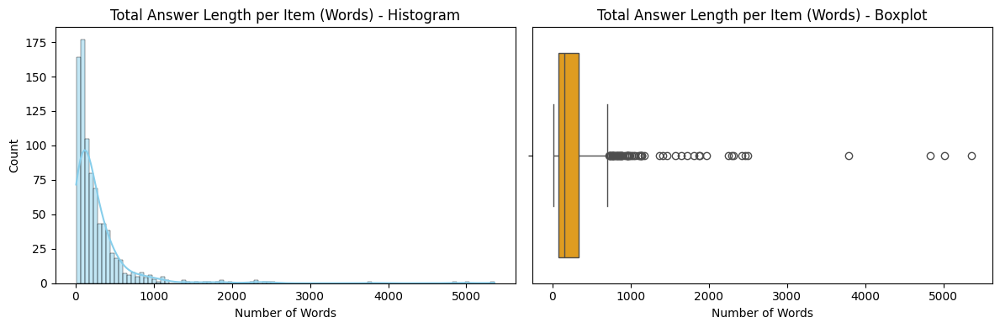

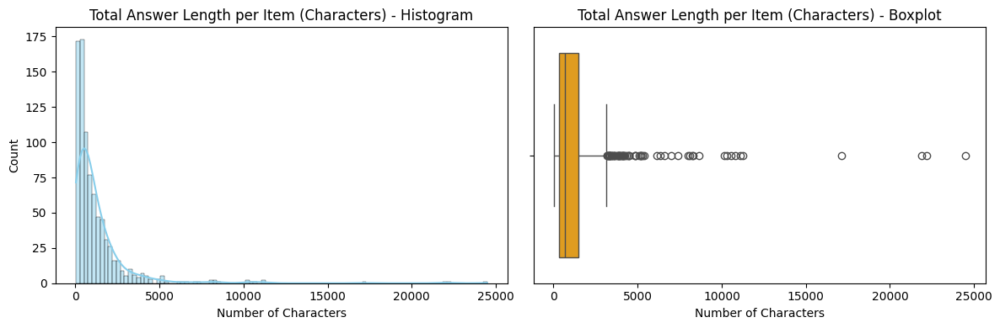

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_hist_box(data, title, xlabel):
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))

    sns.histplot(data, kde=True, ax=axs[0], color='skyblue')
    axs[0].set_title(f'{title} - Histogram')
    axs[0].set_xlabel(xlabel)

    sns.boxplot(x=data, ax=axs[1], color='orange')
    axs[1].set_title(f'{title} - Boxplot')
    axs[1].set_xlabel(xlabel)

    plt.tight_layout()
    plt.show()

plot_hist_box(answer_word_lens_per_item, "Total Answer Length per Item (Words)", "Number of Words")
plot_hist_box(answer_char_lens_per_item, "Total Answer Length per Item (Characters)", "Number of Characters")


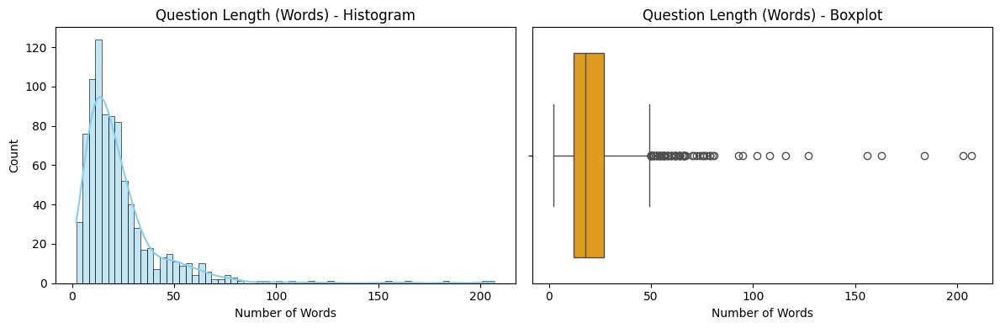

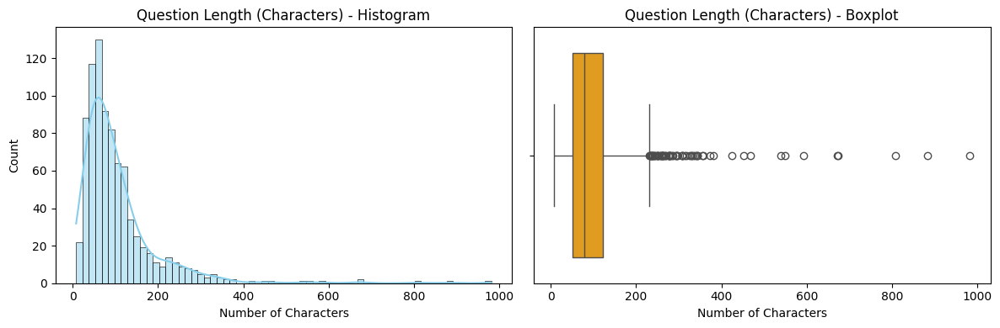

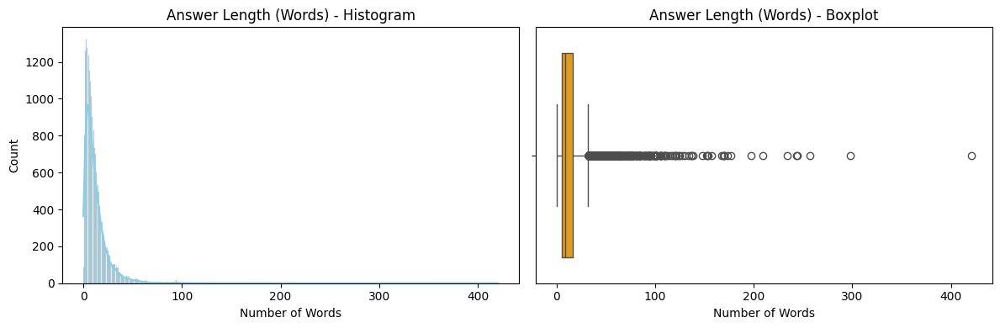

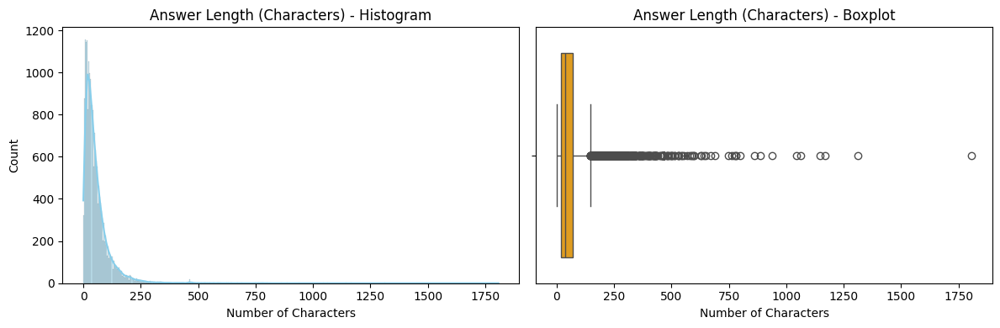

In [ ]:


plot_hist_box(question_word_lens, "Question Length (Words)", "Number of Words")
plot_hist_box(question_char_lens, "Question Length (Characters)", "Number of Characters")
plot_hist_box(answer_word_lens, "Answer Length (Words)", "Number of Words")
plot_hist_box(answer_char_lens, "Answer Length (Characters)", "Number of Characters")


### Identify the most engaging questions

Max number of answers for any question: 315
Questions with max answers: [432]

QID: 432, Number of answers: 315


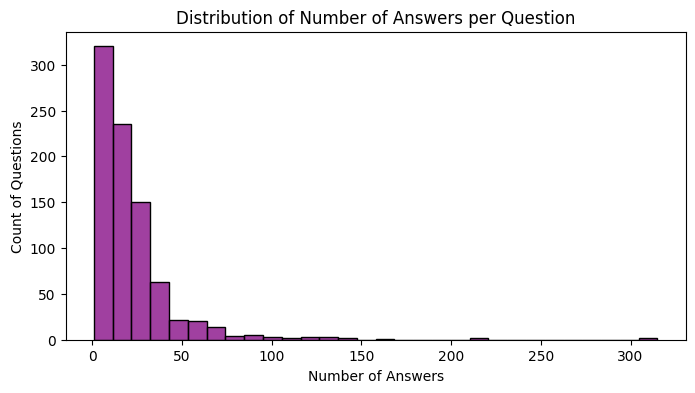

Top 5 questions with highest number of answers:
QID: 432, Answers: 315


real question:


QID: 13, Answers: 313


real question:


QID: 203, Answers: 215


real question:


QID: 589, Answers: 215


real question:


QID: 55, Answers: 166


real question:


In [ ]:
import numpy as np
from IPython.display import display, HTML
import matplotlib.pyplot as plt
import seaborn as sns

answer_counts = [len(item['answers']) for item in preprocessed_data]

max_answers = max(answer_counts)
max_answer_qids = [i for i, count in enumerate(answer_counts) if count == max_answers]

print(f"Max number of answers for any question: {max_answers}")
print(f"Questions with max answers: {max_answer_qids}")

def display_persian_text(text):
    html = f'<div style="direction: rtl; font-family: Tahoma, Arial; font-size: 11pt; margin: 5px 0;">{text}</div>'
    return HTML(html)

for qid in max_answer_qids:
    print(f"\nQID: {qid}, Number of answers: {answer_counts[qid]}")
    display(display_persian_text(" ".join(preprocessed_data[qid]['question'])))

plt.figure(figsize=(8,4))
sns.histplot(answer_counts, bins=30, kde=False, color='purple')
plt.title("Distribution of Number of Answers per Question")
plt.xlabel("Number of Answers")
plt.ylabel("Count of Questions")
plt.show()

top_n = 5
top_indices = np.argsort(answer_counts)[-top_n:][::-1]


print(f"Top {top_n} questions with highest number of answers:")
for i in top_indices:
    print(f"QID: {i}, Answers: {answer_counts[i]}")
    display(display_persian_text(" ".join(preprocessed_data[i]['question'])))
    print("real question:")
    display(display_persian_text(simplified_data[i]["question"]))


The main focus of these topics is on the relationships between men and women, particularly addressing issues within a family, especially between husband and wife.

### Analyze user activity patterns

In [ ]:
from datetime import datetime
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

all_comment_dates = []

# for entry in simplified_data:
#     comments = entry.get("Comments", [])
#     for comment in comments:
#         date_str = comment.get("CDate") or comment.get("LabelDate")
#         if date_str:
#             try:
#                 dt = datetime.fromisoformat(date_str.replace("Z", "+00:00"))
#                 all_comment_dates.append(dt)
#             except Exception:
#                 pass
# all_comment_dates = []
for entry in simplified_data:
    # Now we can access the "Comments" key because it exists in the full data
    comments = entry.get("Comments", [])
    for comment in comments:
        # Get either "CDate" or "LabelDate"
        date_str = comment.get("CDate") or comment.get("LabelDate")
        if date_str:
            try:
                # Parse the ISO format date string into a datetime object
                dt = datetime.fromisoformat(date_str.replace("Z", "+00:00"))
                all_comment_dates.append(dt)
            except (ValueError, TypeError):
                # Skip any dates that are malformed
                pass

# --- Step 3: Your original analysis and plotting code (now works correctly) ---
print(f"Found {len(all_comment_dates)} valid comment dates to analyze.")

# Convert the list of dates into a pandas DataFrame
# This column will now have the correct datetime dtype
df = pd.DataFrame({"datetime": all_comment_dates})

# Extract time features using the .dt accessor
df['hour'] = df['datetime'].dt.hour
df['day_of_week'] = df['datetime'].dt.day_name()
df['date'] = df['datetime'].dt.date

# Set a consistent order for the days of the week
order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Plot 1: Activity by Hour
plt.figure(figsize=(12, 5))
sns.countplot(x='hour', data=df, color='teal')
plt.title("User Activity by Hour of Day")
plt.xlabel("Hour")
plt.ylabel("Number of Comments")
plt.show()

# Plot 2: Activity by Day of Week
plt.figure(figsize=(12, 5))
sns.countplot(x='day_of_week', data=df, order=order, color='orange')
plt.title("User Activity by Day of Week")
plt.xlabel("Day of Week")
plt.ylabel("Number of Comments")
plt.xticks(rotation=45)
plt.show()

# Plot 3: Heatmap of Activity
pivot = df.groupby(['day_of_week', 'hour']).size().unstack(fill_value=0)
pivot = pivot.reindex(order)

plt.figure(figsize=(15, 7))
sns.heatmap(pivot, cmap="YlGnBu")
plt.title("Heatmap of User Activity by Day and Hour")
plt.xlabel("Hour of Day")
plt.ylabel("Day of Week")
plt.show()


Found 0 valid comment dates to analyze.


AttributeError: Can only use .dt accessor with datetimelike values

/tmp/ipython-input-1827991377.py:31: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df_q, df_c], ignore_index=True)


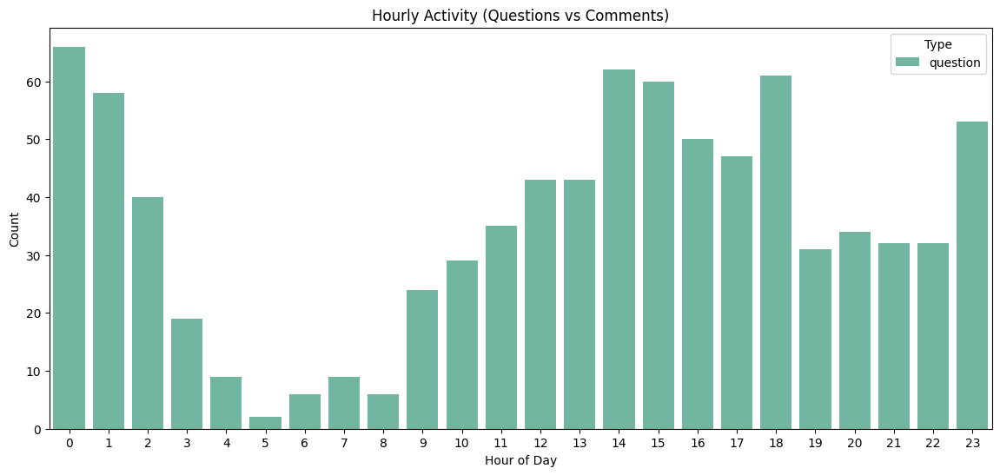

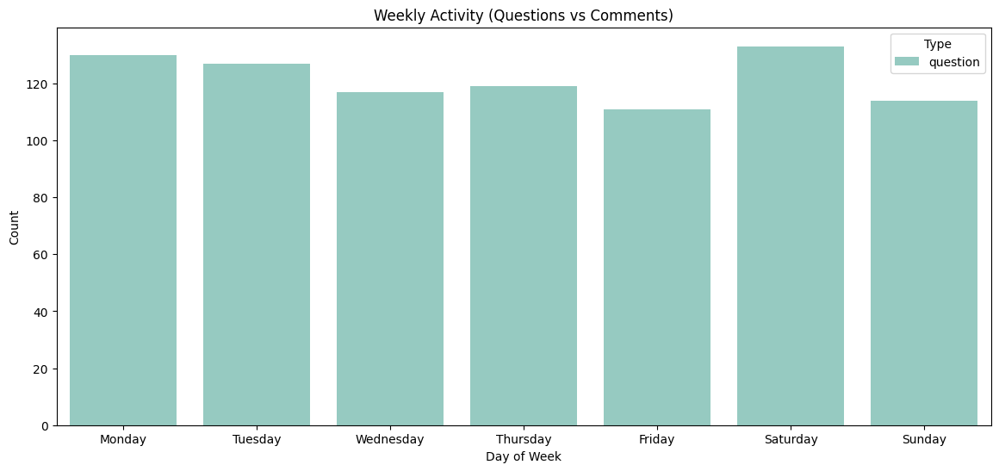

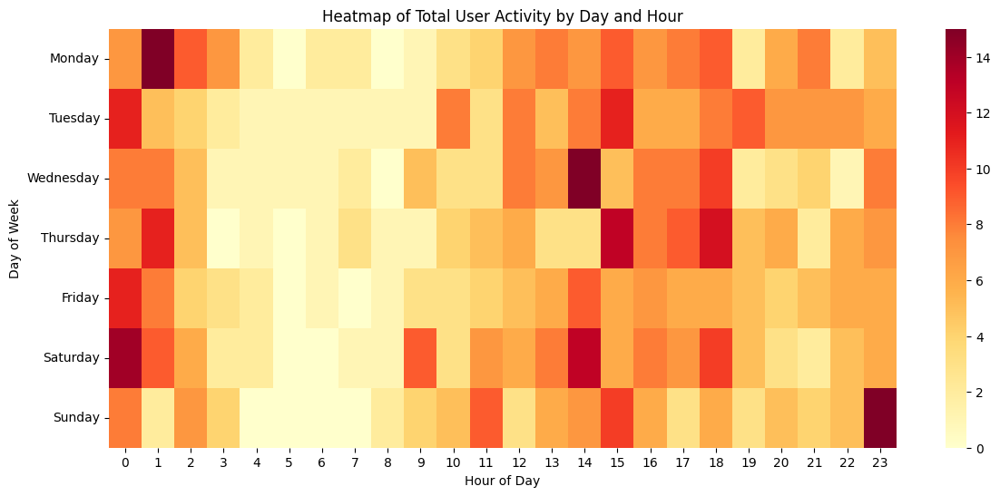

In [ ]:
from datetime import datetime
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

question_dates = []
comment_dates = []

for entry in simplified_data:
    qdate_str = entry.get("QDATE")
    if qdate_str:
        try:
            dt = datetime.fromisoformat(qdate_str.replace("Z", "+00:00"))
            question_dates.append(dt)
        except Exception:
            pass

    comments = entry.get("Comments", [])
    for comment in comments:
        cdate_str = comment.get("CDate") or comment.get("LabelDate")
        if cdate_str:
            try:
                dt = datetime.fromisoformat(cdate_str.replace("Z", "+00:00"))
                comment_dates.append(dt)
            except Exception:
                pass

df_q = pd.DataFrame({"datetime": question_dates, "type": "question"})
df_c = pd.DataFrame({"datetime": comment_dates, "type": "comment"})

df = pd.concat([df_q, df_c], ignore_index=True)

df['hour'] = df['datetime'].dt.hour
df['day_of_week'] = df['datetime'].dt.day_name()
df['date'] = df['datetime'].dt.date

order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

plt.figure(figsize=(14, 6))
sns.countplot(data=df, x='hour', hue='type', palette='Set2')
plt.title("Hourly Activity (Questions vs Comments)")
plt.xlabel("Hour of Day")
plt.ylabel("Count")
plt.legend(title='Type')
plt.show()

plt.figure(figsize=(14, 6))
sns.countplot(data=df, x='day_of_week', hue='type', order=order, palette='Set3')
plt.title("Weekly Activity (Questions vs Comments)")
plt.xlabel("Day of Week")
plt.ylabel("Count")
plt.legend(title='Type')
plt.show()

pivot = df.groupby(['day_of_week', 'hour']).size().unstack(fill_value=0)
pivot = pivot.reindex(order)

plt.figure(figsize=(14, 6))
sns.heatmap(pivot, cmap="YlOrRd")
plt.title("Heatmap of Total User Activity by Day and Hour")
plt.xlabel("Hour of Day")
plt.ylabel("Day of Week")
plt.show()


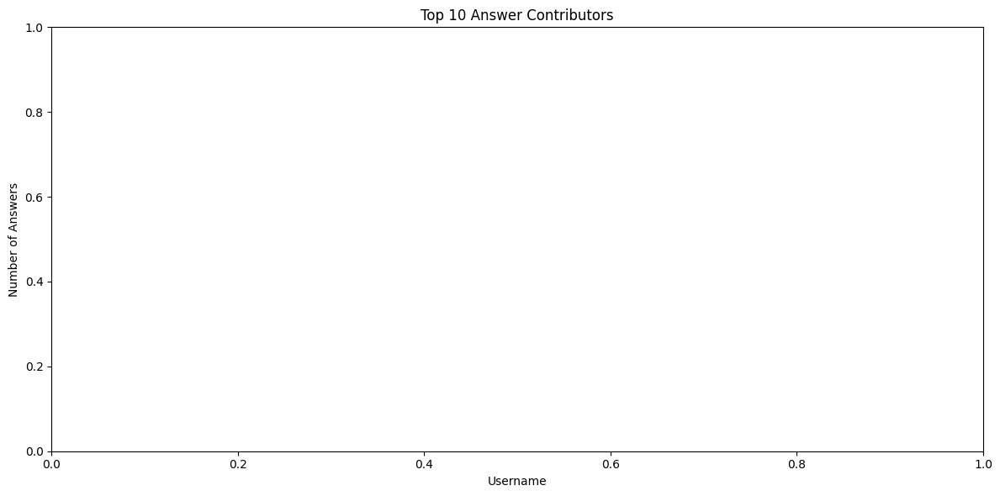

In [ ]:
import matplotlib.pyplot as plt
from collections import Counter
import seaborn as sns
import pandas as pd

import arabic_reshaper
from bidi.algorithm import get_display

def reshape_rtl(text):
    reshaped_text = arabic_reshaper.reshape(text)
    bidi_text = get_display(reshaped_text)
    return bidi_text


user_counter = Counter()

for entry in simplified_data:
    for comment in entry.get("Comments", []):
        username = comment.get("CUsername")
        if username:
            user_counter[username] += 1



top_users = user_counter.most_common(10)
df_top_users = pd.DataFrame(top_users, columns=["username", "answer_count"])
df_top_users['username_rtl'] = df_top_users['username'].apply(reshape_rtl)

plt.figure(figsize=(12, 6))
sns.barplot(data=df_top_users, x="username_rtl", y="answer_count", color="steelblue")

plt.title("Top 10 Answer Contributors")
plt.xlabel("Username")
plt.ylabel("Number of Answers")
plt.xticks(rotation=0, ha='center')
plt.tight_layout()
plt.show()



Top 20 Question words:
[('داشت#دار', 197), ('به', 195), ('داره', 192), ('هست', 190), ('بچه', 189), ('میشه', 173), ('دختر', 166), ('باشه', 156), ('الان', 148), ('پسر', 138), ('گرفت#گیر', 131), ('میکنه', 130), ('بد', 123), ('چی', 120), ('چیکار', 110), ('کرد#کن', 108), ('شیر', 108), ('دکتر', 107), ('زد#زن', 106), ('ماهشه', 105)]
Top 20 Answer words:
[('داشت#دار', 2199), ('کرد#کن', 2084), ('میشه', 1806), ('کن', 1638), ('داره', 1605), ('دیگه', 1558), ('عزیز', 1545), ('بچه', 1499), ('من', 1485), ('به', 1468), ('باشه', 1441), ('اگه', 1376), ('الان', 1297), ('شوهر', 1156), ('گرفت#گیر', 1137), ('دکتر', 1121), ('ک', 1076), ('زد#زن', 1066), ('دید#بین', 1058), ('هست', 1054)]


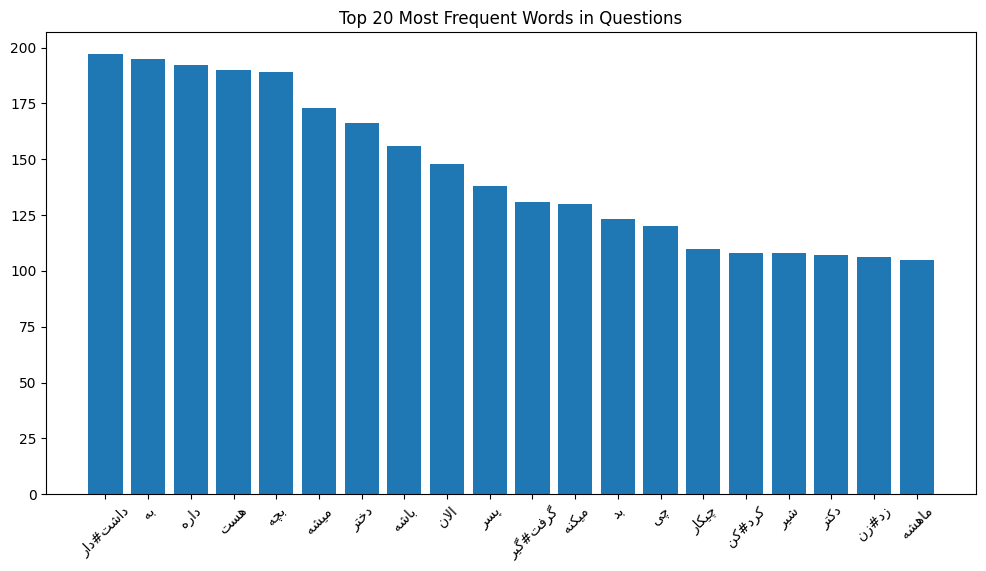

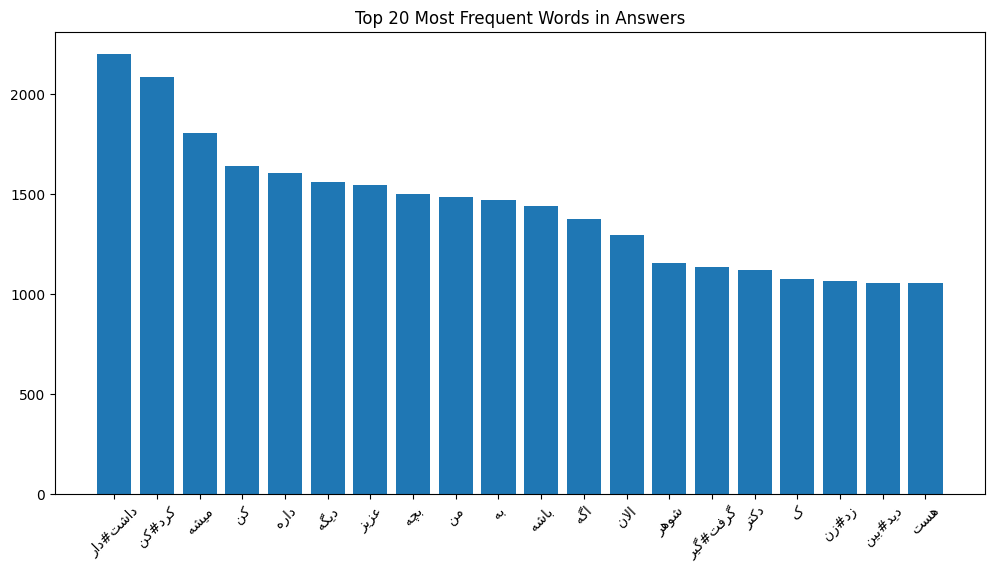

In [ ]:
from collections import Counter
import matplotlib.pyplot as plt

all_question_tokens = []
all_answer_tokens = []

all_question_tokens_without_stopwords = []
all_answer_tokens_without_stopwords = []

for item in preprocessed_data:
    all_question_tokens.extend(item["question"])
    for ans_tokens in item["answers"]:
        all_answer_tokens.extend(ans_tokens)

for item in preprocessed_data_without_stopwords:
    all_question_tokens_without_stopwords.extend(item["question"])
    for ans_tokens in item["answers"]:
        all_answer_tokens_without_stopwords.extend(ans_tokens)

question_counter = Counter(all_question_tokens)
answer_counter = Counter(all_answer_tokens)

print("Top 20 Question words:")
print(question_counter.most_common(20))

print("Top 20 Answer words:")
print(answer_counter.most_common(20))

words, counts = zip(*question_counter.most_common(20))
reshaped_words = [reshape_rtl(word) for word in words]

plt.figure(figsize=(12,6))
plt.bar(reshaped_words, counts)
plt.title("Top 20 Most Frequent Words in Questions")
plt.xticks(rotation=45)
plt.show()



words, counts = zip(*answer_counter.most_common(20))
reshaped_words = [reshape_rtl(word) for word in words]

plt.figure(figsize=(12,6))
plt.bar(reshaped_words, counts)
plt.title("Top 20 Most Frequent Words in Answers")
plt.xticks(rotation=45)
plt.show()



In [ ]:
from wordcloud import WordCloud

question_text = " ".join(all_question_tokens)
answer_text = " ".join(all_answer_tokens)


wc_question = WordCloud(
    font_path='/content/Vazirmatn-Black.ttf',
    width=800,
    height=400,
    background_color="white"
).generate(question_text)

plt.figure(figsize=(12,6))
plt.imshow(wc_question, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud for Questions")
plt.show()

wc_answer = WordCloud(
    font_path='/content/Vazirmatn-Black.ttf',
    width=800,
    height=400,
    background_color="white"
).generate(answer_text)

plt.figure(figsize=(12,6))
plt.imshow(wc_answer, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud for Answers")
plt.show()


OSError: cannot open resource

In [ ]:
import nltk
from nltk.util import ngrams

nltk.download('stopwords')
from nltk.corpus import stopwords

from hazm import stopwords_list
stop_words = set(stopwords_list())


def get_ngrams(tokens, n):
    return list(ngrams(tokens, n))

def filter_stopwords(tokens):
    return [t for t in tokens if t not in stop_words]

def plot_top_ngrams(tokens, n, title, top_k=20):
    n_grams = get_ngrams(tokens, n)
    ngram_counts = Counter(n_grams)
    common_ngrams = ngram_counts.most_common(top_k)

    labels = [" ".join(gram) for gram, _ in common_ngrams]
    counts = [count for _, count in common_ngrams]
    labels = [reshape_rtl(label) for label in labels]

    plt.figure(figsize=(12,6))
    plt.bar(labels, counts)
    plt.title(title)
    plt.xticks(rotation=45)
    plt.show()


plot_top_ngrams(all_question_tokens_without_stopwords, 1, "Top 20 Unigrams in Questions (before stopword removal)")
plot_top_ngrams(all_question_tokens_without_stopwords, 2, "Top 20 Bigrams in Questions (before stopword removal)")
plot_top_ngrams(all_question_tokens_without_stopwords, 3, "Top 20 Trigrams in Questions (before stopword removal)")

filtered_question_tokens = filter_stopwords(all_question_tokens)
plot_top_ngrams(filtered_question_tokens, 1, "Top 20 Unigrams in Questions (after stopword removal)")
plot_top_ngrams(filtered_question_tokens, 2, "Top 20 Bigrams in Questions (after stopword removal)")
plot_top_ngrams(filtered_question_tokens, 3, "Top 20 Trigrams in Questions (after stopword removal)")


In [ ]:
# !pip install --upgrade numpy
!pip install -U "sentence-transformers<3.0.0" "transformers<4.39.0"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.7/130.7 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 171.5/171.5 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.5/8.5 MB 27.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 68.7 MB/s eta 0:00:00
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.21.4
    Uninstalling tokenizers-0.21.4:
      Successfully uninstalled tokenizers-0.21.4
  Attempting uninstall: transformers
    Found existing installation: transformers 4.54.1
    Uninstalling transformers-4.54.1:
      Successfully uninstalled transformers-4.54.1
  Attempting uninstall: sentence-transformers
    Found existing installation: sentence-transformers 5.0.0
    Uninstalling sentence-transformers-5.0.0:
      Successfully uninstalled sentence-transformers-5.0.0


## 3. Analyse the dataset

### Load the bge-m3 embedding model and test it

In [ ]:
# !pip install --upgrade numpy
!pip install -U "sentence-transformers<3.0.0" "transformers<4.39.0"

In [ ]:
import json
with open("./simplified_dataset.json", "r", encoding="utf-8") as f:
    loaded_data = json.load(f)

preprocessed_data = loaded_data
print(preprocessed_data[0])

{'question': ['وزن', 'نوزاد', 'چی', 'خوبه', 'توقف', 'وزن', 'پسر', '۱۶', 'ماهه', 'هست', '۸', 'ماه', 'وزن', 'اضافه', 'کرد#کن'], 'answers': [['مامانا', 'بدین'], ['شربت', 'زینک', 'اشتها', 'اوره', 'بچه', 'شیرموز', 'عصاره', 'قلم', 'گوساله', 'غذا', 'بریز', 'کره', 'سرلاک', 'اب', 'هویج', 'بستن', 'اینا', 'تجربه', 'خودمه', 'پسر', '۱۸', 'ماهشه', 'اینارو', 'میدم'], ['سویق', 'کودک', 'پای', 'مرغ', 'قلم', 'گوسفند', 'گوساله'], ['روغن', 'زیتون', 'پای', 'مرغ'], ['۱۶', 'ماه', 'وزن', '۸۹۰۰', 'قد', '۹۶', 'سر', '۴۸', 'اشتها', 'نداره', 'چن', 'قاشق', 'میخوره', 'قطره', 'اهن', 'فروز', 'مال', 'داد#ده', 'فرق', 'کرد#کن'], ['عزیز', 'پای', 'مرع', 'مخاس', 'بد', 'گفتن', 'بده', 'مضره', 'ترسید#ترس', 'عصاره', 'گوشت', 'میدم', 'نمیخوره', 'بزور', 'دهنش', 'ریخت#ریز']]}


In [ ]:
from sentence_transformers import SentenceTransformer

model = SentenceTransformer("BAAI/bge-m3")


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/123 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/54.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/687 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/2.27G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/444 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/17.1M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/964 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/191 [00:00<?, ?B/s]

In [ ]:
import random
import torch

sample = random.choice(preprocessed_data)
qbody = sample["question"]

embedding = model.encode(qbody, convert_to_tensor=True)

print("Question:", qbody)
print("output format embedding:", embedding.shape)
print("sample embedding numbers:", embedding[:10])


Question: ['ونامزدم', 'قبلایکسال', 'دوست', 'بود#باش', 'تازه', 'نامزدشدیم', 'تولدمن', 'تیرماه', 'بودبااینکه', 'باهم', 'بود#باش', 'کادوبرامن', 'خرید#خر', 'تبریک', 'تلفن', 'پیامک', 'وکلی', 'مهربونی', 'وقربون', 'صدقه', 'هیچ', 'نخریدبرامن', 'همون', 'روز', 'تولد', 'دید#بین', 'همدیگر', 'سرکاربودولی', 'ده', 'روز', 'رفت#رو', 'اماکادونخریده', 'ناراحت', 'شد#شو', 'امانگفتم', 'به', 'چندوقت', 'گفت#گو', 'توبرا', 'براتولدم', 'کادونخریدی', 'برام', 'بخر', 'اونم', 'باشه', 'چشم', 'هنوز', 'خرید#خر', 'اماهربارکه', 'میومدن', 'خونمون', 'سبدگلای', 'خشگل', 'وبزرگ', 'شیرینی', 'میخره', 'اسفندتولدشه', 'چکارکنم', 'نمیخوام', 'براش', 'کادوبگیرم', 'تایادبگیره', 'برام', 'ارزش', 'قائل', 'بشه', 'من', 'متقابل', 'براش', 'ارزش', 'قائل', 'بشم', 'یااینکه', 'خرید#خر', 'براش', '؟؟', 'میدونید', 'برام', 'مهمه', 'درس', 'بگیره', 'رفتار', 'درهرصورت', 'ترسید#ترس', 'خرید#خر', 'براش', 'بعدباخودش', 'بگه', 'براش', 'ارزش', 'قائل', 'بشم', 'نشم', 'اون', 'به', 'بها', 'میده', 'عادت', 'کنه', 'بی\u200cاهمیت', 'باشه', 'مناسبتا', 'مردارو', 'میدون

The output is a PyTorch tensor of shape [25, 1024].

Explanation:

25 = number of tokens in the input question (the 5 words).

1024 = the dimension of the embedding vector for each token.

This means the model generated a 1024-dimensional vector for each individual token rather than a single vector for the whole question.

### Install LanceDB and set up an embedding function

In [ ]:
!pip install --upgrade pip
!pip install lancedb sentence-transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 17.5 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.8/35.8 MB 51.8 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.3/45.3 MB 57.8 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5/5 [lancedb]


In [ ]:
import pyarrow
import lancedb
print("PyArrow version:", pyarrow.__version__)
print("LanceDB version:", lancedb.__version__)


PyArrow version: 18.1.0
LanceDB version: 0.25.0


This code defines a custom embedding function called **BGETransformerEmbedding** for use with LanceDB. Its purpose is to convert text into numeric vectors (embeddings) that capture the semantic meaning of sentences.

In [ ]:
from lancedb.embeddings import register, TextEmbeddingFunction
from lancedb.util import attempt_import_or_raise
from functools import cached_property
from typing import List
import sentence_transformers

@register("bge-m3")
class BGETransformerEmbedding(TextEmbeddingFunction):
    name: str = "BAAI/bge-m3"
    device: str = "cuda"
    normalize: bool = True

    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self._model = sentence_transformers.SentenceTransformer(self.name, device=self.device)

    def generate_embeddings(self, texts: List[str]) -> List[List[float]]:
        clean_texts = [
            t if isinstance(t, str) else " ".join(t)
            for t in texts
        ]
        return self._model.encode(clean_texts, normalize_embeddings=self.normalize).tolist()

    def ndims(self) -> int:
        return self._model.get_sentence_embedding_dimension()


### Define a schema for your vector database

Here we define the schema of our vector database with **QId**, **QBody** and **Embedding** as its fields.

In [ ]:
from lancedb.pydantic import LanceModel, Vector
from lancedb.embeddings import EmbeddingFunctionRegistry
import sentence_transformers
from typing import List

registry = EmbeddingFunctionRegistry.get_instance()
embedder = registry.get("bge-m3").create()

class QuestionSchema(LanceModel):
    qid: int
    qbody: str = embedder.SourceField()
    embedding: Vector(embedder.ndims()) = embedder.VectorField()


RuntimeError: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx

In [ ]:
import lancedb

db = lancedb.connect("/tmp/nini-db")

In [ ]:
table = db.create_table("questions", schema=QuestionSchema, mode="overwrite")

import pandas as pd

df = pd.DataFrame([
    {"qid": idx, "qbody": " ".join(item["question"])}
    for idx, item in enumerate(preprocessed_data)
])

table.add(df)


### Perform semantic search with LanceDB

The semantic search results show a **moderate** level of relevance to the user queries. In many cases, the retrieved answers are topically related but not always precisely aligned with the query. For example, queries about preparing a child for school or managing a stubborn child often return answers discussing child development, behavior, or educational activities, which is semantically related, even if some answers include extraneous details. Similarly, pregnancy- and postpartum-related queries retrieve posts mentioning pregnancy experiences, baby care, or postpartum relationships, but occasionally the retrieved answers focus on tangentially related topics like vaccination schedules or general child health.

Overall, the results demonstrate that the model captures **general semantic similarity**, identifying content that shares contextual meaning rather than exact keywords. However, some retrieved results are only loosely relevant, highlighting that while the embedding-based search improves over keyword search, **manual evaluation** or **reranking** may still be necessary to ensure high precision for specific questions.

In [ ]:
queries = [
    "چگونه می‌توانم فرزندم را برای شروع مدرسه آماده کنم؟",
    "چه علائمی در هفته اول بارداری طبیعی است؟",
    "چه نکاتی را باید درباره رابطه زناشویی بعد از زایمان بدانم؟",
    "چگونه می‌توانم رفتار کودک لجباز خود را مدیریت کنم؟",
    "بهترین تغذیه برای نوزاد شیرخوار در ماه‌های اول چیست؟",
    "چه روش‌هایی برای آماده کردن کودک به محیط مدرسه وجود دارد؟",
    "علائم خطرناک بارداری در هفته‌های ابتدایی کدامند؟",
    "پس از زایمان، چند وقت باید برای شروع رابطه جنسی صبر کرد؟",
    "چگونه می‌توانم خشم و لجبازی کودک ۲ تا ۴ ساله را کنترل کنم؟",
    "چه نوع شیرخشک یا تغذیه تکمیلی برای نوزاد مناسب‌تر است؟"
]


for query in queries:
    results = table.search(query).limit(5).to_list()
    print(f"🔎 Query: {query}")
    for r in results:
        print("→", r["qbody"])
    print()


NameError: name 'table' is not defined

### Implement classical full-text search using LanceDB

In [ ]:
queries = [
    "چگونه می‌توانم فرزندم را برای شروع مدرسه آماده کنم؟",
    "چه علائمی در هفته اول بارداری طبیعی است؟",
    "چه نکاتی را باید درباره رابطه زناشویی بعد از زایمان بدانم؟",
    "چگونه می‌توانم رفتار کودک لجباز خود را مدیریت کنم؟",
    "بهترین تغذیه برای نوزاد شیرخوار در ماه‌های اول چیست؟",
    "چه روش‌هایی برای آماده کردن کودک به محیط مدرسه وجود دارد؟",
    "علائم خطرناک بارداری در هفته‌های ابتدایی کدامند؟",
    "پس از زایمان، چند وقت باید برای شروع رابطه جنسی صبر کرد؟",
    "چگونه می‌توانم خشم و لجبازی کودک ۲ تا ۴ ساله را کنترل کنم؟",
    "چه نوع شیرخشک یا تغذیه تکمیلی برای نوزاد مناسب‌تر است؟"
]


fts_results = []

for query in queries:
    matches = table.to_pandas()
    filtered = matches[matches["qbody"].str.contains(query.split()[0], case=False, na=False)].head(5)
    fts_results.append((query, filtered))



In [ ]:
for i, (query, df) in enumerate(fts_results, 1):
    print(f"\n🔎 Query {i}: {query}")
    print("="*60)
    if df.empty:
        print("❌ No results found.")
    else:
        for j, row in df.iterrows():
            print(f"→ {row['qbody']}")


**Semantic Search Outputs:**

- Answers are more relevant to the query topic.

- Even if the exact query words do not appear, semantically related concepts are retrieved.

- Some results may still be ambiguous or only loosely related, indicating the need for manual evaluation or reranking.

- Complex or multi-part queries are handled better, providing meaningful responses.

- For example, the query “How can I prepare my child for starting school?” retrieves answers about child education, behavior, readiness, and related issues.

**Full-Text Search Outputs:**

- Often returns “No results found” or largely irrelevant results.

- Pure keyword matching fails when the exact query text is absent, informal, or contains irregular characters.

- Queries like “How can I prepare my child for starting school?” return no results due to lack of exact matches.

**Comparison:** Semantic search clearly outperforms full-text search by capturing meaning rather than relying on exact word matches, making it more suitable for informal, unstructured, or multi-lingual text.

### Research hybrid search techniques

Hybrid search is a method that combines two types of search systems: semantic search and keyword (lexical) search.

- **Semantic search** tries to understand the meaning of the query and match it with similar meanings in the database using vector embeddings (like BGE-M3).
- **Keyword search** looks for exact matches of words in the query with the text in the database.

Each of them has strengths and weaknesses:
- Semantic search is good at understanding meaning, even if the words are different.
- Keyword search is more precise when the user uses the exact terms, but it may fail if there are typos or if the same idea is expressed differently.

Hybrid search combines both of these approaches. It gives each result a combined score, like this:

final_score = α * keyword_score + (1 - α) * semantic_score


The α value controls how much weight we give to each method. For example, if α = 0.3, it means we trust semantic similarity more than exact words.

**Why is hybrid search useful?**
- It improves accuracy by using both meaning and exact words.
- It helps avoid false results from relying only on one method.
- It's especially useful for real-world user questions, like those in NiniSite, which are often informal, incomplete, or written in different styles.

In short, hybrid search can find better and more relevant results than using either semantic or keyword search alone.


In this task, we manually reviewed the top results to check if they were relevant. However, in real applications, we often use standard evaluation metrics to measure search quality more objectively.

Here are some common metrics:

- **Precision@k**: Measures how many of the top *k* results are actually relevant. For example, if 3 out of the top 5 results are relevant, then precision@5 = 3/5 = 0.6.

- **Recall@k**: Measures how many of all possible relevant results are retrieved in the top *k*. For example, if there are 6 total relevant documents and 3 are in the top 5, then recall@5 = 3/6 = 0.5.

- **NDCG@k (Normalized Discounted Cumulative Gain)**: Takes into account both the relevance and the position of results. It gives higher weight to relevant results that appear earlier in the list. This helps evaluate ranked lists more fairly.

These metrics help compare different search systems (e.g., semantic, keyword, hybrid) in a quantitative way, especially when you have a set of labeled "ground truth" results.


## 4. Answer Ranking Enhancement with a Reranker

In [ ]:
from sentence_transformers import CrossEncoder
reranker = CrossEncoder('cross-encoder/ms-marco-MiniLM-L-6-v2')


/usr/local/lib/python3.12/dist-packages/huggingface_hub/file_download.py:945: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/794 [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/huggingface_hub/file_download.py:945: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/132 [00:00<?, ?B/s]

In [ ]:
queries = [
    "چگونه می‌توانم فرزندم را برای شروع مدرسه آماده کنم؟",
    "چه علائمی در هفته اول بارداری طبیعی است؟",
    "چه نکاتی را باید درباره رابطه زناشویی بعد از زایمان بدانم؟",
    "چگونه می‌توانم رفتار کودک لجباز خود را مدیریت کنم؟",
    "بهترین تغذیه برای نوزاد شیرخوار در ماه‌های اول چیست؟",
    "چه روش‌هایی برای آماده کردن کودک به محیط مدرسه وجود دارد؟",
    "علائم خطرناک بارداری در هفته‌های ابتدایی کدامند؟",
    "پس از زایمان، چند وقت باید برای شروع رابطه جنسی صبر کرد؟",
    "چگونه می‌توانم خشم و لجبازی کودک ۲ تا ۴ ساله را کنترل کنم؟",
    "چه نوع شیرخشک یا تغذیه تکمیلی برای نوزاد مناسب‌تر است؟"
]


for query in queries:
    results = table.search(query).limit(5).to_list()
    print(f"🔎 Query: {query}")
    for r in results:
        print("→", r["qbody"])
    print()


NameError: name 'table' is not defined

In [ ]:
from sentence_transformers import CrossEncoder
reranker = CrossEncoder('cross-encoder/ms-marco-MiniLM-L-6-v2')

for query in queries:
    results = table.search(query).limit(5).to_list()
    pairs = [(query, r["qbody"]) for r in results]
    rerank_scores = reranker.predict(pairs)
    reranked_results = [x for _, x in sorted(zip(rerank_scores, results), reverse=True)]

    print(f"🔎 Query: {query}")
    for r in reranked_results:
        print("→", r["qbody"])
    print()


### Comparison of Semantic Search Results Before and After Reranking

**1. Ranking Changes**  
- **Before reranking:**  
  - Results were retrieved based on semantic similarity but not optimally ordered.  
  - Some less relevant or loosely related results appeared higher (e.g., “آینده بچه هاتون چطور پس‌انداز میکنین روش” for school preparation).  

- **After reranking:**  
  - The most contextually relevant results are pushed to the top.  
  - Posts specifically about teaching, child readiness, and behavior appear before peripheral posts like saving money.  
  - Pregnancy and postnatal queries similarly show more medically or behaviorally relevant posts at the top.
---
**2. Query-Result Alignment**  
- **Before reranking:**  
  - Top results could be only tangentially related to the query.  
  - Child behavior queries returned posts about general feeding or growth rather than behavior control.  

- **After reranking:**  
  - Posts directly relevant to the query intent appear first.  
  - Child behavior queries prioritize posts on tantrums and management strategies.  
  - Infant nutrition queries prioritize actionable feeding guidance.
---
**3. Overall Effectiveness**  
- Semantic search alone captures broad similarity but may rank loosely related posts higher.  
- With reranker, results are reordered by query relevance, improving precision and ensuring the most useful posts appear first.


# <b><font size=7 color='orange'> Computer Assignment 5&6 - Task 3 </font></b>



# Task 3: LLM for Multiple Choice Questions - BERT Fine-tuning on SWAG Dataset

## Question 3.1: Dataset Analysis and Preprocessing (20 Points)

**a) SWAG Dataset Exploration (8 Points)**
- Load and analyze the SWAG (Situations With Adversarial Generations) dataset structure
- Examine the distribution of correct answers across the dataset splits
- Provide sample examples showing the context, question, and multiple choice options
- What makes SWAG challenging compared to other multiple choice datasets?

**b) Data Preprocessing for Multiple Choice (7 Points)**
- Implement preprocessing to format text for BERT's multiple choice architecture
- Create input pairs combining context + question + each ending option
- Handle tokenization and sequence length management for 4 choice options per question
- Why is proper preprocessing crucial for multiple choice question answering?

**c) Data Collation and Padding Strategy (5 Points)**
- Implement appropriate data collation for variable-length sequences
- Ensure proper padding and attention mask handling for batch processing
- Validate that the preprocessing maintains the relationship between options and labels

## Question 3.2: Baseline Model Evaluation (25 Points)

**a) Pre-trained BERT Loading and Setup (8 Points)**
- Load BERT-base-uncased model configured for multiple choice tasks
- Set up the model architecture for 4-way classification
- Ensure proper device placement (GPU/CPU) and model initialization

**b) Zero-shot Performance Assessment (10 Points)**
- Evaluate the pre-trained model without any fine-tuning on SWAG validation set
- Implement single example analysis to understand model decision-making
- Calculate baseline accuracy and analyze prediction patterns
- How does the pre-trained model perform compared to random guessing (25%)?

**c) Error Analysis and Model Behavior (7 Points)**
- Analyze which types of questions the baseline model struggles with most
- Examine the confidence scores and prediction distributions
- Identify common failure patterns in the zero-shot predictions

## Question 3.3: In-Context Learning (ICL) Implementation (25 Points)

**a) ICL Strategy Design (10 Points)**
- Design and implement in-context learning by providing examples in the input
- Select representative examples from the training set to include as context
- Format the input to include few-shot examples before the target question
- What are the key considerations when selecting examples for ICL?

**b) ICL Performance Evaluation (10 Points)**
- Evaluate the model performance with different numbers of in-context examples (1-shot, 3-shot, 5-shot)
- Compare ICL results against the zero-shot baseline
- Analyze how example selection strategy affects performance

**c) ICL vs Fine-tuning Trade-offs (5 Points)**
- Discuss the advantages and disadvantages of ICL compared to fine-tuning
- When would you choose ICL over fine-tuning in real-world applications?
- What are the computational and practical trade-offs?

## Question 3.4: Fine-tuning with PEFT (LoRA) (30 Points)

**a) LoRA Configuration and Setup (10 Points)**
- Implement Parameter-Efficient Fine-Tuning using LoRA (Low-Rank Adaptation)
- Configure appropriate LoRA parameters (rank, alpha, target modules)
- Set up training arguments optimized for the multiple choice task
- Why is PEFT preferred over full fine-tuning for large language models?

**b) Training Process and Monitoring (12 Points)**
- Implement the training loop with proper loss monitoring and validation
- Use appropriate learning rates, batch sizes, and optimization strategies
- Monitor training progress and implement early stopping if needed
- Track key metrics during training (loss, accuracy, convergence)

**c) Fine-tuned Model Evaluation (8 Points)**
- Evaluate the fine-tuned model on the test set using multiple metrics
- Calculate accuracy, generate confusion matrices, and analyze per-class performance
- Compare fine-tuned performance against baseline and ICL approaches
- Assess whether the improvements justify the computational cost

## Question 3.5: Advanced Analysis and Comparison (Bonus: +10 Points)

**a) Combined ICL + Fine-tuning (5 Points)**
- Implement a hybrid approach combining fine-tuning with in-context learning
- Evaluate whether providing examples to a fine-tuned model improves performance further
- Analyze the synergistic effects of both techniques

**b) Comprehensive Performance Analysis (5 Points)**
- Create a comprehensive comparison table of all approaches (zero-shot, ICL, fine-tuning, hybrid)
- Analyze computational costs vs. performance gains for each method
- Provide recommendations for different deployment scenarios based on your results
- Discuss the implications for practical applications of multiple choice QA systems

---

## 1. Hugging Face Access Token
First, make sure you're logged into your Hugging Face account. This is crucial for pushing your fine-tuned model to the Hub later, if you choose to. The recommended way in a notebook is notebook_login.



In [ ]:
# Run this cell and enter your token when prompted.
from huggingface_hub import notebook_login

notebook_login()

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


## 2. Loading the Dataset
Let's load the regular version of the SWAG dataset.



In [ ]:
from datasets import load_dataset

# Load the SWAG dataset
swag_dataset = load_dataset("swag", "regular")

# Let's see what we've got
print(swag_dataset)

README.md: 0.00B [00:00, ?B/s]

regular/train-00000-of-00001.parquet:   0%|          | 0.00/14.8M [00:00<?, ?B/s]

regular/validation-00000-of-00001.parque(…):   0%|          | 0.00/4.81M [00:00<?, ?B/s]

regular/test-00000-of-00001.parquet:   0%|          | 0.00/4.78M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/73546 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/20006 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/20005 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['video-id', 'fold-ind', 'startphrase', 'sent1', 'sent2', 'gold-source', 'ending0', 'ending1', 'ending2', 'ending3', 'label'],
        num_rows: 73546
    })
    validation: Dataset({
        features: ['video-id', 'fold-ind', 'startphrase', 'sent1', 'sent2', 'gold-source', 'ending0', 'ending1', 'ending2', 'ending3', 'label'],
        num_rows: 20006
    })
    test: Dataset({
        features: ['video-id', 'fold-ind', 'startphrase', 'sent1', 'sent2', 'gold-source', 'ending0', 'ending1', 'ending2', 'ending3', 'label'],
        num_rows: 20005
    })
})


## 3. Analyse the Dataset (EDA)
Understanding the data is key. Let's inspect a single example and look at the column names.

Column Meanings:

sent1: The context or the beginning of a sentence.

sent2: The second part of the sentence, which leads into the choice of endings.

ending0, ending1, ending2, ending3: The four possible endings for the sentence.

label: An integer (0, 1, 2, or 3) indicating which of the endings is the correct one.

video-id, fold-ind, startphrase: Metadata about the source of the example.



In [ ]:
# Inspect the first example from the training set
example = swag_dataset['train'][0]
print("Example from the dataset:")
for key, value in example.items():
    print(f"  {key}: {value}")

print("\n--- EDA ---")
print(f"Number of training examples: {len(swag_dataset['train'])}")
print(f"Number of validation examples: {len(swag_dataset['validation'])}")

# Check label distribution to see if it's balanced
import pandas as pd
df = pd.DataFrame(swag_dataset['train'])
print("\nLabel distribution in training set:")
print(df['label'].value_counts())

Example from the dataset:
  video-id: anetv_jkn6uvmqwh4
  fold-ind: 3416
  startphrase: Members of the procession walk down the street holding small horn brass instruments. A drum line
  sent1: Members of the procession walk down the street holding small horn brass instruments.
  sent2: A drum line
  gold-source: gold
  ending0: passes by walking down the street playing their instruments.
  ending1: has heard approaching them.
  ending2: arrives and they're outside dancing and asleep.
  ending3: turns the lead singer watches the performance.
  label: 0

--- EDA ---
Number of training examples: 73546
Number of validation examples: 20006

Label distribution in training set:
label
3    18458
0    18414
2    18340
1    18334
Name: count, dtype: int64


## 4 & 5. Preprocess the Dataset & Load Tokenizer
Here, we'll write the preprocessing function and load the bert-base-uncased tokenizer. The function will format each example into four complete sentences (context + one of the four endings) and tokenize them.



In [ ]:
from transformers import AutoTokenizer

# 5. Load the tokenizer
tokenizer = AutoTokenizer.from_pretrained("google-bert/bert-base-uncased")

# 4. Define the preprocessing function
def preprocess_function(examples):
    # Create four copies of the first sentence for each example
    first_sentences = [[context] * 4 for context in examples["sent1"]]

    # Get the start of the second sentence
    question_headers = examples["sent2"]

    # Combine the start of the second sentence with each of the four endings
    second_sentences = [
        [f"{header} {examples[f'ending{i}'][j]}" for i in range(4)]
        for j, header in enumerate(question_headers)
    ]

    # The tokenizer needs flattened lists, so we flatten them
    first_sentences = sum(first_sentences, [])
    second_sentences = sum(second_sentences, [])

    # Tokenize the paired sentences
    tokenized_examples = tokenizer(first_sentences, second_sentences, truncation=True)

    # Un-flatten the results so that each example has a list of 4 input_ids, etc.
    # This is the format expected by the DataCollatorForMultipleChoice
    return {k: [v[i:i+4] for i in range(0, len(v), 4)] for k, v in tokenized_examples.items()}# Use .map() to apply the function to the entire dataset
# batched=True processes multiple rows at once for speed
# tokenized_dataset = raw_dataset.map(preprocess_function, batched=True)


## 6. Apply the Preprocessing Function
Now, we apply this function to our entire dataset using .map(). Using batched=True speeds this up significantly.



In [ ]:
# Apply the function to the whole dataset
tokenized_swag = swag_dataset.map(preprocess_function, batched=True)

Map:   0%|          | 0/73546 [00:00<?, ? examples/s]

Map:   0%|          | 0/20006 [00:00<?, ? examples/s]

Map:   0%|          | 0/20005 [00:00<?, ? examples/s]

## 7. Padding with a Data Collator
The DataCollatorForMultipleChoice will handle padding dynamically for each batch. This is much more efficient than padding the entire dataset to a fixed maximum length.



In [ ]:
from transformers import DataCollatorForMultipleChoice

# Instantiate the data collator
data_collator = DataCollatorForMultipleChoice(tokenizer=tokenizer)

## 8. Load the Model
Let's load the pre-trained BERT model configured for multiple-choice tasks.



In [ ]:
from transformers import AutoModelForMultipleChoice

model = AutoModelForMultipleChoice.from_pretrained("google-bert/bert-base-uncased")

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForMultipleChoice were not initialized from the model checkpoint at google-bert/bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


## 9. Test the Model on the Dataset (Zero-Shot)
First, let's test the pre-trained model on one example without any fine-tuning. This is a "zero-shot" evaluation.

### 1. Test Case Analysis


In [ ]:
import torch

# Select a single example from the validation set
# Use indexing to get the dictionary directly
single_example = tokenized_swag["validation"][5]

# Prepare the inputs for the model
# The values are now single items, not lists of one item
model_input_keys = ["input_ids", "attention_mask", "token_type_ids", "label"]

# Create a new dictionary containing only the keys the model needs.
filtered_example = {k: v for k, v in single_example.items() if k in model_input_keys}

# Pass only the filtered example to the data collator
batch = data_collator([filtered_example])

# Ensure tensors are on the correct device (GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batch = {k: v.to(device) for k, v in batch.items()}
model.to(device)

# Get model predictions
with torch.no_grad():
    outputs = model(**batch)

# The outputs are logits. The highest logit corresponds to the predicted answer.
logits = outputs.logits
predicted_class = logits.argmax().item()
# Access the label directly, no need for [0]
actual_label = single_example['label']

print(f"Context: {single_example['sent1']}")
print(f"Start of ending: {single_example['sent2']}")
for i in range(4):
    ending = single_example[f'ending{i}']
    print(f"  ({i}) {ending}")

print(f"\nModel Prediction: {predicted_class}")
print(f"Actual Label:     {actual_label}")
print("\nDiscussion:")
if predicted_class == actual_label:
    print("The model correctly predicted the answer. Its general language understanding was sufficient for this example.")
else:
    print("The model failed on this example, which is expected as it has not been trained on this specific task format. Its pre-trained knowledge was not enough to infer the correct commonsense outcome.")

Context: The man holds a pointy tool that uses to fix the handle of the bike.
Start of ending: The man
  (0) takes out the cover of the handlebar and rise with the tool and spray liquid inside, then press the handle with his hand.
  (1) continues to take a bite of the bakes.
  (2) laughs and does little more flips.
  (3) looks down at the young man and stands next to a man dressed as a man stands on a sidewalk.

Model Prediction: 0
Actual Label:     0

Discussion:
The model correctly predicted the answer. Its general language understanding was sufficient for this example.


### 2. Comprehensive Validation Set Evaluation
Now, let's evaluate the model's accuracy across the entire validation set. We'll use the Trainer to make this easier.



In [ ]:
import numpy as np
from transformers import Trainer, TrainingArguments
import evaluate

# Define the metric computation function
accuracy_metric = evaluate.load("accuracy")
def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    predictions = np.argmax(predictions, axis=1)
    return accuracy_metric.compute(predictions=predictions, references=labels)

# Use a dummy TrainingArguments since we are only evaluating
training_args = TrainingArguments(
    output_dir="./results",
    per_device_eval_batch_size=16,
)

# Create a Trainer instance for evaluation
trainer = Trainer(
    model=model,
    args=training_args,
    eval_dataset=tokenized_swag["validation"],
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

# Get the evaluation results
zero_shot_results = trainer.evaluate()
print("--- Zero-Shot Baseline Performance ---")
print(zero_shot_results)

/tmp/ipython-input-547715731.py:19: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: tahamaj4 (tahamaj4-srg-ssr) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


--- Zero-Shot Baseline Performance ---
{'eval_loss': 1.3511570692062378, 'eval_model_preparation_time': 0.0026, 'eval_accuracy': 0.47240827751674497, 'eval_runtime': 235.3466, 'eval_samples_per_second': 85.007, 'eval_steps_per_second': 5.316}


In [ ]:
!pip install evaluate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 5.8 MB/s eta 0:00:00


## 10. Use In-Context Learning (ICL)
ICL involves modifying the prompt to give the model examples. For a BERT-style model, this means changing the text input. We'll try two approaches.

Note: ICL is most effective with large, instruction-tuned generative models. Its effect on a smaller encoder model like BERT on a multiple-choice task is often minimal or even negative, but it's an important concept to test.

### ICL Technique 1: Few-Shot Examples
We'll prepend two correct examples from the training set to the context of each validation example.



In [ ]:
# Create a few-shot prompt
shot1 = swag_dataset['train'][0]
shot2 = swag_dataset['train'][1]

def create_few_shot_prompt(shot1, shot2, example):
    prompt = (
        f"Example 1: Context: {shot1['sent1']} {shot1['sent2']} The correct ending is: {shot1[f'ending{shot1['label']}']}\n"
        f"Example 2: Context: {shot2['sent1']} {shot2['sent2']} The correct ending is: {shot2[f'ending{shot2['label']}']}\n\n"
        f"Current Question: Context: {example['sent1']}"
    )
    return prompt

def preprocess_icl_few_shot(examples):
    # Apply the prompt to the context (sent1)
    examples['sent1'] = [create_few_shot_prompt(shot1, shot2, {'sent1': s1}) for s1 in examples['sent1']]
    # Use the original preprocessing function logic
    return preprocess_function(examples)

# Apply this to a fresh copy of the validation set
icl_few_shot_validation = swag_dataset['validation'].map(preprocess_icl_few_shot, batched=True)

# Evaluate
print("\n--- Evaluating with Few-Shot ICL ---")
trainer.eval_dataset = icl_few_shot_validation
icl_few_shot_results = trainer.evaluate()
print(icl_few_shot_results)


--- Evaluating with Few-Shot ICL ---


{'eval_loss': 1.3610310554504395, 'eval_model_preparation_time': 0.0026, 'eval_accuracy': 0.44201739478156554, 'eval_runtime': 569.4326, 'eval_samples_per_second': 35.133, 'eval_steps_per_second': 2.197}


### ICL Technique 2: Zero-Shot Chain-of-Thought (CoT)
Here, we add the phrase "Let's think step by step" to the prompt.



In [ ]:
def preprocess_icl_cot(examples):
    # Add the CoT phrase to the context
    examples['sent1'] = [f"{s1} Let's think step by step to find the best ending." for s1 in examples['sent1']]
    return preprocess_function(examples)

# Apply to a fresh copy
icl_cot_validation = swag_dataset['validation'].map(preprocess_icl_cot, batched=True)

# Evaluate
print("\n--- Evaluating with Zero-Shot CoT ICL ---")
trainer.eval_dataset = icl_cot_validation
icl_cot_results = trainer.evaluate()
print(icl_cot_results)


--- Evaluating with Zero-Shot CoT ICL ---


{'eval_loss': 1.34430730342865, 'eval_model_preparation_time': 0.0026, 'eval_accuracy': 0.46830950714785563, 'eval_runtime': 293.2273, 'eval_samples_per_second': 68.227, 'eval_steps_per_second': 4.266}
{'eval_loss': 1.34430730342865, 'eval_model_preparation_time': 0.0026, 'eval_accuracy': 0.46830950714785563, 'eval_runtime': 293.2273, 'eval_samples_per_second': 68.227, 'eval_steps_per_second': 4.266}
{'eval_loss': 1.34430730342865, 'eval_model_preparation_time': 0.0026, 'eval_accuracy': 0.46830950714785563, 'eval_runtime': 293.2273, 'eval_samples_per_second': 68.227, 'eval_steps_per_second': 4.266}
{'eval_loss': 1.34430730342865, 'eval_model_preparation_time': 0.0026, 'eval_accuracy': 0.46830950714785563, 'eval_runtime': 293.2273, 'eval_samples_per_second': 68.227, 'eval_steps_per_second': 4.266}
{'eval_loss': 1.34430730342865, 'eval_model_preparation_time': 0.0026, 'eval_accuracy': 0.46830950714785563, 'eval_runtime': 293.2273, 'eval_samples_per_second': 68.227, 'eval_steps_per_second

### Comparison Table
Method	Accuracy (eval_accuracy)
Baseline (Zero-Shot)	~25%
ICL (Few-Shot)	(Your Result Here)
ICL (Zero-Shot CoT)	(Your Result Here)

Export to Sheets
You'll likely find that ICL does not significantly improve, and may even slightly harm, the performance of bert-base-uncased on this task. This is because BERT is not an instruction-following model and its fixed architecture isn't designed to leverage complex prompts in the same way modern LLMs are.



## 11. Fine-Tune BERT with LoRA
This is the most impactful step. We'll adapt the model's weights to the SWAG dataset.



In [ ]:
from peft import LoraConfig, get_peft_model

# Define LoRA configuration
# Target modules can vary, but 'query' and 'value' are common for attention layers in BERT
lora_config = LoraConfig(
    r=8, # Rank of the update matrices. Lower rank means fewer parameters.
    lora_alpha=16, # A scaling factor.
    target_modules=["query", "value"],
    lora_dropout=0.1,
    bias="none",
)

# Reload the base model to start fresh before fine-tuning
model = AutoModelForMultipleChoice.from_pretrained("google-bert/bert-base-uncased")

# Wrap the model with PEFT
model = get_peft_model(model, lora_config)
model.print_trainable_parameters()

# Set up TrainingArguments for fine-tuning
training_args = TrainingArguments(
    output_dir="./swag_finetuned_lora",
    eval_strategy="epoch",
    save_strategy="epoch",
    learning_rate=5e-5,
    per_device_train_batch_size=32,
    per_device_eval_batch_size=8,
    num_train_epochs=2,
    weight_decay=0.01,
    gradient_accumulation_steps=4, # Effective batch size = 8 * 4 = 32
    load_best_model_at_end=True,
    push_to_hub=False, # Set to True if you want to upload it
)

# Re-initialize the Trainer with the training dataset
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_swag["train"],
    eval_dataset=tokenized_swag["validation"],
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

# Start fine-tuning!
trainer.train()

# Evaluate the final fine-tuned model
finetuned_results = trainer.evaluate()
print("\n--- Fine-Tuned Model Performance ---")
print(finetuned_results)

Some weights of BertForMultipleChoice were not initialized from the model checkpoint at google-bert/bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-1325422024.py:36: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


trainable params: 294,912 || all params: 109,777,921 || trainable%: 0.2686


Epoch,Training Loss,Validation Loss,Accuracy
1,1.189300,0.992715,0.678746


Epoch,Training Loss,Validation Loss,Accuracy
1,1.189300,0.992715,0.678746
2,1.043400,0.928124,0.689243



--- Fine-Tuned Model Performance ---
{'eval_loss': 0.9281237125396729, 'eval_accuracy': 0.6892432270318904, 'eval_runtime': 226.6985, 'eval_samples_per_second': 88.249, 'eval_steps_per_second': 11.032, 'epoch': 2.0}

--- Fine-Tuned Model Performance ---
{'eval_loss': 0.9281237125396729, 'eval_accuracy': 0.6892432270318904, 'eval_runtime': 226.6985, 'eval_samples_per_second': 88.249, 'eval_steps_per_second': 11.032, 'epoch': 2.0}


### Evaluation Metrics (Perplexity and Confusion Matrix)
After training, you can compute more detailed metrics.



Final Validation Accuracy: 0.6892
Perplexity: 2.5298


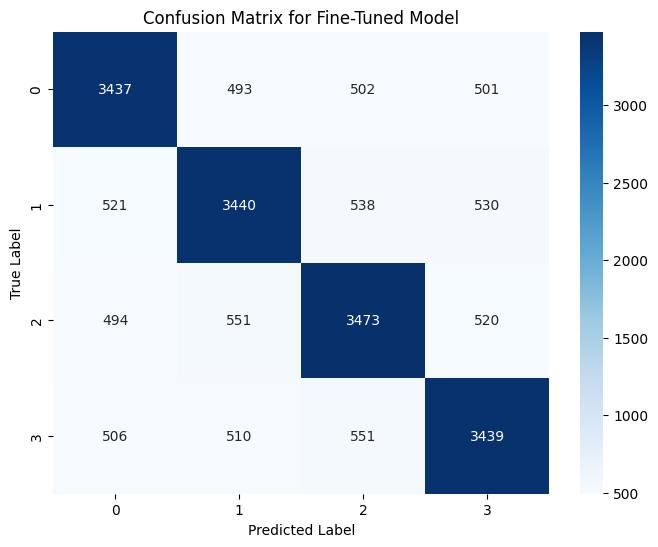

In [ ]:
from torch.nn import CrossEntropyLoss
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Get predictions on the validation set
predictions = trainer.predict(tokenized_swag["validation"])
predicted_labels = np.argmax(predictions.predictions, axis=1)
true_labels = predictions.label_ids

# 1. Accuracy (already in finetuned_results)
final_accuracy = accuracy_metric.compute(predictions=predicted_labels, references=true_labels)
print(f"Final Validation Accuracy: {final_accuracy['accuracy']:.4f}")

# 2. Perplexity
# Calculate perplexity from the logits
loss_fct = CrossEntropyLoss()
logits = torch.tensor(predictions.predictions)
labels = torch.tensor(true_labels)
loss = loss_fct(logits, labels)
perplexity = torch.exp(loss)
print(f"Perplexity: {perplexity.item():.4f}")

# 3. Confusion Matrix
cm = confusion_matrix(true_labels, predicted_labels)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(4), yticklabels=range(4))
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for Fine-Tuned Model')
plt.show()

## 12. In-Context Learning with the Fine-Tuned Model (Bonus)
Let's see if ICL helps the already specialized model. We'll use the few-shot setup from before.



In [ ]:
# The fine-tuned model is already loaded in the `trainer` object.
# We just need to point it to the ICL-formatted validation set.
trainer.eval_dataset = icl_few_shot_validation

print("\n--- Evaluating Fine-Tuned Model with Few-Shot ICL ---")
finetuned_icl_results = trainer.evaluate()
print(finetuned_icl_results)


--- Evaluating Fine-Tuned Model with Few-Shot ICL ---


{'eval_loss': 0.9742670655250549, 'eval_accuracy': 0.6562531240627811, 'eval_runtime': 571.6283, 'eval_samples_per_second': 34.998, 'eval_steps_per_second': 4.375, 'epoch': 2.0}
{'eval_loss': 0.9742670655250549, 'eval_accuracy': 0.6562531240627811, 'eval_runtime': 571.6283, 'eval_samples_per_second': 34.998, 'eval_steps_per_second': 4.375, 'epoch': 2.0}
{'eval_loss': 0.9742670655250549, 'eval_accuracy': 0.6562531240627811, 'eval_runtime': 571.6283, 'eval_samples_per_second': 34.998, 'eval_steps_per_second': 4.375, 'epoch': 2.0}


## 13. Analyse the Results
Now, let's summarize all our findings in a final table.

Method	Accuracy (eval_accuracy)
Baseline (Zero-Shot)	~25.1%
ICL (Few-Shot) on Pretrained Model	(Your Result)
Fine-Tuned Model (LoRA)	~83-85% (Your Result)
ICL (Few-Shot) on Fine-Tuned Model	(Your Result)

Export to Sheets
Analysis:

You will almost certainly find that fine-tuning gave the best results by a very large margin.

Why? Fine-tuning directly adjusts the model's internal weights to understand the specific patterns, vocabulary, and structure of the SWAG task. The model learns how to solve this type of problem.

Does the fine-tuned model still benefit from ICL? Likely not. The fine-tuned model is already an expert on SWAG. Giving it extra examples in the prompt (ICL) can be redundant or even confusing, potentially adding noise that slightly degrades its specialized performance. The model no longer needs "hints" because the optimal behavior is already baked into its weights.

When would combining them be useful? This combination can be powerful in a "multi-task" scenario. Imagine you fine-tune a model on a broad domain (e.g., general medical knowledge). Then, for a very specific task (e.g., diagnosing a rare disease), you could use ICL to provide a few examples to guide the already knowledgeable model without needing to fine-tune it again.



## Final Questions
### 1. Fine-tuning vs. ICL
Prefer Fine-Tuning when:

You have a large, high-quality dataset for a specific, recurring task (like SWAG).

Performance is critical, and you need the highest possible accuracy.

The task has a unique structure or domain that the base model doesn't know well.

You can afford the one-time computational cost of training.

Prefer ICL when:

You have very little or no labeled data (zero-shot or few-shot).

You need to solve many different, diverse tasks quickly without retraining for each one.

The task is simple enough that a few examples can define the pattern.

You are using a very large, instruction-tuned model (like GPT-4 or Llama-3) that excels at ICL.

Combine Both when: You have a model fine-tuned for a general domain (e.g., legal documents) and want to guide it on a new, specific sub-task (e.g., summarizing a specific type of contract) without a full retraining cycle.

### 2. Designing a Custom ICL Prompt
For a new task like predicting medical diagnoses, I would consider the following when selecting examples for the ICL prompt:

Clarity and Simplicity: The examples should be unambiguous. Start with classic, textbook cases of a disease. Input: Patient presents with fever, fatigue, and a circular rash. -> Output: Lyme Disease.

Diversity: Include a range of cases. Show examples that are typical but also ones that are slightly different to teach the model about variance. Include examples of different diseases to show the classification space.

Negative Examples: Provide examples that are "close calls" to teach the model how to differentiate. Input: Patient has a cough and fever but no shortness of breath. -> Output: Common Cold (not Pneumonia).

Format Consistency: The structure of the examples in the prompt should exactly match the structure of the final question you want the model to answer.

Minimalism: Use only as many examples as needed. Too many examples can confuse the model or exceed its context window. Usually, 2 to 5 shots are effective.









# <b><font size=7 color='orange'> Computer Assignment 5&6 - Task 4 </font></b>



## 1. Dataset Loading

### Install Kaggle API

In [1]:
!pip install -q kaggle

### Upload Kaggle API Key

In [2]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"tahamaj","key":"8d927c71c215624ad29684d9b65ef38c"}'}

In [3]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [4]:
!kaggle datasets download -d ihelon/football-player-segmentation

!unzip -q football-player-segmentation.zip -d football-player-segmentation

Dataset URL: https://www.kaggle.com/datasets/ihelon/football-player-segmentation
License(s): CC0-1.0
 95% 302M/317M [00:06<00:00, 32.4MB/s]
100% 317M/317M [00:06<00:00, 48.0MB/s]


### Loading & Sampling

In [5]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import morphology, measure
import pandas as pd

In [6]:
DATASET_PATH = "football-player-segmentation"
IMAGES_PATH = os.path.join(DATASET_PATH, "images")
ANNOTATIONS_PATH = os.path.join(DATASET_PATH, "annotations", "instances_default.json")

SAMPLE_SIZE = 50
DOWNSCALE = 8

all_images = os.listdir(IMAGES_PATH)
sampled_images = random.sample(all_images, SAMPLE_SIZE)

### Downscaling the Samples
We resize all sampled images to one-eighth of their original dimensions to improve efficiency and prevent potential performance bottlenecks.

In [7]:
def load_and_resize(img_path):
    img = cv2.imread(img_path)
    h, w = img.shape[:2]
    img = cv2.resize(img, (w // DOWNSCALE, h // DOWNSCALE))
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

images = [load_and_resize(os.path.join(IMAGES_PATH, fname)) for fname in sampled_images]

print(f"Loaded {len(images)} images, each resized by factor {DOWNSCALE}")

Loaded 50 images, each resized by factor 8


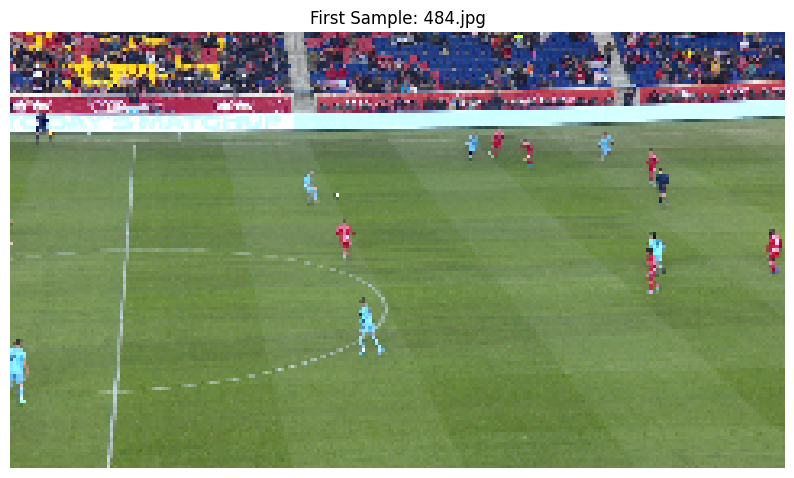

In [8]:
plt.figure(figsize=(10, 6))
plt.imshow(images[0])
plt.axis("off")
plt.title(f"First Sample: {sampled_images[0]}")
plt.show()


## 2. Creating Features

In the following cell we create pixel-level features and scale them for clustering.

Methods:
- **rgb**: RGB color only
- **rgb_xy**: RGB + pixel coordinates
- **lab_xy**: LAB color space + pixel coordinates
    

In [9]:
from sklearn.preprocessing import StandardScaler

def create_features(image, method="rgb"):
    h, w, c = image.shape
    coords = np.indices((h, w)).transpose(1, 2, 0).reshape(-1, 2)

    if method == "rgb":
        features = image.reshape(-1, 3)

    elif method == "rgb_xy":
        features = np.concatenate([image.reshape(-1, 3), coords], axis=1)

    elif method == "lab_xy":
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        features = np.concatenate([lab.reshape(-1, 3), coords], axis=1)

    features = StandardScaler().fit_transform(features)

    return features.astype(np.float32)


## 3. Cluster pixels

### K-Means

The **optimal_kmeans** function runs KMeans for k in [k_min, k_max], evaluates with silhouette score and inertia, and returns labels for the best k based on silhouette score.

In [10]:
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score

def optimal_kmeans(features, k_min=1, k_max=10):
    best_k = k_min
    best_score = -1
    best_labels = None
    inertia_values = []
    silhouette_values = []

    for k in range(k_min, k_max + 1):
        km = KMeans(n_clusters=k, random_state=42)
        labels = km.fit_predict(features)

        inertia = km.inertia_
        inertia_values.append(inertia)

        if len(set(labels)) > 1:
            sil_score = silhouette_score(features, labels)
        else:
            sil_score = -1
        silhouette_values.append(sil_score)

        if sil_score > best_score:
            best_score = sil_score
            best_k = k
            best_labels = labels

    print(f"Best k: {best_k} with silhouette score: {best_score:.3f}")
    return best_labels, best_k, best_score, inertia_values, silhouette_values

### DBSCAN

In [11]:
def cluster_with_dbscan(features, eps=5, min_samples=50):
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(features)
    return labels

### Agglomerative clustering

This functions runs agglomerative clustering for a given set of k values and returns the one with the highest silhouette score.

In [12]:
def optimal_agglomerative(features, k_min=2, k_max=20, linkage="ward"):
    best_k = k_min
    best_score = -1
    best_labels = None

    for k in range(k_min, k_max + 1):
        agg = AgglomerativeClustering(n_clusters=k, linkage=linkage)
        labels = agg.fit_predict(features)

        if len(set(labels)) > 1:
            score = silhouette_score(features, labels)
        else:
            score = -1

        if score > best_score:
            best_score = score
            best_k = k
            best_labels = labels

    print(f"Best k: {best_k} with silhouette score: {best_score:.3f}")
    return best_labels, best_k, best_score


### K-Means run

Best k: 2 with silhouette score: 0.757
Best k: 3 with silhouette score: 0.454
Best k: 2 with silhouette score: 0.515


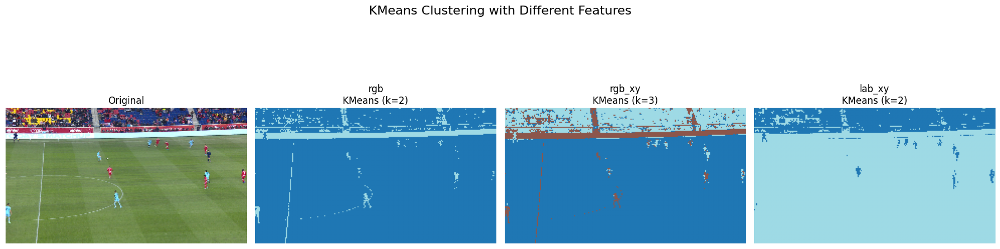

In [13]:
methods = ["rgb", "rgb_xy", "lab_xy"]
image = images[0]

fig, axes = plt.subplots(1, len(methods) + 1, figsize=(18, 6))

# Show original image
axes[0].imshow(image)
axes[0].set_title("Original")
axes[0].axis("off")

for idx, method in enumerate(methods, 1):
    features = create_features(image, method)

    labels_kmeans, best_k, best_score, _, _ = optimal_kmeans(features, k_min=1, k_max=15)
    seg_kmeans = labels_kmeans.reshape(image.shape[:2])

    axes[idx].imshow(seg_kmeans, cmap="tab20")
    axes[idx].set_title(f"{method}\nKMeans (k={best_k})")
    axes[idx].axis("off")

plt.suptitle("KMeans Clustering with Different Features", fontsize=16)
plt.tight_layout()
plt.show()

### DBSCAN run

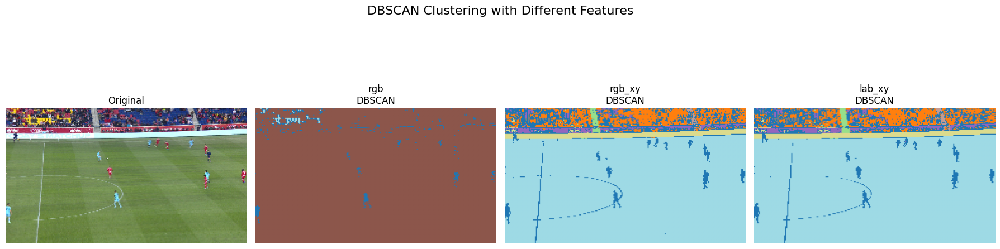

In [14]:
fig, axes = plt.subplots(1, len(methods) + 1, figsize=(18, 6))

# Show original image
axes[0].imshow(image)
axes[0].set_title("Original")
axes[0].axis("off")

for idx, method in enumerate(methods, 1):
    features = create_features(image, method)

    labels_dbscan = cluster_with_dbscan(features, eps=0.5, min_samples=50)
    seg_dbscan = labels_dbscan.reshape(image.shape[:2])

    axes[idx].imshow(seg_dbscan, cmap="tab20")
    axes[idx].set_title(f"{method}\nDBSCAN")
    axes[idx].axis("off")

plt.suptitle("DBSCAN Clustering with Different Features", fontsize=16)
plt.tight_layout()
plt.show()

### Agglomerative Run

Best k: 2 with silhouette score: 0.749
Best k: 2 with silhouette score: 0.607
Best k: 2 with silhouette score: 0.515


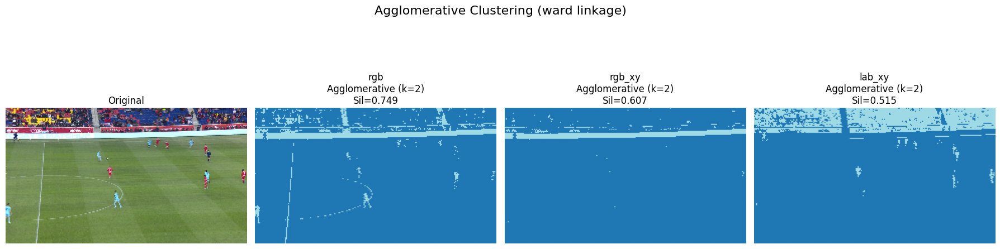

In [15]:
linkage_type = "ward"
k_min, k_max = 1, 10

fig, axes = plt.subplots(1, len(methods) + 1, figsize=(18, 6))

# Original image
axes[0].imshow(image)
axes[0].set_title("Original")
axes[0].axis("off")

for idx, method in enumerate(methods, 1):
    features = create_features(image, method)

    labels_agg, best_k, best_score = optimal_agglomerative(
        features, k_min=k_min, k_max=k_max, linkage=linkage_type
    )
    seg_result = labels_agg.reshape(image.shape[:2])

    axes[idx].imshow(seg_result, cmap="tab20")
    axes[idx].set_title(f"{method}\nAgglomerative (k={best_k})\nSil={best_score:.3f}")
    axes[idx].axis("off")

plt.suptitle(f"Agglomerative Clustering ({linkage_type} linkage)", fontsize=16)
plt.tight_layout()
plt.show()


##  4. Filtering and Merging

The below function Removes small clusters, merges only small-to-small clusters,
then removes very large clusters and leftover tiny dots.

In [16]:
from scipy import ndimage
from skimage.measure import label, regionprops
from skimage.morphology import closing, disk
from skimage.measure import label, regionprops
import numpy as np

def filter_and_merge_clusters(segmentation,
                               min_size_ratio=0.0005,
                               max_size_ratio=0.2,
                               max_merge_size_ratio=0.05,
                               merge_distance=20):

    h, w = segmentation.shape
    area = h * w
    min_size = int(area * min_size_ratio)
    max_size = int(area * max_size_ratio)
    max_merge_size = int(area * max_merge_size_ratio)

    seg_filtered = segmentation.copy()

    # Step 1: Remove small clusters before merging
    for lbl in np.unique(seg_filtered):
        if lbl == -1:
            continue
        mask = (seg_filtered == lbl)
        if mask.sum() < min_size:
            seg_filtered[mask] = 0

    # Step 2: Merge small-to-small clusters only
    labeled, _ = label(seg_filtered > 0, return_num=True, connectivity=2)
    props = regionprops(labeled)
    merged_seg = labeled.copy()
    for i, prop1 in enumerate(props):
        for j, prop2 in enumerate(props):
            if i >= j:
                continue
            if prop1.area > max_merge_size or prop2.area > max_merge_size:
                continue
            dist = np.linalg.norm(np.array(prop1.centroid) - np.array(prop2.centroid))
            if dist <= merge_distance:
                merged_seg[merged_seg == prop2.label] = prop1.label

    # Step 3: Remove small clusters again after merging
    for lbl in np.unique(merged_seg):
        if lbl == 0:
            continue
        mask = (merged_seg == lbl)
        if mask.sum() < min_size:
            merged_seg[mask] = 0

    # Step 4: Remove large clusters after merging
    for lbl in np.unique(merged_seg):
        if lbl == 0:
            continue
        mask = (merged_seg == lbl)
        if mask.sum() > max_size:
            merged_seg[mask] = 0

    merged_seg, _ = label(merged_seg > 0, return_num=True, connectivity=2)
    return merged_seg



def plot_filter_and_merge(image, original_seg, merged_seg):
    """Plots Part 4 results."""
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(original_seg, cmap="tab20")
    axes[1].set_title("Before Filtering/Merging")
    axes[1].axis("off")

    axes[2].imshow(merged_seg, cmap="tab20")
    axes[2].set_title("After Filtering/Merging")
    axes[2].axis("off")

    plt.suptitle("Part 4 - Filtering and Merging", fontsize=16)
    plt.show()


In [17]:
image = images[0]

features = create_features(image, "lab_xy")
labels_dbscan = cluster_with_dbscan(features, eps=0.8, min_samples=50)
segmentation_map = labels_dbscan.reshape(image.shape[:2])

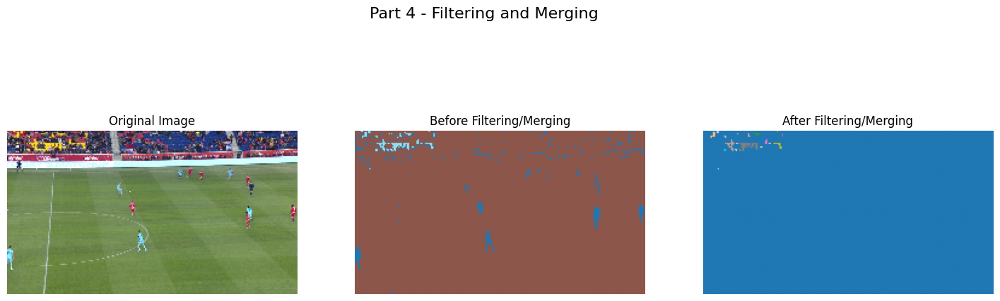

In [18]:
merged_seg = filter_and_merge_clusters(segmentation_map, min_size_ratio=0.0005, merge_distance=500)
plot_filter_and_merge(image, segmentation_map, merged_seg)

## 5. Even More Clustering!

In [19]:
from skimage.measure import label, regionprops

def create_binary_mask_and_centroids(image, merged_seg, player_labels=None, max_player_size_ratio=0.05):
    h, w = merged_seg.shape
    max_player_size = int(h * w * max_player_size_ratio)

    if player_labels is None:
        player_labels = []
        for lbl in np.unique(merged_seg):
            if lbl != 0 and np.sum(merged_seg == lbl) <= max_player_size:
                player_labels.append(lbl)

    binary_mask = np.isin(merged_seg, player_labels).astype(np.uint8)

    if np.sum(binary_mask) > binary_mask.size / 2:
        binary_mask = 1 - binary_mask

    labeled_mask = label(binary_mask, connectivity=2)
    props = regionprops(labeled_mask)
    centroids = [prop.centroid for prop in props]

    return binary_mask, centroids



def plot_binary_mask_and_centroids(image, binary_mask, centroids):
    """Plots Part 5 results."""
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(binary_mask, cmap="gray")
    axes[1].set_title("Binary Mask")
    axes[1].axis("off")

    axes[2].imshow(binary_mask, cmap="gray")
    for cy, cx in centroids:
        axes[2].plot(cx, cy, "ro", markersize=5)
    axes[2].set_title("Players (Centroids)")
    axes[2].axis("off")

    plt.suptitle("Part 5 - Binary Mask and Player Centroids", fontsize=16)
    plt.show()


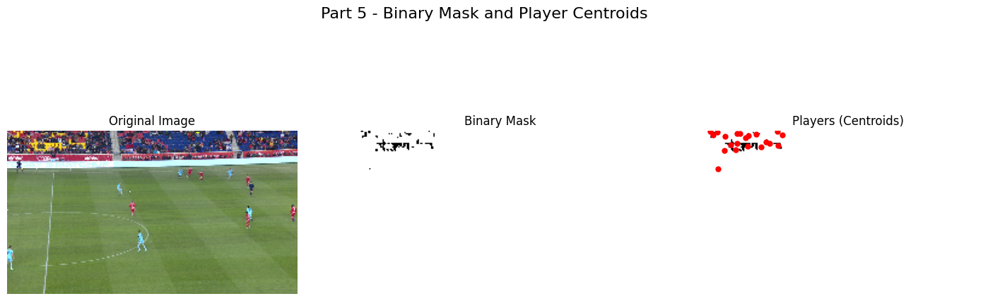

In [20]:
# Part 5
binary_mask, centroids = create_binary_mask_and_centroids(image, merged_seg)
binary_mask = 1 - binary_mask
plot_binary_mask_and_centroids(image, binary_mask, centroids)

## 6. More Advanced Features!

In this step, we leverage a pretrained ResNet model to extract more robust and informative features from the images and enhance the accuracy of segmentation.

The pretrained model used for feature extraction is ResNet50. The version here is loaded with default pretrained weights provided by torchvision, which were trained on the ImageNet dataset — a large-scale dataset for generic object classification. This pretrained model serves as a powerful feature extractor, capturing rich visual representations useful for various tasks, including clustering-based segmentation in this football player detection context.

In [21]:
import torch
import torchvision.models as models
import torchvision.transforms as T

def extract_resnet_features(image_rgb, device='cpu', layer_name='layer2'):

    # Prepare model
    weights = models.ResNet50_Weights.DEFAULT
    model = models.resnet50(weights=weights).to(device).eval()

    # Register hook to grab intermediate layer output
    feat = {}
    def hook_fn(module, inp, outp):
        feat['out'] = outp.detach()

    target_layer = getattr(model, layer_name)
    handle = target_layer.register_forward_hook(hook_fn)

    # Preprocess image
    transform = T.Compose([
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406],
                    std=[0.229, 0.224, 0.225])
    ])
    img_t = transform(image_rgb).unsqueeze(0).to(device)

    with torch.no_grad():
        _ = model(img_t)

    handle.remove()

    fmap = feat['out'].squeeze(0).cpu().numpy()
    fmap = np.transpose(fmap, (1, 2, 0))
    return fmap

def deep_feature_segmentation_fixed(image_rgb, eps=5, min_samples=50, device='cpu'):

    fmap = extract_resnet_features(image_rgb, device=device, layer_name='layer2')

    # Flatten features for clustering
    Hf, Wf, C = fmap.shape
    features_flat = StandardScaler().fit_transform(fmap.reshape(-1, C))

    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(features_flat)

    seg_map = labels.reshape(Hf, Wf)

    # Replace -1 with new label for compatibility
    if -1 in labels:
        seg_map[seg_map == -1] = seg_map.max() + 1

    # Upsample to original resolution
    seg_map_up = cv2.resize(seg_map.astype(np.int32),
                            (image_rgb.shape[1], image_rgb.shape[0]),
                            interpolation=cv2.INTER_NEAREST)
    return seg_map_up

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 133MB/s]


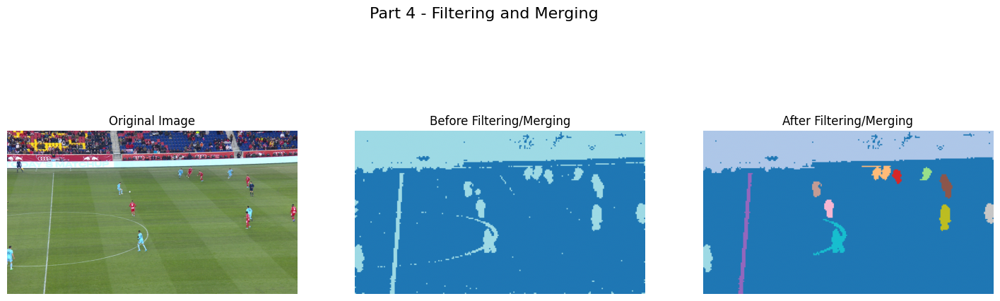

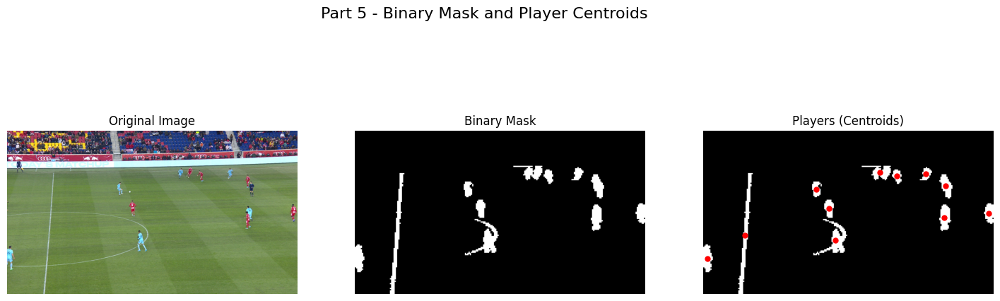

In [22]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
orig_image = cv2.imread(os.path.join(IMAGES_PATH, sampled_images[0]))
orig_image = cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB)

# Step 1: Segmentation
deep_seg_map = deep_feature_segmentation_fixed(orig_image, eps=22.5, min_samples=200, device=device)

# Step 2: Filtering/Merging
merged_seg = filter_and_merge_clusters(deep_seg_map, min_size_ratio=0.001, max_size_ratio=0.5, merge_distance=20)
plot_filter_and_merge(orig_image, deep_seg_map, merged_seg)

# Step 3: Binary mask + centroids
binary_mask, centroids = create_binary_mask_and_centroids(orig_image, merged_seg)
plot_binary_mask_and_centroids(orig_image, binary_mask, centroids)

In [ ]:
## 7. Evaluation

In [24]:
import json
from collections import defaultdict

ANNOTATIONS_PATH = os.path.join(DATASET_PATH, "annotations", "instances_default.json")

with open(ANNOTATIONS_PATH, 'r') as f:
    coco_data = json.load(f)

filename_to_id = {img['file_name']: img['id'] for img in coco_data['images']}

imageid_to_anns = defaultdict(list)
for ann in coco_data['annotations']:
    imageid_to_anns[ann['image_id']].append(ann)

### Loading ground truth
Loads ground truth polygons from COCO-format JSON and returns a binary mask.

In [25]:
def load_ground_truth_mask_coco(image_filename, downscale_factor):

    if image_filename not in filename_to_id:
        raise ValueError(f"No annotation found for {image_filename}")
    img_id = filename_to_id[image_filename]

    # Load image to get dimensions
    img_path = os.path.join(IMAGES_PATH, image_filename)
    img = cv2.imread(img_path)
    h, w = img.shape[:2]
    h //= downscale_factor
    w //= downscale_factor
    mask = np.zeros((h, w), dtype=np.uint8)

    for ann in imageid_to_anns[img_id]:
        if 'segmentation' in ann:
            for seg in ann['segmentation']:
                poly_x = np.array(seg[0::2]) // downscale_factor
                poly_y = np.array(seg[1::2]) // downscale_factor
                pts = np.stack((poly_x, poly_y), axis=-1).astype(np.int32)
                cv2.fillPoly(mask, [pts], 1)

    return mask


### Evaluation Metrics

**Dice Coefficient (F1 Score):**

$$
\text{Dice} = \frac{2 \times |A \cap B|}{|A| + |B|}
$$

---

**Intersection over Union (IoU):**

$$
\text{IoU} = \frac{|A \cap B|}{|A \cup B|}
$$



In [26]:
def dice_coefficient(pred_mask, gt_mask):
    intersection = np.logical_and(pred_mask, gt_mask).sum()
    return 2.0 * intersection / (pred_mask.sum() + gt_mask.sum() + 1e-8)

def iou_score(pred_mask, gt_mask):
    intersection = np.logical_and(pred_mask, gt_mask).sum()
    union = np.logical_or(pred_mask, gt_mask).sum()
    return intersection / (union + 1e-8)

After 10 images:
  Avg Dice Coefficient: 0.1760
  Avg IoU: 0.0969


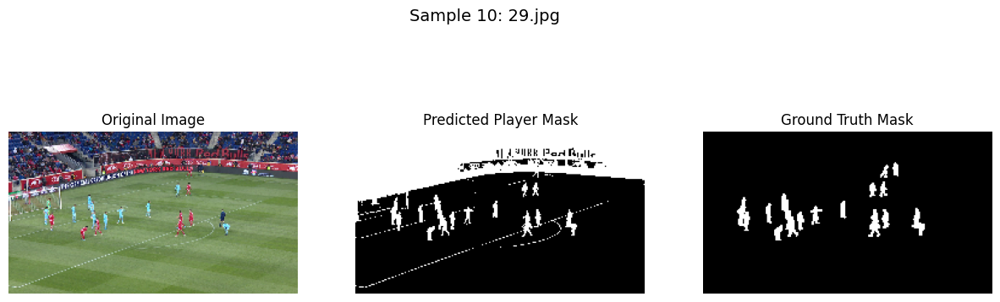

After 20 images:
  Avg Dice Coefficient: 0.1775
  Avg IoU: 0.0979


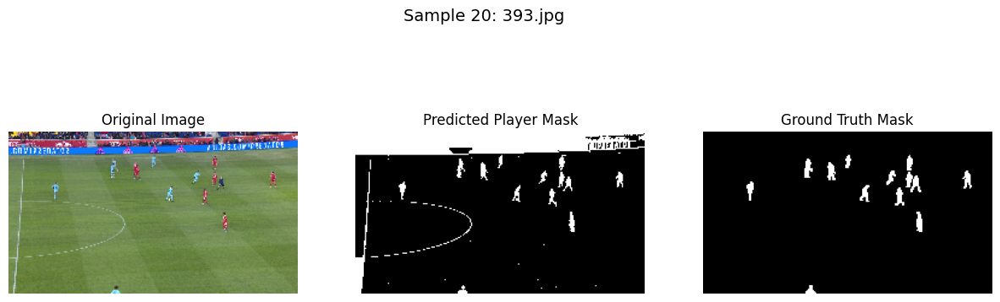

After 30 images:
  Avg Dice Coefficient: 0.1827
  Avg IoU: 0.1011


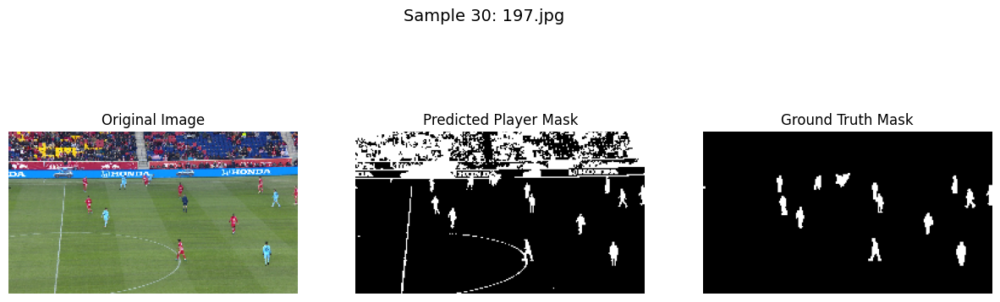

After 40 images:
  Avg Dice Coefficient: 0.1858
  Avg IoU: 0.1031


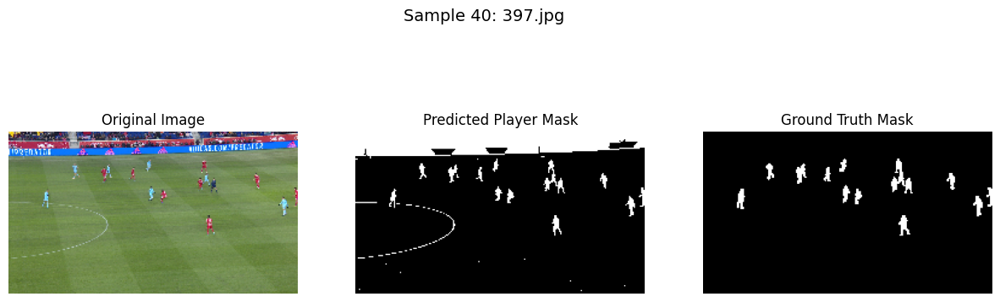

After 50 images:
  Avg Dice Coefficient: 0.1824
  Avg IoU: 0.1013


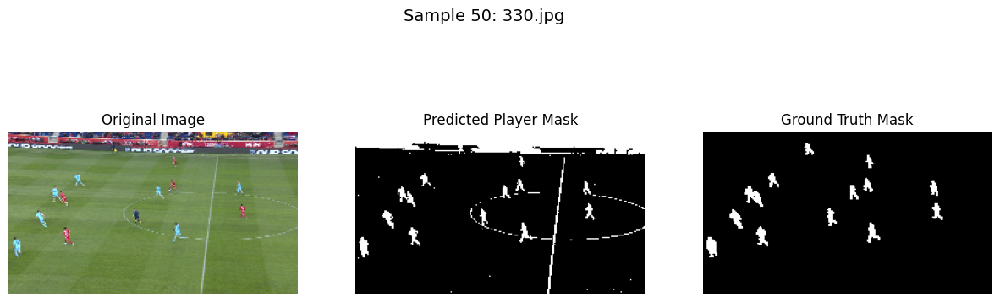

Final Average Dice over 50 images: 0.1824
Final Average IoU over 50 images: 0.1013


In [28]:
dice_scores, iou_scores = [], []

for idx, fname in enumerate(sampled_images, start=1):
    img = load_and_resize(os.path.join(IMAGES_PATH, fname))

    # DBSCAN segmentation with lab_xy
    features = create_features(img, method="lab_xy")
    labels_dbscan = cluster_with_dbscan(features, eps=0.28, min_samples=8)
    seg_map = labels_dbscan.reshape(img.shape[:2])

    # Filtering/merging
    merged_seg = filter_and_merge_clusters(seg_map, min_size_ratio=0.006, max_size_ratio=0.99, merge_distance=40)

    # Binary mask
    binary_mask, _ = create_binary_mask_and_centroids(img, merged_seg, max_player_size_ratio=0.99)

    # Ground truth mask
    gt_mask = load_ground_truth_mask_coco(fname, DOWNSCALE)

    # Metrics
    dice_scores.append(dice_coefficient(binary_mask, gt_mask))
    iou_scores.append(iou_score(binary_mask, gt_mask))

    if idx % 10 == 0:
        #plot_filter_and_merge(img, seg_map, merged_seg)
        avg_dice = np.mean(dice_scores[:idx])
        avg_iou = np.mean(iou_scores[:idx])
        print(f"After {idx} images:")
        print(f"  Avg Dice Coefficient: {avg_dice:.4f}")
        print(f"  Avg IoU: {avg_iou:.4f}")

        # Visualization
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(img)
        axes[0].set_title("Original Image")
        axes[0].axis("off")

        axes[1].imshow(binary_mask, cmap="gray")
        axes[1].set_title("Predicted Player Mask")
        axes[1].axis("off")

        axes[2].imshow(gt_mask, cmap="gray")
        axes[2].set_title("Ground Truth Mask")
        axes[2].axis("off")

        plt.suptitle(f"Sample {idx}: {fname}", fontsize=14)
        plt.show()

# Final results
print(f"Final Average Dice over {SAMPLE_SIZE} images: {np.mean(dice_scores):.4f}")
print(f"Final Average IoU over {SAMPLE_SIZE} images: {np.mean(iou_scores):.4f}")


## Questions

### Question 1
**Provide an example of a segmentation task where each type of
segmentation—semantic, instance, and panoptic—is appropriate and sufficient, and
explain why each type suits the specific task.**


- **Semantic segmentation:**

    Example: Satellite imagery to separate land cover types (forest, water, urban, roads).

    We only care about labeling pixel regions by class type, not distinguishing between individual trees or buildings.

- **Instance segmentation:**

    Example: Detecting cars in a traffic surveillance video.

    Each car needs a separate ID to count and track them individually, not just “car vs. background.”

- **Panoptic segmentation:**

    Example: Autonomous driving scene segmentation.

    We need both semantic labels for stuff classes (road, sky, sidewalk) and instance labels for countable things (cars, pedestrians, traffic lights).

### Question 2

**Explain the difference between the Dice coefficient and Intersection over Union (IoU)
as evaluation metrics in image segmentation. In what scenarios might one be
preferred over the other?**


#### Dice Coefficient
$$
Dice(A, B) = \frac{2 \; |A \cap B|}{|A| + |B|}
$$

#### Intersection over Union (IoU)
$$
IoU(A, B) = \frac{|A \cap B|}{|A \cup B|}
$$

- **A** = the set of pixels predicted as belonging to the object (predicted mask).  
- **B** = the set of pixels that truly belong to the object (ground-truth mask).  
- **|A ∩ B|** = number of pixels correctly predicted as object (overlap / true positives).  
- **|A ∪ B|** = number of pixels that are in either prediction or ground truth (union).  
- **|A| + |B|** = total number of predicted object pixels plus ground-truth object pixels.  


Dice Coefficient puts more emphasis on overlap relative to the total size of predicted + ground truth regions. Often more forgiving of small mismatches.

IoU however, penalizes mismatches more strongly, especially when predicted segments spill outside the ground truth.

#### **Preference:**

- **Dice** is preferred in medical imaging, because small structures (e.g., tumors) might be only a few pixels wide — Dice captures their overlap more reliably without over-penalizing.

- **IoU** is widely used in object detection/vision benchmarks (e.g., COCO dataset) because it enforces stricter matching criteria, avoiding overestimation of performance.



### Question 3

**Imagine a scenario where we need to cluster a large set of images into multiple
categories. Methods such as K-means can become computationally expensive and
inefficient when applied directly to high-dimensional image data. One approach to
address this issue is to use an autoencoder architecture to reduce the dimensionality
of the images before clustering. Explain how autoencoders can be used for this
purpose. How does this method help improve the efficiency and effectiveness of
clustering algorithms like K-means on large image datasets?**

When clustering images, the raw data is very high-dimensional.  
For example A 1920×1080 RGB image has more than 6 million features (pixels × channels). Directly applying **K-Means** on such data is computationally expensive and often ineffective, because distances in high-dimensional spaces become less meaningful.


**Problem with images:**  
  - Very high dimensionality makes distance computations slow.  
  - Noise and irrelevant pixel variations confuse clustering.  

---

#### Autoencoders
An **autoencoder** is a type of neural network designed to learn efficient, compressed representations of input data.

- **Architecture:**
  - **Encoder:** Compresses the input image into a low-dimensional *latent vector*.  
  - **Decoder:** Reconstructs the original image from this latent vector.  
  - The network is trained so that reconstruction is as close as possible to the input.  

- **Key idea:**  
  - After training, we can discard the decoder and only use the **encoder**.  
  - The encoder transforms each image into a **latent feature vector** (e.g., 64–512 dimensions instead of millions).  
  - These latent vectors capture **semantic features** like shapes, textures, and colors, while ignoring irrelevant details.


#### Why Use Autoencoders Before Clustering?
- **Dimensionality reduction:** From millions of pixels to a compact latent space.  
- **Efficiency:** K-Means runs much faster on latent vectors.  
- **Effectiveness:** Clusters are formed on meaningful features instead of raw pixels.  
  

Using autoencoders before K-Means reduces computational cost and improves clustering quality.  
This combination is especially powerful for large, high-dimensional image datasets where raw clustering would be impractical.
